In [1]:
import numpy as np
import pandas as pd
import folium
from folium.plugins import FastMarkerCluster
import matplotlib.pyplot as plt
import seaborn as sns
import os
from pathlib import Path

# Load Data

## Crime Data

In [2]:
crime_df = pd.read_csv(Path(os.getcwd())/'NYPD_Complaint_Data_Historic_2019.csv')
keep_cols = ['CMPLNT_NUM', 'CMPLNT_FR_DT', 'CMPLNT_TO_DT', 'LOC_OF_OCCUR_DESC', 'OFNS_DESC', 'PD_DESC','CRM_ATPT_CPTD_CD', 'LAW_CAT_CD',
             'BORO_NM', 'JURISDICTION_CODE', 'PREM_TYP_DESC', 'Latitude', 'Longitude', 'VIC_AGE_GROUP', 'VIC_RACE', 'VIC_SEX']
crime_df = crime_df[keep_cols].drop_duplicates()
crime_df.head()

,CMPLNT_NUM,CMPLNT_FR_DT,CMPLNT_TO_DT,LOC_OF_OCCUR_DESC,OFNS_DESC,PD_DESC,CRM_ATPT_CPTD_CD,LAW_CAT_CD,BORO_NM,JURISDICTION_CODE,PREM_TYP_DESC,Latitude,Longitude,VIC_AGE_GROUP,VIC_RACE,VIC_SEX
0,894386865,01/01/2019,12/27/2019,NaN,CRIMINAL MISCHIEF & RELATED OF,"CRIMINAL MISCHIEF 4TH, GRAFFIT",COMPLETED,MISDEMEANOR,BROOKLYN,0.0,OTHER,40.620410,-73.960486,UNKNOWN,UNKNOWN,E
1,921926672,01/01/2019,09/11/2019,INSIDE,GRAND LARCENY,"LARCENY,GRAND BY CREDIT CARD ACCT COMPROMISE-E...",COMPLETED,FELONY,QUEENS,0.0,COMMERCIAL BUILDING,40.733927,-73.871582,45-64,BLACK HISPANIC,M
2,548795490,01/01/2019,12/27/2019,OPPOSITE OF,CRIMINAL MISCHIEF & RELATED OF,"CRIMINAL MISCHIEF 4TH, GRAFFIT",COMPLETED,MISDEMEANOR,BROOKLYN,0.0,OTHER,40.628220,-73.962913,UNKNOWN,UNKNOWN,E
3,287029243,01/01/2019,12/27/2019,REAR OF,CRIMINAL MISCHIEF & RELATED OF,"CRIMINAL MISCHIEF 4TH, GRAFFIT",COMPLETED,MISDEMEANOR,BROOKLYN,0.0,CHAIN STORE,40.654215,-73.959576,UNKNOWN,UNKNOWN,D
4,139970812,01/01/2019,NaN,NaN,CRIMINAL MISCHIEF & RELATED OF,"CRIMINAL MISCHIEF 4TH, GRAFFIT",COMPLETED,MISDEMEANOR,QUEENS,0.0,HIGHWAY/PARKWAY,40.666411,-73.740103,UNKNOWN,UNKNOWN,E


In [3]:
crime_df['VIC_AGE_GROUP'].value_counts()

25-44      160183
UNKNOWN    124984
45-64       84064
18-24       43453
<18         19163
65+         19086
-56             3
936             3
-954            2
-2              2
-943            2
-970            2
-967            2
929             1
-39             1
956             1
943             1
-934            1
938             1
937             1
1013            1
1018            1
927             1
-50             1
-961            1
-942            1
941             1
-952            1
-948            1
-946            1
-974            1
-71             1
-978            1
960             1
-69             1
951             1
-67             1
Name: VIC_AGE_GROUP, dtype: int64

Yeah, those are errors if I've ever seen them. Fortunately, there are very few - we'll just drop those rows. We'll remove duplicate rows too.

In [4]:
crime_df = crime_df[crime_df['VIC_AGE_GROUP'].isin(crime_df['VIC_AGE_GROUP'].value_counts().index[0:6])]
crime_df.drop_duplicates(inplace=True)

In [5]:
crime_df.describe()

,CMPLNT_NUM,JURISDICTION_CODE,Latitude,Longitude
count,4.509330e+05,450641.000000,450933.000000,450933.000000
mean,5.503808e+08,0.917145,40.737274,-73.924502
std,2.599459e+08,8.132629,0.082637,0.076187
min,1.000004e+08,0.000000,40.498957,-74.253403
25%,3.250604e+08,0.000000,40.675284,-73.973166
50%,5.508526e+08,0.000000,40.735331,-73.927136
75%,7.758631e+08,0.000000,40.812642,-73.882667
max,9.999959e+08,97.000000,40.912723,-73.700720


In [6]:
crime_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 450933 entries, 0 to 450975
Data columns (total 16 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   CMPLNT_NUM         450933 non-null  int64  
 1   CMPLNT_FR_DT       450933 non-null  object 
 2   CMPLNT_TO_DT       394641 non-null  object 
 3   LOC_OF_OCCUR_DESC  369203 non-null  object 
 4   OFNS_DESC          450925 non-null  object 
 5   PD_DESC            450641 non-null  object 
 6   CRM_ATPT_CPTD_CD   450933 non-null  object 
 7   LAW_CAT_CD         450933 non-null  object 
 8   BORO_NM            450634 non-null  object 
 9   JURISDICTION_CODE  450641 non-null  float64
 10  PREM_TYP_DESC      449148 non-null  object 
 11  Latitude           450933 non-null  float64
 12  Longitude          450933 non-null  float64
 13  VIC_AGE_GROUP      450933 non-null  object 
 14  VIC_RACE           450933 non-null  object 
 15  VIC_SEX            450933 non-null  object 
dtypes:

In [7]:
loc_df = pd.read_csv(Path(os.getcwd())/'NHoodNameCentroids.csv')
loc_df.head()

,Name,Borough,Long_Lat
0,Annadale,Staten Island,(-74.17854866165885 40.538114174745104)
1,Arden Heights,Staten Island,(-74.185886745839 40.549285822783254)
2,Arlington,Staten Island,(-74.16510420241131 40.63532509911496)
3,Arrochar,Staten Island,(-74.06712363225581 40.596312571276776)
4,Arverne,Queens,(-73.7919923313695 40.58914394372975)


In [8]:
loc_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 299 entries, 0 to 298
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   Name      299 non-null    object
 1   Borough   299 non-null    object
 2   Long_Lat  299 non-null    object
dtypes: object(3)
memory usage: 7.1+ KB


# Data Preparation
To use the data, we need to be able to cluster it into neighbourhoods. We do this through our locations dataframe. 

In [9]:
loc_df['Long_Lat'] = loc_df['Long_Lat'].apply(lambda x: x[1:-1])
loc_df['Long_Lat'] = loc_df['Long_Lat'].str.split().str.join(', ')
loc_df['Longitude']= loc_df['Long_Lat'].str.split(', ', expand=True).iloc[:, 0].astype(float)
loc_df['Latitude'] = loc_df['Long_Lat'].str.split(', ', expand=True).iloc[:, 1].astype(float)
loc_df.head()

,Name,Borough,Long_Lat,Longitude,Latitude
0,Annadale,Staten Island,"-74.17854866165885, 40.538114174745104",-74.178549,40.538114
1,Arden Heights,Staten Island,"-74.185886745839, 40.549285822783254",-74.185887,40.549286
2,Arlington,Staten Island,"-74.16510420241131, 40.63532509911496",-74.165104,40.635325
3,Arrochar,Staten Island,"-74.06712363225581, 40.596312571276776",-74.067124,40.596313
4,Arverne,Queens,"-73.7919923313695, 40.58914394372975",-73.791992,40.589144


In [10]:
lon = loc_df['Long_Lat'].str.split(', ', expand=True).iloc[:, 0].astype(float).mean()
lat = loc_df['Long_Lat'].str.split(', ', expand=True).iloc[:, 1].astype(float).mean()
map_nyc = folium.Map(location = [lat, lon])

for lat, lng, borough, neighbourhood in zip(loc_df['Latitude'], loc_df['Longitude'], loc_df['Borough'], loc_df['Name']):
    label = '{}, {}'.format(neighbourhood, borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker([lat, lng],
                        radius=4,
                        popup=label,
                        color='red',
                        fill=True,
                        fill_color='red',
                        fill_opacity=0.4,
                        parse_html=False).add_to(map_nyc)

#visualise a small sample of crimes as well, to check there aren't any problems    
cmap_df = crime_df.sample(300)
for lat, lon, name in zip(cmap_df['Latitude'], cmap_df['Longitude'], cmap_df['OFNS_DESC']):
    label = f'{name}'
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker([lat, lon],
                        radius=3,
                        popup=label,
                        color='blue',
                        fill=True,
                        fill_color='blue',
                        fill_opacity=0.4,
                        parse_html=False).add_to(map_nyc)


map_nyc

In [11]:
crime_df['Latitude'] = crime_df['Latitude'].astype(float)
crime_df['Longitude'] = crime_df['Longitude'].astype(float)

crime_df.describe()

,CMPLNT_NUM,JURISDICTION_CODE,Latitude,Longitude
count,4.509330e+05,450641.000000,450933.000000,450933.000000
mean,5.503808e+08,0.917145,40.737274,-73.924502
std,2.599459e+08,8.132629,0.082637,0.076187
min,1.000004e+08,0.000000,40.498957,-74.253403
25%,3.250604e+08,0.000000,40.675284,-73.973166
50%,5.508526e+08,0.000000,40.735331,-73.927136
75%,7.758631e+08,0.000000,40.812642,-73.882667
max,9.999959e+08,97.000000,40.912723,-73.700720


We now need to discover which neighbourhood a crime occurred in: we can do this using sklearn's BallTree algorithm (BallTrees are a structure that clusters nearby points - think of a decision tree, but instead of leaves you have hyperspheres). This algorithm is chosen both for speed, and because it has a native Haversine distance metric - the Haversine formula is used to determine distances on the surface of a sphere, like the Earth (pretty much) is.

In [12]:
from sklearn.neighbors import BallTree

bt = BallTree(np.deg2rad(loc_df[['Latitude', 'Longitude']].values), metric='haversine')
distances, indices = bt.query(np.deg2rad(np.c_[crime_df['Latitude'].tolist(),crime_df['Longitude'].tolist()]))

indices = np.array([x[0] for x in indices])
neighbourhoods = loc_df['Name'].iloc[indices]
crime_df['Neighbourhood'] = neighbourhoods.reset_index(drop=True)
crime_df

,CMPLNT_NUM,CMPLNT_FR_DT,CMPLNT_TO_DT,LOC_OF_OCCUR_DESC,OFNS_DESC,PD_DESC,CRM_ATPT_CPTD_CD,LAW_CAT_CD,BORO_NM,JURISDICTION_CODE,PREM_TYP_DESC,Latitude,Longitude,VIC_AGE_GROUP,VIC_RACE,VIC_SEX,Neighbourhood
0,894386865,01/01/2019,12/27/2019,NaN,CRIMINAL MISCHIEF & RELATED OF,"CRIMINAL MISCHIEF 4TH, GRAFFIT",COMPLETED,MISDEMEANOR,BROOKLYN,0.0,OTHER,40.620410,-73.960486,UNKNOWN,UNKNOWN,E,Midwood
1,921926672,01/01/2019,09/11/2019,INSIDE,GRAND LARCENY,"LARCENY,GRAND BY CREDIT CARD ACCT COMPROMISE-E...",COMPLETED,FELONY,QUEENS,0.0,COMMERCIAL BUILDING,40.733927,-73.871582,45-64,BLACK HISPANIC,M,Lefrak City
2,548795490,01/01/2019,12/27/2019,OPPOSITE OF,CRIMINAL MISCHIEF & RELATED OF,"CRIMINAL MISCHIEF 4TH, GRAFFIT",COMPLETED,MISDEMEANOR,BROOKLYN,0.0,OTHER,40.628220,-73.962913,UNKNOWN,UNKNOWN,E,Midwood
3,287029243,01/01/2019,12/27/2019,REAR OF,CRIMINAL MISCHIEF & RELATED OF,"CRIMINAL MISCHIEF 4TH, GRAFFIT",COMPLETED,MISDEMEANOR,BROOKLYN,0.0,CHAIN STORE,40.654215,-73.959576,UNKNOWN,UNKNOWN,D,Prospect Lefferts Gardens
4,139970812,01/01/2019,NaN,NaN,CRIMINAL MISCHIEF & RELATED OF,"CRIMINAL MISCHIEF 4TH, GRAFFIT",COMPLETED,MISDEMEANOR,QUEENS,0.0,HIGHWAY/PARKWAY,40.666411,-73.740103,UNKNOWN,UNKNOWN,E,Laurelton
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
450971,947831880,12/31/2019,12/31/2019,REAR OF,MISCELLANEOUS PENAL LAW,"IMPERSONATION 1, POLICE OFFICE",COMPLETED,FELONY,QUEENS,0.0,PARKING LOT/GARAGE (PRIVATE),40.671050,-73.843037,25-44,BLACK,M,NaN
450972,167545117,12/31/2019,12/31/2019,NaN,ASSAULT 3 & RELATED OFFENSES,ASSAULT 3,COMPLETED,MISDEMEANOR,BROOKLYN,0.0,TAXI (LIVERY LICENSED),40.677026,-73.921819,45-64,BLACK,M,NaN
450973,501183351,12/31/2019,12/31/2019,INSIDE,CRIMINAL MISCHIEF & RELATED OF,"CRIMINAL MISCHIEF,UNCLASSIFIED 4",COMPLETED,MISDEMEANOR,BRONX,2.0,RESIDENCE - PUBLIC HOUSING,40.834227,-73.905260,UNKNOWN,UNKNOWN,D,NaN
450974,142572357,12/31/2019,12/31/2019,INSIDE,PETIT LARCENY,"LARCENY,PETIT FROM BUILDING,UN",COMPLETED,MISDEMEANOR,BROOKLYN,0.0,TELECOMM. STORE,40.648194,-74.007115,25-44,WHITE HISPANIC,F,NaN


In [13]:
crime_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 450933 entries, 0 to 450975
Data columns (total 17 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   CMPLNT_NUM         450933 non-null  int64  
 1   CMPLNT_FR_DT       450933 non-null  object 
 2   CMPLNT_TO_DT       394641 non-null  object 
 3   LOC_OF_OCCUR_DESC  369203 non-null  object 
 4   OFNS_DESC          450925 non-null  object 
 5   PD_DESC            450641 non-null  object 
 6   CRM_ATPT_CPTD_CD   450933 non-null  object 
 7   LAW_CAT_CD         450933 non-null  object 
 8   BORO_NM            450634 non-null  object 
 9   JURISDICTION_CODE  450641 non-null  float64
 10  PREM_TYP_DESC      449148 non-null  object 
 11  Latitude           450933 non-null  float64
 12  Longitude          450933 non-null  float64
 13  VIC_AGE_GROUP      450933 non-null  object 
 14  VIC_RACE           450933 non-null  object 
 15  VIC_SEX            450933 non-null  object 
 16  Ne

In [14]:
crime_df[crime_df['CMPLNT_TO_DT'] != crime_df['CMPLNT_FR_DT']].describe()#.head()

,CMPLNT_NUM,JURISDICTION_CODE,Latitude,Longitude
count,1.202380e+05,119946.000000,120238.000000,120238.000000
mean,5.513261e+08,0.604589,40.748119,-73.921317
std,2.598187e+08,6.544081,0.086711,0.076170
min,1.000004e+08,0.000000,40.498957,-74.253403
25%,3.262434e+08,0.000000,40.679618,-73.966215
50%,5.526894e+08,0.000000,40.749388,-73.919458
75%,7.772294e+08,0.000000,40.827414,-73.877946
max,9.999945e+08,97.000000,40.912723,-73.700957


Around a quarter of incidents are protracted - that is, they last more than one day. We will record how long an indicdent was active to see if there are areas where delayed outcomes are more or less common, or if it broadly location-independent.

In [15]:
crime_df['CMPLNT_FR_DT'] = pd.to_datetime(crime_df['CMPLNT_FR_DT'], errors='coerce')
crime_df['CMPLNT_TO_DT'] = pd.to_datetime(crime_df['CMPLNT_TO_DT'], errors='coerce')
#convert start and end date to a duration
crime_df['duration'] = (crime_df['CMPLNT_TO_DT'] - crime_df['CMPLNT_FR_DT']).dt.days
crime_df.drop(['CMPLNT_TO_DT', 'CMPLNT_FR_DT'], axis=1, inplace=True)
crime_df.head()

,CMPLNT_NUM,LOC_OF_OCCUR_DESC,OFNS_DESC,PD_DESC,CRM_ATPT_CPTD_CD,LAW_CAT_CD,BORO_NM,JURISDICTION_CODE,PREM_TYP_DESC,Latitude,Longitude,VIC_AGE_GROUP,VIC_RACE,VIC_SEX,Neighbourhood,duration
0,894386865,NaN,CRIMINAL MISCHIEF & RELATED OF,"CRIMINAL MISCHIEF 4TH, GRAFFIT",COMPLETED,MISDEMEANOR,BROOKLYN,0.0,OTHER,40.620410,-73.960486,UNKNOWN,UNKNOWN,E,Midwood,360.0
1,921926672,INSIDE,GRAND LARCENY,"LARCENY,GRAND BY CREDIT CARD ACCT COMPROMISE-E...",COMPLETED,FELONY,QUEENS,0.0,COMMERCIAL BUILDING,40.733927,-73.871582,45-64,BLACK HISPANIC,M,Lefrak City,253.0
2,548795490,OPPOSITE OF,CRIMINAL MISCHIEF & RELATED OF,"CRIMINAL MISCHIEF 4TH, GRAFFIT",COMPLETED,MISDEMEANOR,BROOKLYN,0.0,OTHER,40.628220,-73.962913,UNKNOWN,UNKNOWN,E,Midwood,360.0
3,287029243,REAR OF,CRIMINAL MISCHIEF & RELATED OF,"CRIMINAL MISCHIEF 4TH, GRAFFIT",COMPLETED,MISDEMEANOR,BROOKLYN,0.0,CHAIN STORE,40.654215,-73.959576,UNKNOWN,UNKNOWN,D,Prospect Lefferts Gardens,360.0
4,139970812,NaN,CRIMINAL MISCHIEF & RELATED OF,"CRIMINAL MISCHIEF 4TH, GRAFFIT",COMPLETED,MISDEMEANOR,QUEENS,0.0,HIGHWAY/PARKWAY,40.666411,-73.740103,UNKNOWN,UNKNOWN,E,Laurelton,NaN


In [16]:
crime_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 450933 entries, 0 to 450975
Data columns (total 16 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   CMPLNT_NUM         450933 non-null  int64  
 1   LOC_OF_OCCUR_DESC  369203 non-null  object 
 2   OFNS_DESC          450925 non-null  object 
 3   PD_DESC            450641 non-null  object 
 4   CRM_ATPT_CPTD_CD   450933 non-null  object 
 5   LAW_CAT_CD         450933 non-null  object 
 6   BORO_NM            450634 non-null  object 
 7   JURISDICTION_CODE  450641 non-null  float64
 8   PREM_TYP_DESC      449148 non-null  object 
 9   Latitude           450933 non-null  float64
 10  Longitude          450933 non-null  float64
 11  VIC_AGE_GROUP      450933 non-null  object 
 12  VIC_RACE           450933 non-null  object 
 13  VIC_SEX            450933 non-null  object 
 14  Neighbourhood      450890 non-null  object 
 15  duration           394641 non-null  float64
dtypes:

Now we'll drop rows with missing data so for everything we keep we'll have a duration and be able to distinguish indoor or outdoor incidents.

In [17]:
crime_df.dropna(inplace=True)
crime_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 322812 entries, 1 to 450932
Data columns (total 16 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   CMPLNT_NUM         322812 non-null  int64  
 1   LOC_OF_OCCUR_DESC  322812 non-null  object 
 2   OFNS_DESC          322812 non-null  object 
 3   PD_DESC            322812 non-null  object 
 4   CRM_ATPT_CPTD_CD   322812 non-null  object 
 5   LAW_CAT_CD         322812 non-null  object 
 6   BORO_NM            322812 non-null  object 
 7   JURISDICTION_CODE  322812 non-null  float64
 8   PREM_TYP_DESC      322812 non-null  object 
 9   Latitude           322812 non-null  float64
 10  Longitude          322812 non-null  float64
 11  VIC_AGE_GROUP      322812 non-null  object 
 12  VIC_RACE           322812 non-null  object 
 13  VIC_SEX            322812 non-null  object 
 14  Neighbourhood      322812 non-null  object 
 15  duration           322812 non-null  float64
dtypes:

Some of these features are more useful to us if we one-hot encode them, so we will:

In [18]:
#and dummy encode others
crime_df = pd.merge(crime_df, pd.get_dummies(crime_df['LAW_CAT_CD']),
                   left_index=True, right_index=True) 

crime_df['JURISDICTION_CODE'] = crime_df['JURISDICTION_CODE'].map(lambda x: x if x < 3 else 3)
crime_df = pd.merge(crime_df, pd.get_dummies(crime_df['JURISDICTION_CODE']),
                    left_index=True, right_index=True)
crime_df.rename(columns = {0.0:'Internal - Police', 1.0:'Internal - Transit', 2.0: 'Internal - Housing', 3.0:'External'},
                inplace=True)

crime_df = pd.merge(crime_df, pd.get_dummies(crime_df['BORO_NM']),
                    left_index=True, right_index=True)

crime_df

,CMPLNT_NUM,LOC_OF_OCCUR_DESC,OFNS_DESC,PD_DESC,CRM_ATPT_CPTD_CD,LAW_CAT_CD,BORO_NM,JURISDICTION_CODE,PREM_TYP_DESC,Latitude,...,MISDEMEANOR,VIOLATION,Internal - Police,Internal - Housing,External,BRONX,BROOKLYN,MANHATTAN,QUEENS,STATEN ISLAND
1,921926672,INSIDE,GRAND LARCENY,"LARCENY,GRAND BY CREDIT CARD ACCT COMPROMISE-E...",COMPLETED,FELONY,QUEENS,0.0,COMMERCIAL BUILDING,40.733927,...,0,0,1,0,0,0,0,0,1,0
2,548795490,OPPOSITE OF,CRIMINAL MISCHIEF & RELATED OF,"CRIMINAL MISCHIEF 4TH, GRAFFIT",COMPLETED,MISDEMEANOR,BROOKLYN,0.0,OTHER,40.628220,...,1,0,1,0,0,0,1,0,0,0
3,287029243,REAR OF,CRIMINAL MISCHIEF & RELATED OF,"CRIMINAL MISCHIEF 4TH, GRAFFIT",COMPLETED,MISDEMEANOR,BROOKLYN,0.0,CHAIN STORE,40.654215,...,1,0,1,0,0,0,1,0,0,0
5,485024356,FRONT OF,CRIMINAL MISCHIEF & RELATED OF,"CRIMINAL MISCHIEF 4TH, GRAFFIT",COMPLETED,MISDEMEANOR,BROOKLYN,2.0,RESIDENCE - PUBLIC HOUSING,40.693021,...,1,0,0,1,0,0,1,0,0,0
6,344711717,INSIDE,GRAND LARCENY,"LARCENY,GRAND BY OPEN/COMPROMISE CELL PHONE ACCT",COMPLETED,FELONY,MANHATTAN,0.0,RESIDENCE-HOUSE,40.784051,...,0,0,1,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
450927,366676215,INSIDE,MISCELLANEOUS PENAL LAW,CRIMINAL CONTEMPT 1,COMPLETED,FELONY,BROOKLYN,0.0,RESIDENCE - APT. HOUSE,40.696332,...,0,0,1,0,0,0,1,0,0,0
450928,560650292,INSIDE,HARRASSMENT 2,"HARASSMENT,SUBD 3,4,5",COMPLETED,VIOLATION,BRONX,0.0,COMMERCIAL BUILDING,40.843066,...,0,1,1,0,0,1,0,0,0,0
450929,521583561,INSIDE,HARRASSMENT 2,"HARASSMENT,SUBD 1,CIVILIAN",COMPLETED,VIOLATION,BROOKLYN,0.0,DRY CLEANER/LAUNDRY,40.660254,...,0,1,1,0,0,0,1,0,0,0
450931,453732985,INSIDE,PETIT LARCENY,"LARCENY,PETIT FROM BUILDING,UNATTENDED, PACKAG...",COMPLETED,MISDEMEANOR,QUEENS,0.0,RESIDENCE - APT. HOUSE,40.737196,...,1,0,1,0,0,0,0,0,1,0


Using FourSquare, we'll get records of the types of businesses in each neighbourhood.

In [19]:
import requests
creds = pd.read_csv(Path(os.getcwd())/'foursquare_creds.csv') #read foursquare details from saved file
CLIENT_ID = creds.loc[0][0]
CLIENT_SECRET = creds.loc[0][1]
VERSION = creds.loc[0][2]
LIMIT = 100
def get_nearby_venues(names, latitudes, longitudes, radius=500):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        get = requests.get(url).json()
        print(get)
        results = get["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

nyc_venues = get_nearby_venues(loc_df['Name'], loc_df['Latitude'], loc_df['Longitude'])
nyc_venues

{'meta': {'code': 200, 'requestId': '5f6f10efbf0fb32ebd98d28a'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': '$-$$$$', 'key': 'price'}]}, 'headerLocation': 'Current map view', 'headerFullLocation': 'Current map view', 'headerLocationGranularity': 'unknown', 'totalResults': 11, 'suggestedBounds': {'ne': {'lat': 40.542614179245106, 'lng': -74.17263845444315}, 'sw': {'lat': 40.5336141702451, 'lng': -74.18445886887456}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4aa06637f964a5207c3f20e3', 'name': 'Annadale Diner', 'location': {'address': '813 Annadale Rd', 'lat': 40.542078590578434, 'lng': -74.17732507824499, 'labeledLatLngs': [{'label': 'display', 'lat': 40.542078590578434, 'lng': -74.17732507824499}, {'label': 'entrance', 'lat': 40.542054, 'lng': -74.177171}], 'distance'

{'meta': {'code': 200, 'requestId': '5f6f10ef8d662d2466cf7bbf'}, 'response': {'headerLocation': 'Current map view', 'headerFullLocation': 'Current map view', 'headerLocationGranularity': 'unknown', 'totalResults': 5, 'suggestedBounds': {'ne': {'lat': 40.55378582728326, 'lng': -74.17997555279086}, 'sw': {'lat': 40.54478581828325, 'lng': -74.19179793888713}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4bb4c4c8613fb713e62594e6', 'name': 'Villa Monte Pizzeria & Restaurant', 'location': {'address': '240 Arden Ave', 'lat': 40.552555412237844, 'lng': -74.18621192742891, 'labeledLatLngs': [{'label': 'display', 'lat': 40.552555412237844, 'lng': -74.18621192742891}], 'distance': 365, 'postalCode': '10312', 'cc': 'US', 'city': 'Staten Island', 'state': 'NY', 'country': 'United States', 'formattedAddress': ['240 Arden

{'meta': {'code': 200, 'requestId': '5f6f10f0eb6bac0a34c6605c'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': 'Open now', 'key': 'openNow'}]}, 'headerLocation': 'Current map view', 'headerFullLocation': 'Current map view', 'headerLocationGranularity': 'unknown', 'totalResults': 22, 'suggestedBounds': {'ne': {'lat': 40.60081257577678, 'lng': -74.06120828329726}, 'sw': {'lat': 40.591812566776774, 'lng': -74.07303898121437}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4c0806a4009a0f473473e5bf', 'name': 'Via Ponte Pizzeria', 'location': {'address': '147 McClean Ave', 'lat': 40.598046000000004, 'lng': -74.06708, 'labeledLatLngs': [{'label': 'display', 'lat': 40.598046000000004, 'lng': -74.06708}, {'label': 'entrance', 'lat': 40.597971, 'lng': -74.067024}], 'distance': 192, 'p

{'meta': {'code': 200, 'requestId': '5f6f10f0ffd2c34bdca27c0f'}, 'response': {'headerLocation': 'Arverne', 'headerFullLocation': 'Arverne, Queens', 'headerLocationGranularity': 'neighborhood', 'totalResults': 20, 'suggestedBounds': {'ne': {'lat': 40.593643948229754, 'lng': -73.78607761656136}, 'sw': {'lat': 40.58464393922975, 'lng': -73.79790704617764}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4dc74607d164eb9ca01ceb17', 'name': 'Rockaway Beach - 60th Street', 'location': {'address': 'Beach 60th Street', 'crossStreet': 'Shorefront', 'lat': 40.5893277990744, 'lng': -73.78914416625615, 'labeledLatLngs': [{'label': 'display', 'lat': 40.5893277990744, 'lng': -73.78914416625615}], 'distance': 241, 'postalCode': '11692', 'cc': 'US', 'city': 'Queens', 'state': 'NY', 'country': 'United States', 'formattedAddress

{'meta': {'code': 200, 'requestId': '5f6f10f1b5d8f1459563e61e'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': '$-$$$$', 'key': 'price'}]}, 'headerLocation': 'Astoria', 'headerFullLocation': 'Astoria, Queens', 'headerLocationGranularity': 'neighborhood', 'totalResults': 102, 'suggestedBounds': {'ne': {'lat': 40.77300859785497, 'lng': -73.90972309237965}, 'sw': {'lat': 40.76400858885496, 'lng': -73.92158439370517}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4bdf502a89ca76b062b75d5e', 'name': 'Favela Grill', 'location': {'address': '33-18 28th Ave', 'crossStreet': 'btwn 33rd & 34th St.', 'lat': 40.76734843380796, 'lng': -73.91789747356819, 'labeledLatLngs': [{'label': 'display', 'lat': 40.76734843380796, 'lng': -73.91789747356819}], 'distance': 229, 'postalCode': '11103', 

{'meta': {'code': 200, 'requestId': '5f6f10f1eb6bac0a34c66416'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': 'Open now', 'key': 'openNow'}]}, 'headerLocation': 'Astoria', 'headerFullLocation': 'Astoria, Queens', 'headerLocationGranularity': 'neighborhood', 'totalResults': 13, 'suggestedBounds': {'ne': {'lat': 40.774817397498246, 'lng': -73.88874915060454}, 'sw': {'lat': 40.76581738849824, 'lng': -73.90061077480708}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4c1d56b2fcf8c9b693a6ab0b', 'name': 'Carlos R. Lillo Park', 'location': {'lat': 40.77015371351307, 'lng': -73.89337973460309, 'labeledLatLngs': [{'label': 'display', 'lat': 40.77015371351307, 'lng': -73.89337973460309}], 'distance': 111, 'postalCode': '11370', 'cc': 'US', 'city': 'East Elmhurst', 'state': 'NY', 'cou

{'meta': {'code': 200, 'requestId': '5f6f10f26ca300750b900e55'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': '$-$$$$', 'key': 'price'}]}, 'headerLocation': 'Northeastern Queens', 'headerFullLocation': 'Northeastern Queens, Queens', 'headerLocationGranularity': 'neighborhood', 'totalResults': 22, 'suggestedBounds': {'ne': {'lat': 40.76622955353267, 'lng': -73.78583239152859}, 'sw': {'lat': 40.75722954453266, 'lng': -73.79769248303278}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4b96ab2af964a520bfdc34e3', 'name': "Durso's Pasta & Ravioli Company", 'location': {'address': '189-01 Crocheron Ave', 'crossStreet': 'at Utopia Pkwy', 'lat': 40.7633382071267, 'lng': -73.7930568493998, 'labeledLatLngs': [{'label': 'display', 'lat': 40.7633382071267, 'lng': -73.7930568493998}], 'd

{'meta': {'code': 200, 'requestId': '5f6f10f24187d7664a0b7ed8'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': '$-$$$$', 'key': 'price'}]}, 'headerLocation': 'Bath Beach', 'headerFullLocation': 'Bath Beach, Brooklyn', 'headerLocationGranularity': 'neighborhood', 'totalResults': 46, 'suggestedBounds': {'ne': {'lat': 40.60401870732242, 'lng': -73.99283658178224}, 'sw': {'lat': 40.59501869832241, 'lng': -74.00466784708827}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4e4c72d418a822288dd34fd7', 'name': 'Bay Parkway Water Front', 'location': {'lat': 40.595941083263355, 'lng': -74.00091684248035, 'labeledLatLngs': [{'label': 'display', 'lat': 40.595941083263355, 'lng': -74.00091684248035}], 'distance': 438, 'cc': 'US', 'neighborhood': 'Bath Beach', 'state': 'New York', 'country

{'meta': {'code': 200, 'requestId': '5f6f10f3553f993f54bcfdb2'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': 'Open now', 'key': 'openNow'}, {'name': '$-$$$$', 'key': 'price'}]}, 'headerLocation': 'Battery Park City', 'headerFullLocation': 'Battery Park City, New York', 'headerLocationGranularity': 'neighborhood', 'totalResults': 66, 'suggestedBounds': {'ne': {'lat': 40.71643198844569, 'lng': -74.01094369657133}, 'sw': {'lat': 40.70743197944569, 'lng': -74.02279491360116}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4c1164576e5dc9b69506b02d', 'name': 'Battery Park City Esplanade', 'location': {'address': 'Battery Park City', 'crossStreet': 'From Chambers St to Battery Park', 'lat': 40.71162184551406, 'lng': -74.01790738105774, 'labeledLatLngs': [{'label': 'display', 'lat

{'meta': {'code': 200, 'requestId': '5f6f10f3ecbf7e4afadd6ba3'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': '$-$$$$', 'key': 'price'}]}, 'headerLocation': 'Bay Ridge', 'headerFullLocation': 'Bay Ridge, Brooklyn', 'headerLocationGranularity': 'neighborhood', 'totalResults': 80, 'suggestedBounds': {'ne': {'lat': 40.63030106951069, 'lng': -74.02470273356606}, 'sw': {'lat': 40.62130106051069, 'lng': -74.03653865351036}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4b895827f964a5206c2d32e3', 'name': 'Pilo Arts Day Spa and Salon', 'location': {'address': '8412 3rd Ave', 'lat': 40.62474788273414, 'lng': -74.03059056940135, 'labeledLatLngs': [{'label': 'display', 'lat': 40.62474788273414, 'lng': -74.03059056940135}, {'label': 'entrance', 'lat': 40.624726, 'lng': -74.030697}], '

{'meta': {'code': 200, 'requestId': '5f6f10f4db771f20aa0ff0ce'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': '$-$$$$', 'key': 'price'}]}, 'headerLocation': 'Bay Terrace', 'headerFullLocation': 'Bay Terrace, Queens', 'headerLocationGranularity': 'neighborhood', 'totalResults': 37, 'suggestedBounds': {'ne': {'lat': 40.7873428107456, 'lng': -73.77087029579636}, 'sw': {'lat': 40.778342801745595, 'lng': -73.7827341566354}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '563c11e8cd1059cb26ede621', 'name': 'Stop & Shop', 'location': {'address': '21315 26th Ave', 'lat': 40.78014335191167, 'lng': -73.7778952717781, 'labeledLatLngs': [{'label': 'display', 'lat': 40.78014335191167, 'lng': -73.7778952717781}], 'distance': 314, 'postalCode': '11360', 'cc': 'US', 'city': 'Bayside', 'stat

{'meta': {'code': 200, 'requestId': '5f6f10f4c36715438e5412bb'}, 'response': {'headerLocation': 'Current map view', 'headerFullLocation': 'Current map view', 'headerLocationGranularity': 'unknown', 'totalResults': 10, 'suggestedBounds': {'ne': {'lat': 40.55848801308466, 'lng': -74.13325461360373}, 'sw': {'lat': 40.54948800408466, 'lng': -74.14507782991177}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4da888436a2364c7a356ebd7', 'name': 'Great Clips', 'location': {'address': '150 E Greaves Ln', 'lat': 40.554100036621094, 'lng': -74.14293670654297, 'labeledLatLngs': [{'label': 'display', 'lat': 40.554100036621094, 'lng': -74.14293670654297}], 'distance': 319, 'postalCode': '10308', 'cc': 'US', 'city': 'Staten Island', 'state': 'NY', 'country': 'United States', 'formattedAddress': ['150 E Greaves Ln', 'Staten 

{'meta': {'code': 200, 'requestId': '5f6f10f484bb6357c6073322'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': '$-$$$$', 'key': 'price'}, {'name': 'Open now', 'key': 'openNow'}]}, 'headerLocation': 'Baychester', 'headerFullLocation': 'Baychester, Bronx', 'headerLocationGranularity': 'neighborhood', 'totalResults': 20, 'suggestedBounds': {'ne': {'lat': 40.87135811175274, 'lng': -73.82985814818491}, 'sw': {'lat': 40.86235810275274, 'lng': -73.84173704797757}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4be2ecf6b02ec9b6a5064ec0', 'name': 'Caridad & Louie', 'location': {'address': '1660 E Gun Hill Rd', 'lat': 40.86584304086998, 'lng': -73.83770669702484, 'labeledLatLngs': [{'label': 'display', 'lat': 40.86584304086998, 'lng': -73.83770669702484}, {'label': 'entrance', 'lat': 

{'meta': {'code': 200, 'requestId': '5f6f10f5eb6bac0a34c66ddd'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': '$-$$$$', 'key': 'price'}]}, 'headerLocation': 'Bayside', 'headerFullLocation': 'Bayside, Queens', 'headerLocationGranularity': 'neighborhood', 'totalResults': 74, 'suggestedBounds': {'ne': {'lat': 40.77054063731068, 'lng': -73.76834320027004}, 'sw': {'lat': 40.76154062831068, 'lng': -73.78020406110349}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4b801f9df964a520465430e3', 'name': 'Avli Little Greek Tavern', 'location': {'address': '3831 Bell Blvd', 'crossStreet': 'at 39th Ave', 'lat': 40.765728653906976, 'lng': -73.77197219555069, 'labeledLatLngs': [{'label': 'display', 'lat': 40.765728653906976, 'lng': -73.77197219555069}], 'distance': 197, 'postalCode': '1136

{'meta': {'code': 200, 'requestId': '5f6f10f5f9f7091bb8e2bf4d'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': '$-$$$$', 'key': 'price'}]}, 'headerLocation': 'Bedford Park', 'headerFullLocation': 'Bedford Park, Bronx', 'headerLocationGranularity': 'neighborhood', 'totalResults': 36, 'suggestedBounds': {'ne': {'lat': 40.87468516947537, 'lng': -73.87957243586366}, 'sw': {'lat': 40.865685160475365, 'lng': -73.89145193251908}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4e20d96152b1f82ffb98c3a5', 'name': 'E. Mosholu Parkway South and Bainbridge Ave', 'location': {'lat': 40.87224819764808, 'lng': -73.88228625969055, 'labeledLatLngs': [{'label': 'display', 'lat': 40.87224819764808, 'lng': -73.88228625969055}], 'distance': 355, 'cc': 'US', 'city': 'New York', 'state': 'NY', 'cou

{'meta': {'code': 200, 'requestId': '5f6f10f63dd8aa0d2d058dde'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': '$-$$$$', 'key': 'price'}]}, 'headerLocation': 'Bedford-Stuyvesant', 'headerFullLocation': 'Bedford-Stuyvesant, Brooklyn', 'headerLocationGranularity': 'neighborhood', 'totalResults': 28, 'suggestedBounds': {'ne': {'lat': 40.6917316122205, 'lng': -73.93586147520546}, 'sw': {'lat': 40.682731603220496, 'lng': -73.94770829860062}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '5e4567fa2eafa100085e9ec3', 'name': 'Bar Camillo', 'location': {'address': '333 Tompkins Ave', 'lat': 40.686523, 'lng': -73.944379, 'labeledLatLngs': [{'label': 'display', 'lat': 40.686523, 'lng': -73.944379}], 'distance': 232, 'postalCode': '11216', 'cc': 'US', 'city': 'Brooklyn', 'state': 'NY', 

{'meta': {'code': 200, 'requestId': '5f6f10f61153eb4dd4515432'}, 'response': {'headerLocation': 'Beechhurst', 'headerFullLocation': 'Beechhurst, Queens', 'headerLocationGranularity': 'neighborhood', 'totalResults': 17, 'suggestedBounds': {'ne': {'lat': 40.79728140810052, 'lng': -73.79843169893141}, 'sw': {'lat': 40.78828139910051, 'lng': -73.81029733548851}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4be04c33358fef3b2156648a', 'name': "Tony's Beechhurst Deli", 'location': {'address': '11-18 154th St', 'crossStreet': 'btwn 11th & 12th Ave', 'lat': 40.7918425053925, 'lng': -73.80731243026597, 'labeledLatLngs': [{'label': 'display', 'lat': 40.7918425053925, 'lng': -73.80731243026597}], 'distance': 269, 'postalCode': '11357', 'cc': 'US', 'city': 'Beechhurst', 'state': 'NY', 'country': 'United States', 'format

{'meta': {'code': 200, 'requestId': '5f6f10f6a89e922eb2a9e705'}, 'response': {'headerLocation': 'Bellerose', 'headerFullLocation': 'Bellerose, Queens', 'headerLocationGranularity': 'neighborhood', 'totalResults': 13, 'suggestedBounds': {'ne': {'lat': 40.73751404477838, 'lng': -73.73296450344003}, 'sw': {'lat': 40.728514035778375, 'lng': -73.74481947480973}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4bdcdd7c462b2d7fd0b7113c', 'name': 'Cara Mia Restaurant', 'location': {'address': '22020 Hillside Ave', 'crossStreet': 'Braddock Ave', 'lat': 40.7304073165559, 'lng': -73.74318102324933, 'labeledLatLngs': [{'label': 'display', 'lat': 40.7304073165559, 'lng': -73.74318102324933}], 'distance': 463, 'postalCode': '11427', 'cc': 'US', 'city': 'Jamaica', 'state': 'NY', 'country': 'United States', 'formattedAddress'

{'meta': {'code': 200, 'requestId': '5f6f10f7bf10330a907ef475'}, 'response': {'headerLocation': 'Belle Harbor', 'headerFullLocation': 'Belle Harbor, Queens', 'headerLocationGranularity': 'neighborhood', 'totalResults': 17, 'suggestedBounds': {'ne': {'lat': 40.58065556993113, 'lng': -73.8481039375117}, 'sw': {'lat': 40.57165556093113, 'lng': -73.85993107033889}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4dcdbe86e4cd130e1655f475', 'name': 'The Rockaways', 'location': {'lat': 40.57625018376531, 'lng': -73.84939834217174, 'labeledLatLngs': [{'label': 'display', 'lat': 40.57625018376531, 'lng': -73.84939834217174}], 'distance': 390, 'postalCode': '11694', 'cc': 'US', 'city': 'Rockaway Park', 'state': 'NY', 'country': 'United States', 'formattedAddress': ['Rockaway Park, NY 11694', 'United States']}, 'categori

{'meta': {'code': 200, 'requestId': '5f6f10f7e40d806bb043f340'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': '$-$$$$', 'key': 'price'}]}, 'headerLocation': 'Bellerose', 'headerFullLocation': 'Bellerose, Queens', 'headerLocationGranularity': 'neighborhood', 'totalResults': 19, 'suggestedBounds': {'ne': {'lat': 40.73307318626679, 'lng': -73.71420105816885}, 'sw': {'lat': 40.72407317726679, 'lng': -73.72605523836934}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '55c3de8a498ead7075ac3732', 'name': "Fat Ernie's Cheesesteak Co.", 'location': {'address': '249-24 Jericho Tpke', 'crossStreet': '249th street', 'lat': 40.72616636391163, 'lng': -73.71740130571249, 'labeledLatLngs': [{'label': 'display', 'lat': 40.72616636391163, 'lng': -73.71740130571249}], 'distance': 353, 'postalC

{'meta': {'code': 200, 'requestId': '5f6f10f7c36715438e541c56'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': 'Open now', 'key': 'openNow'}, {'name': '$-$$$$', 'key': 'price'}]}, 'headerLocation': 'Belmont', 'headerFullLocation': 'Belmont, Bronx', 'headerLocationGranularity': 'neighborhood', 'totalResults': 97, 'suggestedBounds': {'ne': {'lat': 40.861777105238986, 'lng': -73.88251337057228}, 'sw': {'lat': 40.85277709623898, 'lng': -73.89439055212397}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4acf80aef964a52025d420e3', 'name': "Tino's Delicatessen", 'location': {'address': '2410 Arthur Ave', 'crossStreet': 'E. 187 St.', 'lat': 40.85588217093613, 'lng': -73.88716612015719, 'labeledLatLngs': [{'label': 'display', 'lat': 40.85588217093613, 'lng': -73.88716612015719}, {'la

{'meta': {'code': 200, 'requestId': '5f6f10f893f49a46774fc781'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': '$-$$$$', 'key': 'price'}]}, 'headerLocation': 'Bensonhurst', 'headerFullLocation': 'Bensonhurst, Brooklyn', 'headerLocationGranularity': 'neighborhood', 'totalResults': 36, 'suggestedBounds': {'ne': {'lat': 40.61550890652048, 'lng': -73.98926333406862}, 'sw': {'lat': 40.60650889752048, 'lng': -74.0010966335461}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4e30a139483bb3fdc436a7e3', 'name': 'Villa Fiorita', 'location': {'address': '7720 18th Ave', 'lat': 40.611931, 'lng': -73.997854, 'labeledLatLngs': [{'label': 'display', 'lat': 40.611931, 'lng': -73.997854}, {'label': 'entrance', 'lat': 40.611851, 'lng': -73.997718}], 'distance': 248, 'postalCode': '11214', 'cc

{'meta': {'code': 200, 'requestId': '5f6f10f81506b90ebd7a47bf'}, 'response': {'headerLocation': 'Bergen Beach', 'headerFullLocation': 'Bergen Beach, Brooklyn', 'headerLocationGranularity': 'neighborhood', 'totalResults': 7, 'suggestedBounds': {'ne': {'lat': 40.61964955495313, 'lng': -73.89263931989987}, 'sw': {'lat': 40.61064954595312, 'lng': -73.90447335270662}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4c9d87c454c8a1cd0516854b', 'name': 'Harlem New York', 'location': {'lat': 40.617689314379305, 'lng': -73.89715780336074, 'labeledLatLngs': [{'label': 'display', 'lat': 40.617689314379305, 'lng': -73.89715780336074}], 'distance': 306, 'postalCode': '11234', 'cc': 'US', 'city': 'Manhattan', 'state': 'NY', 'country': 'United States', 'formattedAddress': ['Manhattan, NY 11234', 'United States']}, 'categories

{'meta': {'code': 200, 'requestId': '5f6f10f951060a1a35b30977'}, 'response': {'headerLocation': 'Current map view', 'headerFullLocation': 'Current map view', 'headerLocationGranularity': 'unknown', 'totalResults': 4, 'suggestedBounds': {'ne': {'lat': 40.61027868902362, 'lng': -74.18134019711657}, 'sw': {'lat': 40.60127868002362, 'lng': -74.1931725705149}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '553bf9aa498e17d6b0080785', 'name': 'Indoor Extreme Sports', 'location': {'lat': 40.603198, 'lng': -74.190694, 'labeledLatLngs': [{'label': 'display', 'lat': 40.603198, 'lng': -74.190694}, {'label': 'entrance', 'lat': 40.603049, 'lng': -74.19098}], 'distance': 408, 'cc': 'US', 'city': 'Staten Island', 'state': 'NY', 'country': 'United States', 'formattedAddress': ['Staten Island, NY', 'United States']}, 'categori

{'meta': {'code': 200, 'requestId': '5f6f10fa51e8ba2d2b360cee'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': '$-$$$$', 'key': 'price'}]}, 'headerLocation': 'Borough Park', 'headerFullLocation': 'Borough Park, Brooklyn', 'headerLocationGranularity': 'neighborhood', 'totalResults': 22, 'suggestedBounds': {'ne': {'lat': 40.63763051725805, 'lng': -73.98457962090028}, 'sw': {'lat': 40.62863050825805, 'lng': -73.99641683999609}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4ba7c919f964a52026b339e3', 'name': 'Orchidea', 'location': {'address': '4815 12th Ave', 'lat': 40.636390000000006, 'lng': -73.993899, 'labeledLatLngs': [{'label': 'display', 'lat': 40.636390000000006, 'lng': -73.993899}, {'label': 'entrance', 'lat': 40.636427, 'lng': -73.994061}], 'distance': 462, 'postalCod

{'meta': {'code': 200, 'requestId': '5f6f10faa79db80d24ed9796'}, 'response': {'headerLocation': 'Breezy Point', 'headerFullLocation': 'Breezy Point, Queens', 'headerLocationGranularity': 'neighborhood', 'totalResults': 5, 'suggestedBounds': {'ne': {'lat': 40.561901292954566, 'lng': -73.91960006040416}, 'sw': {'lat': 40.55290128395456, 'lng': -73.93142387947937}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '505b0f5de4b046b36d362134', 'name': 'Breezy Point 9/11 Memorial', 'location': {'address': 'Breezy Point', 'lat': 40.55920050430367, 'lng': -73.92721323432438, 'labeledLatLngs': [{'label': 'display', 'lat': 40.55920050430367, 'lng': -73.92721323432438}], 'distance': 246, 'postalCode': '11697', 'cc': 'US', 'city': 'Breezy Point', 'state': 'NY', 'country': 'United States', 'formattedAddress': ['Breezy Point',

{'meta': {'code': 200, 'requestId': '5f6f10fb9f230f39879d7293'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': '$-$$$$', 'key': 'price'}, {'name': 'Open now', 'key': 'openNow'}]}, 'headerLocation': 'Brighton Beach', 'headerFullLocation': 'Brighton Beach, Brooklyn', 'headerLocationGranularity': 'neighborhood', 'totalResults': 43, 'suggestedBounds': {'ne': {'lat': 40.58132507016609, 'lng': -73.95918086226291}, 'sw': {'lat': 40.57232506116608, 'lng': -73.97100811344396}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '46bbef4af964a520d4491fe3', 'name': 'Taste of Russia', 'location': {'address': '219 Brighton Beach Ave', 'crossStreet': 'Brighton 1st St', 'lat': 40.57662179440902, 'lng': -73.96639525809995, 'labeledLatLngs': [{'label': 'display', 'lat': 40.57662179440902, 'lng': -

{'meta': {'code': 200, 'requestId': '5f6f10fb2cb9b321b0169d02'}, 'response': {'headerLocation': 'Broad Channel', 'headerFullLocation': 'Broad Channel, Queens', 'headerLocationGranularity': 'neighborhood', 'totalResults': 5, 'suggestedBounds': {'ne': {'lat': 40.607526588012426, 'lng': -73.81413894800312}, 'sw': {'lat': 40.59852657901242, 'lng': -73.82597083420342}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '50478e88e4b09930b554bef9', 'name': "Buster's Marine Service", 'location': {'address': '19-11 Cross Bay Blvd', 'lat': 40.599103, 'lng': -73.82097399999999, 'labeledLatLngs': [{'label': 'display', 'lat': 40.599103, 'lng': -73.82097399999999}], 'distance': 443, 'postalCode': '11693', 'cc': 'US', 'city': 'Broad Channel', 'state': 'NY', 'country': 'United States', 'formattedAddress': ['19-11 Cross Bay Blvd',

{'meta': {'code': 200, 'requestId': '5f6f10fc6ca300750b902ab8'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': 'Open now', 'key': 'openNow'}, {'name': '$-$$$$', 'key': 'price'}]}, 'headerLocation': 'Brooklyn Heights', 'headerFullLocation': 'Brooklyn Heights, Brooklyn', 'headerLocationGranularity': 'neighborhood', 'totalResults': 107, 'suggestedBounds': {'ne': {'lat': 40.70036372722413, 'lng': -73.98785807584868}, 'sw': {'lat': 40.691363718224125, 'lng': -73.99970643407995}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4a919ad7f964a520e81a20e3', 'name': 'Brooklyn Historical Society', 'location': {'address': '128 Pierrepont St', 'crossStreet': 'at Clinton St', 'lat': 40.69494199303208, 'lng': -73.9923327785124, 'labeledLatLngs': [{'label': 'display', 'lat': 40.69494199303208

{'meta': {'code': 200, 'requestId': '5f6f10fc6ca300750b902c2d'}, 'response': {'warning': {'text': "There aren't a lot of results near you. Try something more general, reset your filters, or expand the search area."}, 'headerLocation': 'Southeastern Queens', 'headerFullLocation': 'Southeastern Queens, Queens', 'headerLocationGranularity': 'neighborhood', 'totalResults': 2, 'suggestedBounds': {'ne': {'lat': 40.664503231836164, 'lng': -73.74583211410724}, 'sw': {'lat': 40.65550322283616, 'lng': -73.75767410051596}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4e1633f96284b506cfd7bb69', 'name': 'Super Deli', 'location': {'address': '228-01 146th Ave', 'crossStreet': '147th ave', 'lat': 40.66015253012816, 'lng': -73.75155416237698, 'labeledLatLngs': [{'label': 'display', 'lat': 40.66015253012816, 'lng': -73.7515

{'meta': {'code': 200, 'requestId': '5f6f10fdb5d8f1459564092c'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': 'Open now', 'key': 'openNow'}, {'name': '$-$$$$', 'key': 'price'}]}, 'headerLocation': 'Current map view', 'headerFullLocation': 'Current map view', 'headerLocationGranularity': 'unknown', 'totalResults': 45, 'suggestedBounds': {'ne': {'lat': 40.61409180492034, 'lng': -74.15349296230286}, 'sw': {'lat': 40.60509179592034, 'lng': -74.16532601083972}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '5777f6eb498ecac8cfb24a82', 'name': 'Tropical Smoothie Cafe', 'location': {'address': '1650 Richmond Ave', 'crossStreet': 'Victory Blvd', 'lat': 40.60831476687017, 'lng': -74.16282693777111, 'labeledLatLngs': [{'label': 'display', 'lat': 40.60831476687017, 'lng': -74.162826937

{'meta': {'code': 200, 'requestId': '5f6f10febf0fb32ebd98fb5e'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': '$-$$$$', 'key': 'price'}]}, 'headerLocation': 'Bushwick', 'headerFullLocation': 'Bushwick, Brooklyn', 'headerLocationGranularity': 'neighborhood', 'totalResults': 70, 'suggestedBounds': {'ne': {'lat': 40.70261611467905, 'lng': -73.9193335954568}, 'sw': {'lat': 40.69361610567905, 'lng': -73.93118235428426}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '598fdd1b46e1b6709690d200', 'name': 'Mood Ring', 'location': {'address': '1260 Myrtle Ave.', 'crossStreet': 'Between Hart and Cedar', 'lat': 40.69788785520163, 'lng': -73.92695542153872, 'labeledLatLngs': [{'label': 'display', 'lat': 40.69788785520163, 'lng': -73.92695542153872}], 'distance': 145, 'postalCode': '11221

{'meta': {'code': 200, 'requestId': '5f6f10fe1506b90ebd7a5783'}, 'response': {'headerLocation': 'Current map view', 'headerFullLocation': 'Current map view', 'headerLocationGranularity': 'unknown', 'totalResults': 4, 'suggestedBounds': {'ne': {'lat': 40.51058165796309, 'lng': -74.22359611899982}, 'sw': {'lat': 40.50158164896308, 'lng': -74.23541088620085}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4ce4039a748d6ea88506ce50', 'name': 'South Shore Babe Ruth League', 'location': {'address': '707-865 Page Ave', 'lat': 40.50663883722083, 'lng': -74.22911244562717, 'labeledLatLngs': [{'label': 'display', 'lat': 40.50663883722083, 'lng': -74.22911244562717}], 'distance': 70, 'postalCode': '10307', 'cc': 'US', 'city': 'Staten Island', 'state': 'NY', 'country': 'United States', 'formattedAddress': ['707-865 Page A

{'meta': {'code': 200, 'requestId': '5f6f10fff85c3b620e42f08b'}, 'response': {'headerLocation': 'Canarsie', 'headerFullLocation': 'Canarsie, Brooklyn', 'headerLocationGranularity': 'neighborhood', 'totalResults': 6, 'suggestedBounds': {'ne': {'lat': 40.640064332474324, 'lng': -73.89617387249083}, 'sw': {'lat': 40.63106432347432, 'lng': -73.90801152308862}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '5324a973498e4a9ae2e3bc77', 'name': "Chloe's Restaurant and Lounge", 'location': {'address': '9413 Avenue L', 'lat': 40.63756855213085, 'lng': -73.89736790698011, 'labeledLatLngs': [{'label': 'display', 'lat': 40.63756855213085, 'lng': -73.89736790698011}], 'distance': 457, 'postalCode': '11236', 'cc': 'US', 'city': 'Brooklyn', 'state': 'NY', 'country': 'United States', 'formattedAddress': ['9413 Avenue L', 'Bro

{'meta': {'code': 200, 'requestId': '5f6f10ff896a5805a4e65b89'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': '$-$$$$', 'key': 'price'}]}, 'headerLocation': 'Carroll Gardens', 'headerFullLocation': 'Carroll Gardens, Brooklyn', 'headerLocationGranularity': 'neighborhood', 'totalResults': 53, 'suggestedBounds': {'ne': {'lat': 40.68663189014184, 'lng': -73.99444978274549}, 'sw': {'lat': 40.677631881141835, 'lng': -74.00629569969603}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '45d5c6e2f964a520cb421fe3', 'name': 'Lucali', 'location': {'address': '575 Henry St', 'crossStreet': 'btwn Carroll St & 1st Pl', 'lat': 40.68182184093776, 'lng': -74.00035232305527, 'labeledLatLngs': [{'label': 'display', 'lat': 40.68182184093776, 'lng': -74.00035232305527}, {'label': 'entrance', 'lat'

{'meta': {'code': 200, 'requestId': '5f6f11009f230f39879d80a2'}, 'response': {'headerLocation': 'Castle Hill', 'headerFullLocation': 'Castle Hill, Bronx', 'headerLocationGranularity': 'neighborhood', 'totalResults': 8, 'suggestedBounds': {'ne': {'lat': 40.82351438148835, 'lng': -73.8420921319057}, 'sw': {'lat': 40.81451437248835, 'lng': -73.85396245974914}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '52e2c72e498e76248fec53c8', 'name': 'Golden Mango Supermarket', 'location': {'address': '2300 Randall Ave', 'crossStreet': 'Havemeyer Ave', 'lat': 40.81914040206044, 'lng': -73.84481459516842, 'labeledLatLngs': [{'label': 'display', 'lat': 40.81914040206044, 'lng': -73.84481459516842}, {'label': 'entrance', 'lat': 40.819412, 'lng': -73.843227}], 'distance': 271, 'postalCode': '10473', 'cc': 'US', 'city': 'Bronx

{'meta': {'code': 200, 'requestId': '5f6f1100b31df0248c50e2e9'}, 'response': {'headerLocation': 'Current map view', 'headerFullLocation': 'Current map view', 'headerLocationGranularity': 'unknown', 'totalResults': 15, 'suggestedBounds': {'ne': {'lat': 40.61783594216747, 'lng': -74.11326372955442}, 'sw': {'lat': 40.60883593316746, 'lng': -74.12509744114259}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4af63dc0f964a5208c0222e3', 'name': 'Joe & Pat Pizzeria and Restaurant', 'location': {'address': '1758 Victory Blvd', 'lat': 40.61304647514354, 'lng': -74.12212777422766, 'labeledLatLngs': [{'label': 'display', 'lat': 40.61304647514354, 'lng': -74.12212777422766}, {'label': 'entrance', 'lat': 40.613034, 'lng': -74.122011}], 'distance': 251, 'postalCode': '10314', 'cc': 'US', 'city': 'Staten Island', 'state': 'N

{'meta': {'code': 200, 'requestId': '5f6f1101eb6bac0a34c68e9a'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': '$-$$$$', 'key': 'price'}]}, 'headerLocation': 'Central Harlem', 'headerFullLocation': 'Central Harlem, New York', 'headerLocationGranularity': 'neighborhood', 'totalResults': 45, 'suggestedBounds': {'ne': {'lat': 40.82047607192418, 'lng': -73.93727623394905}, 'sw': {'lat': 40.81147606292418, 'lng': -73.94914601812918}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '56ffcb8d498e9f8a61d39ff5', 'name': 'Harlem Cycle', 'location': {'address': '2350 Adam Clayton Powell Jr Blvd', 'crossStreet': 'b/w 137th and 138th', 'lat': 40.817201307497854, 'lng': -73.94259246278489, 'labeledLatLngs': [{'label': 'display', 'lat': 40.817201307497854, 'lng': -73.94259246278489}, {'label

{'meta': {'code': 200, 'requestId': '5f6f11011153eb4dd4517237'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': 'Open now', 'key': 'openNow'}]}, 'headerLocation': 'Current map view', 'headerFullLocation': 'Current map view', 'headerLocationGranularity': 'unknown', 'totalResults': 27, 'suggestedBounds': {'ne': {'lat': 40.53503148733318, 'lng': -74.22624822056243}, 'sw': {'lat': 40.526031478333174, 'lng': -74.23806729736823}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4b10361ef964a5206a6b23e3', 'name': 'Target', 'location': {'address': '2900 Veterans Rd W', 'lat': 40.52880074389881, 'lng': -74.23184751259993, 'labeledLatLngs': [{'label': 'display', 'lat': 40.52880074389881, 'lng': -74.23184751259993}], 'distance': 194, 'postalCode': '10309', 'cc': 'US', 'city': 'Staten Isla

{'meta': {'code': 200, 'requestId': '5f6f1101bf0fb32ebd99057c'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': '$-$$$$', 'key': 'price'}]}, 'headerLocation': 'Chelsea', 'headerFullLocation': 'Chelsea, New York', 'headerLocationGranularity': 'neighborhood', 'totalResults': 142, 'suggestedBounds': {'ne': {'lat': 40.74853471124802, 'lng': -73.99718786695787}, 'sw': {'lat': 40.739534702248015, 'lng': -74.00904480249854}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '5699bc8e498ed04928d4ee79', 'name': 'Milk & Hops Chelsea', 'location': {'address': '166 9th Ave', 'crossStreet': 'btwn W 20th & 21st St', 'lat': 40.74475130697248, 'lng': -74.00259535094713, 'labeledLatLngs': [{'label': 'display', 'lat': 40.74475130697248, 'lng': -74.00259535094713}, {'label': 'entrance', 'lat': 40.7

{'meta': {'code': 200, 'requestId': '5f6f11029cc99e0bae5b6f8b'}, 'response': {'headerLocation': 'Current map view', 'headerFullLocation': 'Current map view', 'headerLocationGranularity': 'unknown', 'totalResults': 6, 'suggestedBounds': {'ne': {'lat': 40.599226031962985, 'lng': -74.18364524660679}, 'sw': {'lat': 40.59022602296298, 'lng': -74.19547566378715}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4bb7cd827421a593c715c140', 'name': 'West Shore Inn Steakhouse', 'location': {'address': '3955 Victory Blvd', 'crossStreet': 'at Leroy St', 'lat': 40.59414002159549, 'lng': -74.18673466874999, 'labeledLatLngs': [{'label': 'display', 'lat': 40.59414002159549, 'lng': -74.18673466874999}, {'label': 'entrance', 'lat': 40.594196, 'lng': -74.186624}], 'distance': 247, 'postalCode': '10314', 'cc': 'US', 'city': 'State

{'meta': {'code': 200, 'requestId': '5f6f1103f6659d6eef4476e2'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': '$-$$$$', 'key': 'price'}]}, 'headerLocation': 'City Island', 'headerFullLocation': 'City Island, Bronx', 'headerLocationGranularity': 'neighborhood', 'totalResults': 29, 'suggestedBounds': {'ne': {'lat': 40.85174670941817, 'lng': -73.78055076087108}, 'sw': {'lat': 40.84274670041817, 'lng': -73.79242614447733}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4b87d10cf964a5206ecd31e3', 'name': 'City Island Diner', 'location': {'address': '304 City Island Ave', 'lat': 40.847237825113424, 'lng': -73.78624488983156, 'labeledLatLngs': [{'label': 'display', 'lat': 40.847237825113424, 'lng': -73.78624488983156}, {'label': 'entrance', 'lat': 40.847178, 'lng': -73.786305}], '

{'meta': {'code': 200, 'requestId': '5f6f1103873df2787d2234ea'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': '$-$$$$', 'key': 'price'}, {'name': 'Open now', 'key': 'openNow'}]}, 'headerLocation': 'City Line', 'headerFullLocation': 'City Line, Brooklyn', 'headerLocationGranularity': 'neighborhood', 'totalResults': 33, 'suggestedBounds': {'ne': {'lat': 40.68306996177483, 'lng': -73.86205333882475}, 'sw': {'lat': 40.67406995277482, 'lng': -73.8738986228021}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '54a70248498e077a282174f5', 'name': "Dunkin'", 'location': {'address': '439 Crescent St', 'crossStreet': 'Liberty Avenue', 'lat': 40.67810537947875, 'lng': -73.8704221693115, 'labeledLatLngs': [{'label': 'display', 'lat': 40.67810537947875, 'lng': -73.8704221693115}, {'label':

{'meta': {'code': 200, 'requestId': '5f6f1103da9f742ef0a553e3'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': '$-$$$$', 'key': 'price'}, {'name': 'Open now', 'key': 'openNow'}]}, 'headerLocation': 'Downtown Manhattan', 'headerFullLocation': 'Downtown Manhattan, New York', 'headerLocationGranularity': 'neighborhood', 'totalResults': 122, 'suggestedBounds': {'ne': {'lat': 40.71972892496286, 'lng': -73.99948939678714}, 'sw': {'lat': 40.710728915962854, 'lng': -74.0113412006801}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4f627061e4b05c1d57815977', 'name': 'Atera', 'location': {'address': '77 Worth St', 'crossStreet': 'btwn Broadway & Church St', 'lat': 40.71675176130724, 'lng': -74.00571150855457, 'labeledLatLngs': [{'label': 'display', 'lat': 40.71675176130724, 'lng': -74

{'meta': {'code': 200, 'requestId': '5f6f11046ca300750b904200'}, 'response': {'headerLocation': 'Morrisania', 'headerFullLocation': 'Morrisania, Bronx', 'headerLocationGranularity': 'neighborhood', 'totalResults': 19, 'suggestedBounds': {'ne': {'lat': 40.835928346115516, 'lng': -73.89526275886949}, 'sw': {'lat': 40.82692833711551, 'lng': -73.90713530888398}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4bb794d41261d13a2583e798', 'name': 'Golden Krust Caribbean Restaurant', 'location': {'address': '1299 Boston Road', 'lat': 40.831559000000006, 'lng': -73.900226, 'labeledLatLngs': [{'label': 'display', 'lat': 40.831559000000006, 'lng': -73.900226}, {'label': 'entrance', 'lat': 40.831464, 'lng': -73.900131}], 'distance': 83, 'postalCode': '10456', 'cc': 'US', 'city': 'Bronx', 'state': 'NY', 'country': 'United 

{'meta': {'code': 200, 'requestId': '5f6f1105b5fbb52de1854dec'}, 'response': {'headerLocation': 'Harding Park', 'headerFullLocation': 'Harding Park, Bronx', 'headerLocationGranularity': 'neighborhood', 'totalResults': 11, 'suggestedBounds': {'ne': {'lat': 40.811051124535936, 'lng': -73.84821011276985}, 'sw': {'lat': 40.80205111553593, 'lng': -73.86007821101562}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4c3b27a1def90f47946ffd2d', 'name': 'Clason Point Park', 'location': {'lat': 40.80601244585228, 'lng': -73.84957637783666, 'labeledLatLngs': [{'label': 'display', 'lat': 40.80601244585228, 'lng': -73.84957637783666}], 'distance': 389, 'cc': 'US', 'city': 'Bronx', 'state': 'NY', 'country': 'United States', 'formattedAddress': ['Bronx, NY', 'United States']}, 'categories': [{'id': '4bf58dd8d48988d163941735',

{'meta': {'code': 200, 'requestId': '5f6f1105f85c3b620e4302bd'}, 'response': {'headerLocation': 'Current map view', 'headerFullLocation': 'Current map view', 'headerLocationGranularity': 'unknown', 'totalResults': 19, 'suggestedBounds': {'ne': {'lat': 40.623678456528474, 'lng': -74.06672507223823}, 'sw': {'lat': 40.61467844752847, 'lng': -74.0785598187299}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4cc4aa99c844721ed7b7ea01', 'name': 'Bayou', 'location': {'address': '1072 Bay St', 'crossStreet': 'btwn Chesnut & St Marys Ave', 'lat': 40.61685347754964, 'lng': -74.06816056849019, 'labeledLatLngs': [{'label': 'display', 'lat': 40.61685347754964, 'lng': -74.06816056849019}, {'label': 'entrance', 'lat': 40.61684, 'lng': -74.068304}], 'distance': 458, 'postalCode': '10305', 'cc': 'US', 'city': 'Staten Island', 

{'meta': {'code': 200, 'requestId': '5f6f11055a7dba1c40cbfd6d'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': 'Open now', 'key': 'openNow'}, {'name': '$-$$$$', 'key': 'price'}]}, 'headerLocation': "Hell's Kitchen", 'headerFullLocation': "Hell's Kitchen, New York", 'headerLocationGranularity': 'neighborhood', 'totalResults': 148, 'suggestedBounds': {'ne': {'lat': 40.762833691406406, 'lng': -73.99047793940524}, 'sw': {'lat': 40.7538336824064, 'lng': -74.00233742502247}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4b6a09cff964a5206ac32be3', 'name': 'Pershing Square Signature Theater', 'location': {'address': '480 W 42nd St', 'crossStreet': 'at 10th Ave', 'lat': 40.7592276, 'lng': -73.9952319, 'labeledLatLngs': [{'label': 'display', 'lat': 40.7592276, 'lng': -73.9952319}], '

{'meta': {'code': 200, 'requestId': '5f6f11061153eb4dd45180fb'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': '$-$$$$', 'key': 'price'}]}, 'headerLocation': 'Clinton Hill', 'headerFullLocation': 'Clinton Hill, Brooklyn', 'headerLocationGranularity': 'neighborhood', 'totalResults': 93, 'suggestedBounds': {'ne': {'lat': 40.69772942638155, 'lng': -73.9619191172798}, 'sw': {'lat': 40.688729417381545, 'lng': -73.97376700704767}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '56b32020498ebc3a63a82b02', 'name': 'Cardiff Giant', 'location': {'address': '415 Myrtle Ave', 'crossStreet': 'Vanderbilt', 'lat': 40.69321522119974, 'lng': -73.96920306047333, 'labeledLatLngs': [{'label': 'display', 'lat': 40.69321522119974, 'lng': -73.96920306047333}], 'distance': 114, 'postalCode': '11205'

{'meta': {'code': 200, 'requestId': '5f6f110720170e30dae24dd8'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': '$-$$$$', 'key': 'price'}]}, 'headerLocation': 'Cobble Hill', 'headerFullLocation': 'Cobble Hill, Brooklyn', 'headerLocationGranularity': 'neighborhood', 'totalResults': 89, 'suggestedBounds': {'ne': {'lat': 40.69241972698561, 'lng': -73.9926379193241}, 'sw': {'lat': 40.68341971798561, 'lng': -74.0044848650453}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '43d102bff964a520fb2d1fe3', 'name': 'Cobble Hill Park', 'location': {'address': 'Clinton St', 'crossStreet': 'btwn Congress St & Verandah Pl', 'lat': 40.688148727061524, 'lng': -73.99575586235375, 'labeledLatLngs': [{'label': 'display', 'lat': 40.688148727061524, 'lng': -73.99575586235375}], 'distance': 238, 'pos

{'meta': {'code': 200, 'requestId': '5f6f1107f85c3b620e4308e8'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': '$-$$$$', 'key': 'price'}, {'name': 'Open now', 'key': 'openNow'}]}, 'headerLocation': 'College Point', 'headerFullLocation': 'College Point, Queens', 'headerLocationGranularity': 'neighborhood', 'totalResults': 47, 'suggestedBounds': {'ne': {'lat': 40.78940275376025, 'lng': -73.83711317455445}, 'sw': {'lat': 40.780402744760245, 'lng': -73.8489774033682}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4bf86c605ec320a16ec788d3', 'name': 'La Cheesecake', 'location': {'address': '126-06 14th Ave', 'crossStreet': 'btwn 126th & 127th St', 'lat': 40.78517323544634, 'lng': -73.8418485146766, 'labeledLatLngs': [{'label': 'display', 'lat': 40.78517323544634, 'lng': -73.84184

{'meta': {'code': 200, 'requestId': '5f6f110893f49a46774ff384'}, 'response': {'headerLocation': 'Current map view', 'headerFullLocation': 'Current map view', 'headerLocationGranularity': 'unknown', 'totalResults': 7, 'suggestedBounds': {'ne': {'lat': 40.608973194187946, 'lng': -74.07810757626305}, 'sw': {'lat': 40.59997318518794, 'lng': -74.08993971854426}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '536eb74e498e9a6b05cc9939', 'name': "Inca's Grill Peruvian Cuisine", 'location': {'address': '126 Lincoln Ave', 'lat': 40.603163, 'lng': -74.083309, 'labeledLatLngs': [{'label': 'display', 'lat': 40.603163, 'lng': -74.083309}], 'distance': 157, 'postalCode': '10306', 'cc': 'US', 'city': 'Staten Island', 'state': 'NY', 'country': 'United States', 'formattedAddress': ['126 Lincoln Ave', 'Staten Island, NY 10306',

{'meta': {'code': 200, 'requestId': '5f6f1108b31df0248c50f958'}, 'response': {'headerLocation': 'Melrose', 'headerFullLocation': 'Melrose, Bronx', 'headerLocationGranularity': 'neighborhood', 'totalResults': 39, 'suggestedBounds': {'ne': {'lat': 40.82928049534294, 'lng': -73.90991084767106}, 'sw': {'lat': 40.82028048634294, 'lng': -73.92178220750927}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '5956be26123a195de6701c2b', 'name': 'Porto Salvo', 'location': {'address': '424 E 161st St', 'lat': 40.823887357573966, 'lng': -73.91291020190582, 'labeledLatLngs': [{'label': 'display', 'lat': 40.823887357573966, 'lng': -73.91291020190582}], 'distance': 266, 'postalCode': '10451', 'cc': 'US', 'city': 'New York', 'state': 'NY', 'country': 'United States', 'formattedAddress': ['424 E 161st St', 'New York, NY 10451', '

{'meta': {'code': 200, 'requestId': '5f6f110920170e30dae252e9'}, 'response': {'headerLocation': 'Coney Island', 'headerFullLocation': 'Coney Island, Brooklyn', 'headerLocationGranularity': 'neighborhood', 'totalResults': 17, 'suggestedBounds': {'ne': {'lat': 40.578792569216056, 'lng': -73.98276955646246}, 'sw': {'lat': 40.56979256021605, 'lng': -73.99459635997043}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4ca7ad60b7106dcb36ac6aa5', 'name': 'Abe Stark Ice Skating Rink', 'location': {'address': '1902 Surf Ave', 'lat': 40.573291392332266, 'lng': -73.98574233055115, 'labeledLatLngs': [{'label': 'display', 'lat': 40.573291392332266, 'lng': -73.98574233055115}, {'label': 'entrance', 'lat': 40.572673, 'lng': -73.985788}], 'distance': 272, 'postalCode': '11224', 'cc': 'US', 'city': 'Brooklyn', 'state': 'NY', 'c

{'meta': {'code': 200, 'requestId': '5f6f1109f6f5be02d5fe4caf'}, 'response': {'headerLocation': 'Co-Op City', 'headerFullLocation': 'Co-Op City, Bronx', 'headerLocationGranularity': 'neighborhood', 'totalResults': 16, 'suggestedBounds': {'ne': {'lat': 40.878794197530155, 'lng': -73.82399899115454}, 'sw': {'lat': 40.86979418853015, 'lng': -73.83587922509356}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4d2cfa5cad25224bbbc5fb8f', 'name': 'Capri II Pizza', 'location': {'address': 'Dreiser Loop', 'lat': 40.87637420537464, 'lng': -73.82994042507629, 'labeledLatLngs': [{'label': 'display', 'lat': 40.87637420537464, 'lng': -73.82994042507629}], 'distance': 231, 'cc': 'US', 'city': 'New York', 'state': 'NY', 'country': 'United States', 'formattedAddress': ['Dreiser Loop', 'New York, NY', 'United States']}, 'catego

{'meta': {'code': 200, 'requestId': '5f6f11099bd554724611b027'}, 'response': {'headerLocation': 'Country Club', 'headerFullLocation': 'Country Club, Bronx', 'headerLocationGranularity': 'neighborhood', 'totalResults': 5, 'suggestedBounds': {'ne': {'lat': 40.84874594144742, 'lng': -73.81816184459056}, 'sw': {'lat': 40.839745932447414, 'lng': -73.83003669048658}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4b92ba13f964a520b71534e3', 'name': "Barino's Market", 'location': {'address': '3244 Ampere Ave', 'crossStreet': '@ Research Ave', 'lat': 40.84611596460709, 'lng': -73.81941147024399, 'labeledLatLngs': [{'label': 'display', 'lat': 40.84611596460709, 'lng': -73.81941147024399}], 'distance': 446, 'postalCode': '10465', 'cc': 'US', 'city': 'Bronx', 'state': 'NY', 'country': 'United States', 'formattedAddress':

{'meta': {'code': 200, 'requestId': '5f6f110a8d662d2466cfc5b7'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': '$-$$$$', 'key': 'price'}]}, 'headerLocation': 'Cypress Hills', 'headerFullLocation': 'Cypress Hills, Brooklyn', 'headerLocationGranularity': 'neighborhood', 'totalResults': 14, 'suggestedBounds': {'ne': {'lat': 40.6891357984163, 'lng': -73.86990814163836}, 'sw': {'lat': 40.6801357894163, 'lng': -73.88175450361435}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4bc5fe25f360ef3b29f1da2d', 'name': "Original Mike's Pizza", 'location': {'address': '3337 Fulton St', 'lat': 40.68360015531762, 'lng': -73.8724819066971, 'labeledLatLngs': [{'label': 'display', 'lat': 40.68360015531762, 'lng': -73.8724819066971}, {'label': 'entrance', 'lat': 40.683683, 'lng': -73.872519}], '

{'meta': {'code': 200, 'requestId': '5f6f110a9f230f39879d9dcb'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': '$-$$$$', 'key': 'price'}]}, 'headerLocation': 'Flatbush', 'headerFullLocation': 'Flatbush, Brooklyn', 'headerLocationGranularity': 'neighborhood', 'totalResults': 51, 'suggestedBounds': {'ne': {'lat': 40.64817518784101, 'lng': -73.95509358017343}, 'sw': {'lat': 40.63917517884101, 'lng': -73.96693266916232}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4ccc11e772106dcb66ba9899', 'name': 'Cafe Madeline', 'location': {'address': '1603 Cortelyou Rd', 'crossStreet': 'at E 16th St', 'lat': 40.641689196076115, 'lng': -73.96334877360515, 'labeledLatLngs': [{'label': 'display', 'lat': 40.641689196076115, 'lng': -73.96334877360515}, {'label': 'entrance', 'lat': 40.641813, 

{'meta': {'code': 200, 'requestId': '5f6f110b44a7513be50e679f'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': '$-$$$$', 'key': 'price'}]}, 'headerLocation': 'Current map view', 'headerFullLocation': 'Current map view', 'headerLocationGranularity': 'unknown', 'totalResults': 20, 'suggestedBounds': {'ne': {'lat': 40.59317295269932, 'lng': -74.09048437997428}, 'sw': {'lat': 40.584172943699315, 'lng': -74.10231372627628}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4bb3eb3d9af3b71390c28b28', 'name': "Lee's Tavern", 'location': {'address': '60 Hancock St', 'crossStreet': 'Garretson Ave', 'lat': 40.58897772415113, 'lng': -74.09551967256701, 'labeledLatLngs': [{'label': 'display', 'lat': 40.58897772415113, 'lng': -74.09551967256701}, {'label': 'entrance', 'lat': 40.588798, 'lng

{'meta': {'code': 200, 'requestId': '5f6f110b727f6113cb23e422'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': 'Open now', 'key': 'openNow'}, {'name': '$-$$$$', 'key': 'price'}]}, 'headerLocation': 'Douglaston', 'headerFullLocation': 'Douglaston, Queens', 'headerLocationGranularity': 'neighborhood', 'totalResults': 26, 'suggestedBounds': {'ne': {'lat': 40.771346102407676, 'lng': -73.73656770497824}, 'sw': {'lat': 40.76234609340767, 'lng': -73.7484287095685}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '558b4dc1498ec23a57168bcc', 'name': 'Parkway Diner', 'location': {'address': '44-25 Douglaston Pkwy', 'lat': 40.76579929362379, 'lng': -73.744849411363, 'labeledLatLngs': [{'label': 'display', 'lat': 40.76579929362379, 'lng': -73.744849411363}], 'distance': 229, 'postalCode':

{'meta': {'code': 200, 'requestId': '5f6f110b1c56f460dd127a79'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': '$-$$$$', 'key': 'price'}]}, 'headerLocation': 'Downtown Brooklyn', 'headerFullLocation': 'Downtown Brooklyn, Brooklyn', 'headerLocationGranularity': 'neighborhood', 'totalResults': 101, 'suggestedBounds': {'ne': {'lat': 40.69534402559806, 'lng': -73.97753964150084}, 'sw': {'lat': 40.686344016598056, 'lng': -73.98938710712127}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '5722dcad498e1dc59a10bca0', 'name': 'Alamo Drafthouse Cinema', 'location': {'address': '445 Albee Square West', 'crossStreet': 'Fulton St.', 'lat': 40.69101558292192, 'lng': -73.98368571874677, 'labeledLatLngs': [{'label': 'display', 'lat': 40.69101558292192, 'lng': -73.98368571874677}], 'distance

{'meta': {'code': 200, 'requestId': '5f6f110c86ebb970ea9b5e77'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': 'Open now', 'key': 'openNow'}, {'name': '$-$$$$', 'key': 'price'}]}, 'headerLocation': 'Downtown Flushing', 'headerFullLocation': 'Downtown Flushing, Queens', 'headerLocationGranularity': 'neighborhood', 'totalResults': 130, 'suggestedBounds': {'ne': {'lat': 40.765663625318766, 'lng': -73.82343759185635}, 'sw': {'lat': 40.75666361631876, 'lng': -73.83529758238087}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '58961d07727ba367b5bc2337', 'name': 'Joe’s Steam Rice Roll', 'location': {'address': '136-21 Roosevelt Ave', 'lat': 40.7598362781255, 'lng': -73.82921471579348, 'labeledLatLngs': [{'label': 'display', 'lat': 40.7598362781255, 'lng': -73.82921471579348}], 'dist

{'meta': {'code': 200, 'requestId': '5f6f110dc36715438e54575f'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': '$-$$$$', 'key': 'price'}]}, 'headerLocation': 'DUMBO', 'headerFullLocation': 'DUMBO, Brooklyn', 'headerLocationGranularity': 'neighborhood', 'totalResults': 68, 'suggestedBounds': {'ne': {'lat': 40.70767633272696, 'lng': -73.98282797796386}, 'sw': {'lat': 40.69867632372696, 'lng': -73.99467763693707}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4fd4ff3ce4b0bd432923a7c7', 'name': 'Pebble Beach', 'location': {'address': 'Brooklyn Bridge Park Greenway', 'lat': 40.70432918778119, 'lng': -73.99026520089504, 'labeledLatLngs': [{'label': 'display', 'lat': 40.70432918778119, 'lng': -73.99026520089504}], 'distance': 180, 'postalCode': '11201', 'cc': 'US', 'city': 'Brookl

{'meta': {'code': 200, 'requestId': '5f6f110d1d9077559b0fed99'}, 'response': {'headerLocation': 'Dyker Heights', 'headerFullLocation': 'Dyker Heights, Brooklyn', 'headerLocationGranularity': 'neighborhood', 'totalResults': 5, 'suggestedBounds': {'ne': {'lat': 40.62371946222268, 'lng': -74.01339637948219}, 'sw': {'lat': 40.614719453222676, 'lng': -74.02523113323839}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4ba2e437f964a520d52038e3', 'name': 'Dyker Park Hot Bagels', 'location': {'address': '713 86th St', 'crossStreet': 'btwn 7th Ave & Dyker Pl', 'lat': 40.618768250991714, 'lng': -74.02165483966806, 'labeledLatLngs': [{'label': 'display', 'lat': 40.618768250991714, 'lng': -74.02165483966806}, {'label': 'entrance', 'lat': 40.61882, 'lng': -74.021504}], 'distance': 204, 'postalCode': '11228', 'cc': 'US', 'c

{'meta': {'code': 200, 'requestId': '5f6f110e93f49a4677500455'}, 'response': {'headerLocation': 'East Flatbush', 'headerFullLocation': 'East Flatbush, Brooklyn', 'headerLocationGranularity': 'neighborhood', 'totalResults': 12, 'suggestedBounds': {'ne': {'lat': 40.646217771189654, 'lng': -73.93018319095643}, 'sw': {'lat': 40.63721776218965, 'lng': -73.94202193276044}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4e5d9b2db0fbc0acda43d89e', 'name': 'VIVID Caribbean American Bistro', 'location': {'address': '4617 Avenue D', 'crossStreet': 'between Schenectady & East 46th Street', 'lat': 40.642024833999244, 'lng': -73.93263601861081, 'labeledLatLngs': [{'label': 'display', 'lat': 40.642024833999244, 'lng': -73.93263601861081}], 'distance': 294, 'postalCode': '11203', 'cc': 'US', 'city': 'Brooklyn', 'state': 'NY'

{'meta': {'code': 200, 'requestId': '5f6f110e1c56f460dd1281fd'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': 'Open now', 'key': 'openNow'}, {'name': '$-$$$$', 'key': 'price'}]}, 'headerLocation': 'East Harlem', 'headerFullLocation': 'East Harlem, New York', 'headerLocationGranularity': 'neighborhood', 'totalResults': 40, 'suggestedBounds': {'ne': {'lat': 40.796749471130376, 'lng': -73.9382494607383}, 'sw': {'lat': 40.78774946213037, 'lng': -73.95011500223232}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '57aba4b9498e20d64404646c', 'name': 'East Harlem Bottling Co.', 'location': {'address': '1711 Lexington Ave', 'lat': 40.793024298345586, 'lng': -73.94572705216947, 'labeledLatLngs': [{'label': 'display', 'lat': 40.793024298345586, 'lng': -73.94572705216947}], 'distance': 

{'meta': {'code': 200, 'requestId': '5f6f110fda9f742ef0a57287'}, 'response': {'headerLocation': 'New Lots', 'headerFullLocation': 'New Lots, Brooklyn', 'headerLocationGranularity': 'neighborhood', 'totalResults': 14, 'suggestedBounds': {'ne': {'lat': 40.67442570534708, 'lng': -73.87477676501395}, 'sw': {'lat': 40.66542569634708, 'lng': -73.88662051333351}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '5c3a9ea3898bdc002de7b375', 'name': 'Popeyes Louisiana Kitchen', 'location': {'address': '760 New Lots Ave', 'crossStreet': 'Betwen Cleveland St & Ashford St', 'lat': 40.666292414045124, 'lng': -73.88251615596883, 'labeledLatLngs': [{'label': 'entrance', 'lat': 40.66632, 'lng': -73.882553}, {'label': 'display', 'lat': 40.666292414045124, 'lng': -73.88251615596883}], 'distance': 432, 'postalCode': '11207', 'cc': 

{'meta': {'code': 200, 'requestId': '5f6f110f3ad6f205dfc399d3'}, 'response': {'headerLocation': 'West Farms', 'headerFullLocation': 'West Farms, Bronx', 'headerLocationGranularity': 'neighborhood', 'totalResults': 16, 'suggestedBounds': {'ne': {'lat': 40.847196162360575, 'lng': -73.88141889121268}, 'sw': {'lat': 40.83819615336057, 'lng': -73.89329345943422}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4d39a9bacc48224b57ae354f', 'name': 'North Star Cafe', 'location': {'address': '850 E Tremont Ave', 'crossStreet': 'Corner of Marmion', 'lat': 40.84333558876738, 'lng': -73.88698194733944, 'labeledLatLngs': [{'label': 'display', 'lat': 40.84333558876738, 'lng': -73.88698194733944}], 'distance': 77, 'postalCode': '10460', 'cc': 'US', 'city': 'Bronx', 'state': 'NY', 'country': 'United States', 'formattedAddress'

{'meta': {'code': 200, 'requestId': '5f6f110fb5fbb52de1856aad'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': '$-$$$$', 'key': 'price'}, {'name': 'Open now', 'key': 'openNow'}]}, 'headerLocation': 'East Village', 'headerFullLocation': 'East Village, New York', 'headerLocationGranularity': 'neighborhood', 'totalResults': 231, 'suggestedBounds': {'ne': {'lat': 40.73234678177029, 'lng': -73.97629913966254}, 'sw': {'lat': 40.723346772770284, 'lng': -73.98815319046595}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '510c85e7e4b0056826b88297', 'name': 'Kura', 'location': {'address': '130 Saint Marks Pl', 'crossStreet': 'btwn 1st Ave & Ave A', 'lat': 40.726802644699376, 'lng': -73.98344407523645, 'labeledLatLngs': [{'label': 'display', 'lat': 40.726802644699376, 'lng': -73.9834440

{'meta': {'code': 200, 'requestId': '5f6f11109f230f39879dad7f'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': '$-$$$$', 'key': 'price'}]}, 'headerLocation': 'East Williamsburg', 'headerFullLocation': 'East Williamsburg, Brooklyn', 'headerLocationGranularity': 'neighborhood', 'totalResults': 68, 'suggestedBounds': {'ne': {'lat': 40.712992414915526, 'lng': -73.93293285025169}, 'sw': {'lat': 40.70399240591552, 'lng': -73.94478345513238}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4ed10a15e5faa5ec0385bbc0', 'name': 'Dun-Well Doughnuts', 'location': {'address': '222 Montrose Ave', 'crossStreet': 'btwn Bushwick Ave & Humboldt St', 'lat': 40.70742942024318, 'lng': -73.9402601122856, 'labeledLatLngs': [{'label': 'display', 'lat': 40.70742942024318, 'lng': -73.9402601122856}], '

{'meta': {'code': 200, 'requestId': '5f6f11112a63e4724c5d18d6'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': '$-$$$$', 'key': 'price'}]}, 'headerLocation': 'Eastchester', 'headerFullLocation': 'Eastchester, Bronx', 'headerLocationGranularity': 'neighborhood', 'totalResults': 23, 'suggestedBounds': {'ne': {'lat': 40.89205568185082, 'lng': -73.82186513991878}, 'sw': {'lat': 40.883055672850816, 'lng': -73.8337477544096}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '515cc20ce4b0deb133b8e89b', 'name': 'Fish & Ting', 'location': {'address': '4063 Boston Rd', 'crossStreet': 'Conner St', 'lat': 40.885656, 'lng': -73.829197, 'labeledLatLngs': [{'label': 'display', 'lat': 40.885656, 'lng': -73.829197}, {'label': 'entrance', 'lat': 40.885608, 'lng': -73.829175}], 'distance': 241, '

{'meta': {'code': 200, 'requestId': '5f6f1111da9f742ef0a5792b'}, 'response': {'headerLocation': 'Edenwald', 'headerFullLocation': 'Edenwald, Bronx', 'headerLocationGranularity': 'neighborhood', 'totalResults': 5, 'suggestedBounds': {'ne': {'lat': 40.88906130753736, 'lng': -73.84214168035398}, 'sw': {'lat': 40.880061298537356, 'lng': -73.85402375718952}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '51ebe5e3498ec8b5551ee9c3', 'name': 'CTown Supermarkets', 'location': {'address': '3970 Laconia Ave', 'lat': 40.88398447245873, 'lng': -73.84917902137431, 'labeledLatLngs': [{'label': 'display', 'lat': 40.88398447245873, 'lng': -73.84917902137431}, {'label': 'entrance', 'lat': 40.883995, 'lng': -73.849217}], 'distance': 112, 'postalCode': '10466', 'cc': 'US', 'city': 'Bronx', 'state': 'NY', 'country': 'United State

{'meta': {'code': 200, 'requestId': '5f6f1112896a5805a4e68d22'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': '$-$$$$', 'key': 'price'}]}, 'headerLocation': 'Throgs Neck', 'headerFullLocation': 'Throgs Neck, Bronx', 'headerLocationGranularity': 'neighborhood', 'totalResults': 19, 'suggestedBounds': {'ne': {'lat': 40.82648612266354, 'lng': -73.80794971444841}, 'sw': {'lat': 40.817486113663534, 'lng': -73.81982057412414}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4bf471c198ac0f47190664a8', 'name': 'Muscle Maker Grill', 'location': {'address': '4041 E Tremont Ave', 'crossStreet': 'at Miles Ave', 'lat': 40.81939123374593, 'lng': -73.81729767562672, 'labeledLatLngs': [{'label': 'display', 'lat': 40.81939123374593, 'lng': -73.81729767562672}, {'label': 'entrance', 'lat': 40.

{'meta': {'code': 200, 'requestId': '5f6f11121c56f460dd128c5b'}, 'response': {'headerLocation': 'Current map view', 'headerFullLocation': 'Current map view', 'headerLocationGranularity': 'unknown', 'totalResults': 4, 'suggestedBounds': {'ne': {'lat': 40.58361874746126, 'lng': -74.12135857770643}, 'sw': {'lat': 40.574618738461254, 'lng': -74.13318623439262}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4c27cc8f3492a593cb72b628', 'name': 'Classic Pizza', 'location': {'address': '3201 Richmond Rd', 'crossStreet': 'Rockland ave', 'lat': 40.5755147122092, 'lng': -74.12790539756193, 'labeledLatLngs': [{'label': 'display', 'lat': 40.5755147122092, 'lng': -74.12790539756193}, {'label': 'entrance', 'lat': 40.575495, 'lng': -74.127844}], 'distance': 404, 'postalCode': '10306', 'cc': 'US', 'city': 'Staten Island', 'st

{'meta': {'code': 200, 'requestId': '5f6f1113a72ce667c87cb0f9'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': '$-$$$$', 'key': 'price'}]}, 'headerLocation': 'Elmhurst', 'headerFullLocation': 'Elmhurst, Queens', 'headerLocationGranularity': 'neighborhood', 'totalResults': 35, 'suggestedBounds': {'ne': {'lat': 40.74854850962207, 'lng': -73.87572775388367}, 'sw': {'lat': 40.739548500622064, 'lng': -73.88758469188426}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '52f693e6498ed9d2a3fbad75', 'name': 'Eim Khao Mun Kai Elmhurst อิ่ม ข้าวมันไก่เอ็มเฮิสท์', 'location': {'address': '8132 Broadway Elmhurst', 'lat': 40.74301419509326, 'lng': -73.8830565603355, 'labeledLatLngs': [{'label': 'display', 'lat': 40.74301419509326, 'lng': -73.8830565603355}], 'distance': 164, 'postalCode': '

{'meta': {'code': 200, 'requestId': '5f6f1113da9f742ef0a57f2e'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': '$-$$$$', 'key': 'price'}, {'name': 'Open now', 'key': 'openNow'}]}, 'headerLocation': 'Current map view', 'headerFullLocation': 'Current map view', 'headerLocationGranularity': 'unknown', 'totalResults': 37, 'suggestedBounds': {'ne': {'lat': 40.54673075195079, 'lng': -74.15842023377897}, 'sw': {'lat': 40.537730742950785, 'lng': -74.17024137460837}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '541b5438498ef6d4a62798c8', 'name': 'Campania Coal Fired Pizza', 'location': {'address': '3900 Richmond Ave', 'crossStreet': 'Amboy Road', 'lat': 40.54320615990769, 'lng': -74.16403266834551, 'labeledLatLngs': [{'label': 'display', 'lat': 40.54320615990769, 'lng': -74.1640326

{'meta': {'code': 200, 'requestId': '5f6f11141506b90ebd7a92c5'}, 'response': {'warning': {'text': "There aren't a lot of results near you. Try something more general, reset your filters, or expand the search area."}, 'headerLocation': 'Current map view', 'headerFullLocation': 'Current map view', 'headerLocationGranularity': 'unknown', 'totalResults': 3, 'suggestedBounds': {'ne': {'lat': 40.61129439930104, 'lng': -74.09184579311318}, 'sw': {'lat': 40.60229439030103, 'lng': -74.1036783463374}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '5885ba582896a20fc43d8783', 'name': 'Contracting Ace, Inc.', 'location': {'address': '0', 'lat': 40.6073348834721, 'lng': -74.10070369862297, 'labeledLatLngs': [{'label': 'display', 'lat': 40.6073348834721, 'lng': -74.10070369862297}], 'distance': 255, 'postalCode': '10306', '

{'meta': {'code': 200, 'requestId': '5f6f1114bf10330a907f45c5'}, 'response': {'warning': {'text': "There aren't a lot of results near you. Try something more general, reset your filters, or expand the search area."}, 'headerLocation': 'Fieldston', 'headerFullLocation': 'Fieldston, Bronx', 'headerLocationGranularity': 'neighborhood', 'totalResults': 3, 'suggestedBounds': {'ne': {'lat': 40.89993743140388, 'lng': -73.8997005808733}, 'sw': {'lat': 40.89093742240387, 'lng': -73.91158461096047}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4e4be809c65b851d5ecbfccf', 'name': 'Fieldston Road Circle', 'location': {'address': 'Fieldston Road', 'crossStreet': '246th Street', 'lat': 40.89448851736085, 'lng': -73.90562087134356, 'labeledLatLngs': [{'label': 'display', 'lat': 40.89448851736085, 'lng': -73.90562087134356}

{'meta': {'code': 200, 'requestId': '5f6f11151153eb4dd451a988'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': '$-$$$$', 'key': 'price'}]}, 'headerLocation': 'Flatbush', 'headerFullLocation': 'Flatbush, Brooklyn', 'headerLocationGranularity': 'neighborhood', 'totalResults': 22, 'suggestedBounds': {'ne': {'lat': 40.64082589476681, 'lng': -73.95248217252441}, 'sw': {'lat': 40.63182588576681, 'lng': -73.96431995815382}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '52b1cc13498e28159d0fadb8', 'name': 'El Paso Mexican Grill', 'location': {'address': '387 Flatbush Ave', 'crossStreet': 'btwn East 16th & East 17th Sts', 'lat': 40.636081355334554, 'lng': -73.96207928816314, 'labeledLatLngs': [{'label': 'display', 'lat': 40.636081355334554, 'lng': -73.96207928816314}], 'distance': 31

{'meta': {'code': 200, 'requestId': '5f6f11165a7dba1c40cc29d0'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': '$-$$$$', 'key': 'price'}]}, 'headerLocation': 'Flatiron District', 'headerFullLocation': 'Flatiron District, New York', 'headerLocationGranularity': 'neighborhood', 'totalResults': 158, 'suggestedBounds': {'ne': {'lat': 40.74417305213847, 'lng': -73.98501902625833}, 'sw': {'lat': 40.73517304313847, 'lng': -73.99687518430702}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4a5d186ff964a5202bbd1fe3', 'name': 'Fishs Eddy', 'location': {'address': '889 Broadway', 'crossStreet': 'btwn E 19th & E 20th St', 'lat': 40.738605357398285, 'lng': -73.99001680796049, 'labeledLatLngs': [{'label': 'display', 'lat': 40.738605357398285, 'lng': -73.99001680796049}, {'label': 'entranc

{'meta': {'code': 200, 'requestId': '5f6f11166fe04c7dd6cbedf5'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': '$-$$$$', 'key': 'price'}]}, 'headerLocation': 'Flatlands', 'headerFullLocation': 'Flatlands, Brooklyn', 'headerLocationGranularity': 'neighborhood', 'totalResults': 19, 'suggestedBounds': {'ne': {'lat': 40.634946048257504, 'lng': -73.92319465483902}, 'sw': {'lat': 40.6259460392575, 'lng': -73.9350313980546}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4c1321d0b7b9c928c029a937', 'name': 'Blue Mountain Farm', 'location': {'address': '1695 Utica Ave', 'crossStreet': 'Avenue I', 'lat': 40.6309744234342, 'lng': -73.92809302702906, 'labeledLatLngs': [{'label': 'display', 'lat': 40.6309744234342, 'lng': -73.92809302702906}], 'distance': 104, 'postalCode': '11234', 'cc'

{'meta': {'code': 200, 'requestId': '5f6f111720170e30dae278ab'}, 'response': {'headerLocation': 'Northeastern Queens', 'headerFullLocation': 'Northeastern Queens, Queens', 'headerLocationGranularity': 'neighborhood', 'totalResults': 7, 'suggestedBounds': {'ne': {'lat': 40.74587842644548, 'lng': -73.70291882788173}, 'sw': {'lat': 40.736878417445475, 'lng': -73.71477528990333}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4ad7dde4f964a520ae0f21e3', 'name': 'Singas Famous Pizza', 'location': {'address': '260-12 Hillside Ave', 'lat': 40.737652521270086, 'lng': -73.70751159046831, 'labeledLatLngs': [{'label': 'display', 'lat': 40.737652521270086, 'lng': -73.70751159046831}], 'distance': 429, 'postalCode': '11004', 'cc': 'US', 'city': 'Floral Park', 'state': 'NY', 'country': 'United States', 'formattedAddress': [

{'meta': {'code': 200, 'requestId': '5f6f11189f230f39879dc130'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': '$-$$$$', 'key': 'price'}, {'name': 'Open now', 'key': 'openNow'}]}, 'headerLocation': 'Forest Hills', 'headerFullLocation': 'Forest Hills, Queens', 'headerLocationGranularity': 'neighborhood', 'totalResults': 39, 'suggestedBounds': {'ne': {'lat': 40.72976378666507, 'lng': -73.83854821252822}, 'sw': {'lat': 40.72076377766506, 'lng': -73.85040180325157}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4b7ff72ff964a520684730e3', 'name': 'Forest Hills Bagels', 'location': {'address': '10441 Queens Blvd', 'lat': 40.7236, 'lng': -73.84782, 'labeledLatLngs': [{'label': 'display', 'lat': 40.7236, 'lng': -73.84782}], 'distance': 337, 'postalCode': '11375', 'cc': 'US', 'city'

{'meta': {'code': 200, 'requestId': '5f6f11181d9077559b100a50'}, 'response': {'headerLocation': 'Forest Hills', 'headerFullLocation': 'Forest Hills, Queens', 'headerLocationGranularity': 'neighborhood', 'totalResults': 22, 'suggestedBounds': {'ne': {'lat': 40.71911108601174, 'lng': -73.83509626538584}, 'sw': {'lat': 40.71011107701174, 'lng': -73.8469479592945}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4bb0fa35f964a5208d6f3ce3', 'name': 'Bonelle Pastry Shop', 'location': {'address': '10830 Ascan Ave', 'crossStreet': 'at Austin St.', 'lat': 40.717103617695436, 'lng': -73.8405707302451, 'labeledLatLngs': [{'label': 'display', 'lat': 40.717103617695436, 'lng': -73.8405707302451}], 'distance': 280, 'postalCode': '11375', 'cc': 'US', 'city': 'Forest Hills', 'state': 'NY', 'country': 'United States', 'formatte

{'meta': {'code': 200, 'requestId': '5f6f11181506b90ebd7a9ee1'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': '$-$$$$', 'key': 'price'}]}, 'headerLocation': 'Fort Greene', 'headerFullLocation': 'Fort Greene, Brooklyn', 'headerLocationGranularity': 'neighborhood', 'totalResults': 66, 'suggestedBounds': {'ne': {'lat': 40.69302726468982, 'lng': -73.9669822168277}, 'sw': {'lat': 40.68402725568981, 'lng': -73.97882927055427}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '5a00f3538496ca58fd9e2856', 'name': 'Evelina Restaurant', 'location': {'address': '211 Dekalb Ave', 'crossStreet': 'Adelphi', 'lat': 40.689629, 'lng': -73.971018, 'labeledLatLngs': [{'label': 'display', 'lat': 40.689629, 'lng': -73.971018}], 'distance': 201, 'postalCode': '11205', 'cc': 'US', 'city': 'Brooklyn',

{'meta': {'code': 200, 'requestId': '5f6f11193c3e2a701bdc905b'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': 'Open now', 'key': 'openNow'}, {'name': '$-$$$$', 'key': 'price'}]}, 'headerLocation': 'Bay Ridge', 'headerFullLocation': 'Bay Ridge, Brooklyn', 'headerLocationGranularity': 'neighborhood', 'totalResults': 70, 'suggestedBounds': {'ne': {'lat': 40.619268131442304, 'lng': -74.02606216275572}, 'sw': {'lat': 40.6102681224423, 'lng': -74.03789612800409}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '525c26bc11d277827d14468f', 'name': 'Campania Coal Fired Pizza', 'location': {'address': '9824 4th Ave', 'crossStreet': 'btwn 99th St & Marine Ave', 'lat': 40.613465980586724, 'lng': -74.0332371696127, 'labeledLatLngs': [{'label': 'display', 'lat': 40.613465980586724, 'lng': 

{'meta': {'code': 200, 'requestId': '5f6f1119bf0fb32ebd994745'}, 'response': {'headerLocation': 'Fresh Meadows', 'headerFullLocation': 'Fresh Meadows, Queens', 'headerLocationGranularity': 'neighborhood', 'totalResults': 13, 'suggestedBounds': {'ne': {'lat': 40.73889446983134, 'lng': -73.77678576136377}, 'sw': {'lat': 40.72989446083133, 'lng': -73.78864097870165}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4f9af161e4b03d83eba7bee5', 'name': 'Fresh Meadows Natural', 'location': {'address': '6974 188th St', 'crossStreet': '73rd ave', 'lat': 40.733394099973125, 'lng': -73.78366224909708, 'labeledLatLngs': [{'label': 'display', 'lat': 40.733394099973125, 'lng': -73.78366224909708}], 'distance': 137, 'postalCode': '11365', 'cc': 'US', 'city': 'Fresh Meadows', 'state': 'NY', 'country': 'United States', 'formatt

{'meta': {'code': 200, 'requestId': '5f6f111a9bd554724611dbee'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': '$-$$$$', 'key': 'price'}]}, 'headerLocation': 'New York', 'headerFullLocation': 'New York', 'headerLocationGranularity': 'city', 'totalResults': 62, 'suggestedBounds': {'ne': {'lat': 40.707781095430185, 'lng': -73.98958268007846}, 'sw': {'lat': 40.69878108643018, 'lng': -74.00143235768999}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '430d0a00f964a5203e271fe3', 'name': 'Brooklyn Bridge Park', 'location': {'address': 'Main St', 'crossStreet': 'Plymouth St', 'lat': 40.702282, 'lng': -73.996456, 'labeledLatLngs': [{'label': 'display', 'lat': 40.702282, 'lng': -73.996456}], 'distance': 137, 'postalCode': '11201', 'cc': 'US', 'neighborhood': 'DUMBO, Brooklyn, NY', 'ci

{'meta': {'code': 200, 'requestId': '5f6f111af9f7091bb8e323f8'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': 'Open now', 'key': 'openNow'}, {'name': '$-$$$$', 'key': 'price'}]}, 'headerLocation': 'Bergen Beach', 'headerFullLocation': 'Bergen Beach, Brooklyn', 'headerLocationGranularity': 'neighborhood', 'totalResults': 28, 'suggestedBounds': {'ne': {'lat': 40.62834524928424, 'lng': -73.91015705283618}, 'sw': {'lat': 40.61934524028423, 'lng': -73.92199262619044}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4bfd730555539c7439abbcf3', 'name': 'Duane Reade', 'location': {'address': '2265 Ralph Ave', 'crossStreet': 'btwn Avenue M & 65th St.', 'lat': 40.6225443, 'lng': -73.9170047, 'labeledLatLngs': [{'label': 'display', 'lat': 40.6225443, 'lng': -73.9170047}], 'distance': 16

{'meta': {'code': 200, 'requestId': '5f6f111aaff74850b365b6b0'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': 'Open now', 'key': 'openNow'}, {'name': '$-$$$$', 'key': 'price'}]}, 'headerLocation': 'Gerritsen Beach', 'headerFullLocation': 'Gerritsen Beach, Brooklyn', 'headerLocationGranularity': 'neighborhood', 'totalResults': 18, 'suggestedBounds': {'ne': {'lat': 40.595348438402084, 'lng': -73.92418684134215}, 'sw': {'lat': 40.58634842940208, 'lng': -73.9360165724819}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4b92aeccf964a520141134e3', 'name': 'Gerritsen Beach Bagels', 'location': {'address': '2712 Gerritsen Ave', 'crossStreet': 'btwn Everett Ave. & Florence Ave.', 'lat': 40.59305539598851, 'lng': -73.92559432081805, 'labeledLatLngs': [{'label': 'display', 'lat': 40.5

{'meta': {'code': 200, 'requestId': '5f6f111b727f6113cb240daf'}, 'response': {'headerLocation': 'Glen Oaks', 'headerFullLocation': 'Glen Oaks, Queens', 'headerLocationGranularity': 'neighborhood', 'totalResults': 20, 'suggestedBounds': {'ne': {'lat': 40.75394080424336, 'lng': -73.70955224026844}, 'sw': {'lat': 40.74494079524336, 'lng': -73.7214101397146}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4b5b15e6f964a520e5e228e3', 'name': 'Glen Oaks Oval', 'location': {'lat': 40.74927270745124, 'lng': -73.71495723724364, 'labeledLatLngs': [{'label': 'display', 'lat': 40.74927270745124, 'lng': -73.71495723724364}], 'distance': 47, 'cc': 'US', 'state': 'New York', 'country': 'United States', 'formattedAddress': ['New York', 'United States']}, 'categories': [{'id': '4bf58dd8d48988d163941735', 'name': 'Park', 'plura

{'meta': {'code': 200, 'requestId': '5f6f111b0b052b3087cba67e'}, 'response': {'headerLocation': 'Glendale', 'headerFullLocation': 'Glendale, Queens', 'headerLocationGranularity': 'neighborhood', 'totalResults': 5, 'suggestedBounds': {'ne': {'lat': 40.70726243417842, 'lng': -73.86481688168737}, 'sw': {'lat': 40.69826242517841, 'lng': -73.8766664670249}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4bf59791004ed13a56e540a0', 'name': "Cook's Arts & Crafts Shoppe", 'location': {'address': '80-09 Myrtle Ave', 'crossStreet': '80th Street', 'lat': 40.70316969249906, 'lng': -73.86783671477868, 'labeledLatLngs': [{'label': 'display', 'lat': 40.70316969249906, 'lng': -73.86783671477868}], 'distance': 249, 'postalCode': '11385', 'cc': 'US', 'city': 'Glendale', 'state': 'NY', 'country': 'United States', 'formattedAddre

{'meta': {'code': 200, 'requestId': '5f6f111ca79db80d24edf3b4'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': '$-$$$$', 'key': 'price'}]}, 'headerLocation': 'Gramercy Park', 'headerFullLocation': 'Gramercy Park, New York', 'headerLocationGranularity': 'neighborhood', 'totalResults': 95, 'suggestedBounds': {'ne': {'lat': 40.74170983721505, 'lng': -73.97544808881487}, 'sw': {'lat': 40.73270982821504, 'lng': -73.9873038078561}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '545fd218498e729596469903', 'name': 'Malt & Mold', 'location': {'address': '362 2nd Ave', 'crossStreet': 'btwn 21st & 22nd St', 'lat': 40.736677, 'lng': -73.981472, 'labeledLatLngs': [{'label': 'display', 'lat': 40.736677, 'lng': -73.981472}], 'distance': 59, 'postalCode': '10010', 'cc': 'US', 'neighborhood'

{'meta': {'code': 200, 'requestId': '5f6f111dc96e3e511ed14df6'}, 'response': {'warning': {'text': "There aren't a lot of results near you. Try something more general, reset your filters, or expand the search area."}, 'headerLocation': 'Current map view', 'headerFullLocation': 'Current map view', 'headerLocationGranularity': 'unknown', 'totalResults': 2, 'suggestedBounds': {'ne': {'lat': 40.62467151673193, 'lng': -74.14723500266477}, 'sw': {'lat': 40.615671507731925, 'lng': -74.15906992509063}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4b90306af964a5202b7b33e3', 'name': 'ShopRite of Forest & Richmond', 'location': {'address': '985 Richmond Ave.', 'lat': 40.62279667076273, 'lng': -74.1486382484436, 'labeledLatLngs': [{'label': 'display', 'lat': 40.62279667076273, 'lng': -74.1486382484436}], 'distance': 480

{'meta': {'code': 200, 'requestId': '5f6f111de4f6243cc5abb0ab'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': '$-$$$$', 'key': 'price'}]}, 'headerLocation': 'Current map view', 'headerFullLocation': 'Current map view', 'headerLocationGranularity': 'unknown', 'totalResults': 25, 'suggestedBounds': {'ne': {'lat': 40.60276836409995, 'lng': -74.07075884077958}, 'sw': {'lat': 40.59376835509995, 'lng': -74.08258988480156}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4b803abff964a520cd5e30e3', 'name': "Nino's", 'location': {'address': '1110 Hylan Blvd', 'crossStreet': 'at Lamport Blvd', 'lat': 40.59836394993996, 'lng': -74.0799293299799, 'labeledLatLngs': [{'label': 'display', 'lat': 40.59836394993996, 'lng': -74.0799293299799}, {'label': 'entrance', 'lat': 40.598426, 'lng': -7

{'meta': {'code': 200, 'requestId': '5f6f111e2cb9b321b016f9a6'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': '$-$$$$', 'key': 'price'}]}, 'headerLocation': 'Gravesend', 'headerFullLocation': 'Gravesend, Brooklyn', 'headerLocationGranularity': 'neighborhood', 'totalResults': 27, 'suggestedBounds': {'ne': {'lat': 40.59976001756597, 'lng': -73.96755562125159}, 'sw': {'lat': 40.590760008565965, 'lng': -73.97938613291745}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4ad8c329f964a520731421e3', 'name': "Joe's of Avenue U", 'location': {'address': '287 Avenue U', 'lat': 40.596970812269824, 'lng': -73.9736772701698, 'labeledLatLngs': [{'label': 'display', 'lat': 40.596970812269824, 'lng': -73.9736772701698}, {'label': 'entrance', 'lat': 40.597039, 'lng': -73.973681}], 'distance'

{'meta': {'code': 200, 'requestId': '5f6f111e727f6113cb241620'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': '$-$$$$', 'key': 'price'}]}, 'headerLocation': 'Current map view', 'headerFullLocation': 'Current map view', 'headerLocationGranularity': 'unknown', 'totalResults': 21, 'suggestedBounds': {'ne': {'lat': 40.55398023321365, 'lng': -74.14341260470178}, 'sw': {'lat': 40.544980224213646, 'lng': -74.1552350251182}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '517dbe77e4b0eef580c875a3', 'name': "Piccolino's italian Restaurant", 'location': {'address': '3935 Amboy Rd', 'lat': 40.55153846012257, 'lng': -74.1497458477389, 'labeledLatLngs': [{'label': 'display', 'lat': 40.55153846012257, 'lng': -74.1497458477389}], 'distance': 231, 'postalCode': '10308', 'cc': 'US', 'city': 

{'meta': {'code': 200, 'requestId': '5f6f111e44a7513be50e9adb'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': 'Open now', 'key': 'openNow'}, {'name': '$-$$$$', 'key': 'price'}]}, 'headerLocation': 'Greenpoint', 'headerFullLocation': 'Greenpoint, Brooklyn', 'headerLocationGranularity': 'neighborhood', 'totalResults': 113, 'suggestedBounds': {'ne': {'lat': 40.73470098936475, 'lng': -73.94831369618191}, 'sw': {'lat': 40.72570098036474, 'lng': -73.96016816636609}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4a9a86dcf964a520cc3120e3', 'name': 'goodyoga', 'location': {'address': '114 Greenpoint Ave', 'crossStreet': 'btwn Franklin Ave & Manhattan Ave', 'lat': 40.7300096443983, 'lng': -73.95616742816873, 'labeledLatLngs': [{'label': 'display', 'lat': 40.7300096443983, 'lng': -73

{'meta': {'code': 200, 'requestId': '5f6f111f2cb9b321b016fce9'}, 'response': {'headerLocation': 'Current map view', 'headerFullLocation': 'Current map view', 'headerLocationGranularity': 'unknown', 'totalResults': 9, 'suggestedBounds': {'ne': {'lat': 40.564212500842956, 'lng': -74.18559409600245}, 'sw': {'lat': 40.55521249184295, 'lng': -74.19741832328346}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4b6e190ef964a52055aa2ce3', 'name': 'Unique Lounge & Billiards', 'location': {'address': '1757 Arthur Kill Rd', 'crossStreet': 'Arden Avenue', 'lat': 40.55971, 'lng': -74.197294, 'labeledLatLngs': [{'label': 'display', 'lat': 40.55971, 'lng': -74.197294}], 'distance': 489, 'postalCode': '10312', 'cc': 'US', 'city': 'Staten Island', 'state': 'NY', 'country': 'United States', 'formattedAddress': ['1757 Arthur Kil

{'meta': {'code': 200, 'requestId': '5f6f111ff9f7091bb8e3318a'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': 'Open now', 'key': 'openNow'}, {'name': 'With specials', 'key': 'specials'}]}, 'headerLocation': 'Greenwich Village', 'headerFullLocation': 'Greenwich Village, New York', 'headerLocationGranularity': 'neighborhood', 'totalResults': 213, 'suggestedBounds': {'ne': {'lat': 40.731432889861324, 'lng': -73.99398708545148}, 'sw': {'lat': 40.72243288086132, 'lng': -74.0058409734667}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '504b2a9ee4b006c435a465d3', 'name': 'Carbone', 'location': {'address': '181 Thompson St', 'crossStreet': 'btwn Bleecker & W Houston St', 'lat': 40.72790327156426, 'lng': -74.00013635911864, 'labeledLatLngs': [{'label': 'display', 'lat': 40.727903271

{'meta': {'code': 200, 'requestId': '5f6f112035003924233e53b6'}, 'response': {'warning': {'text': "There aren't a lot of results near you. Try something more general, reset your filters, or expand the search area."}, 'headerLocation': 'Current map view', 'headerFullLocation': 'Current map view', 'headerLocationGranularity': 'unknown', 'totalResults': 2, 'suggestedBounds': {'ne': {'lat': 40.628684795813044, 'lng': -74.08133038307601}, 'sw': {'lat': 40.61968478681304, 'lng': -74.09316601659872}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4c33c61c213c2d7f9088375d', 'name': 'Silver Lake Park Dog Run', 'location': {'lat': 40.626392513789774, 'lng': -74.09162580188871, 'labeledLatLngs': [{'label': 'display', 'lat': 40.626392513789774, 'lng': -74.09162580188871}], 'distance': 444, 'postalCode': '10301', 'cc': 'U

{'meta': {'code': 200, 'requestId': '5f6f1121aff74850b365c82b'}, 'response': {'headerLocation': 'Current map view', 'headerFullLocation': 'Current map view', 'headerLocationGranularity': 'unknown', 'totalResults': 9, 'suggestedBounds': {'ne': {'lat': 40.59363895325286, 'lng': -74.15310736719971}, 'sw': {'lat': 40.58463894425285, 'lng': -74.16493679593245}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4b85d75ff964a520cb7531e3', 'name': 'Holy Schnitzel', 'location': {'address': '438 Nome Ave', 'lat': 40.58977776384231, 'lng': -74.16439040846775, 'labeledLatLngs': [{'label': 'display', 'lat': 40.58977776384231, 'lng': -74.16439040846775}], 'distance': 459, 'postalCode': '10314', 'cc': 'US', 'city': 'Staten Island', 'state': 'NY', 'country': 'United States', 'formattedAddress': ['438 Nome Ave', 'Staten Island, 

{'meta': {'code': 200, 'requestId': '5f6f112144a7513be50ea331'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': 'Open now', 'key': 'openNow'}]}, 'headerLocation': 'Highbridge', 'headerFullLocation': 'Highbridge, Bronx', 'headerLocationGranularity': 'neighborhood', 'totalResults': 27, 'suggestedBounds': {'ne': {'lat': 40.8411230152061, 'lng': -73.92016535343012}, 'sw': {'lat': 40.832123006206096, 'lng': -73.93203883373263}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4d3244caeefa8cfa58ee34b3', 'name': 'Rite Aid', 'location': {'address': '1091 Ogden Ave', 'lat': 40.8356081, 'lng': -73.9281081, 'labeledLatLngs': [{'label': 'display', 'lat': 40.8356081, 'lng': -73.9281081}], 'distance': 203, 'postalCode': '10452', 'cc': 'US', 'city': 'Bronx', 'state': 'NY', 'country': 'United 

{'meta': {'code': 200, 'requestId': '5f6f11228d662d2466d0056e'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': 'Open now', 'key': 'openNow'}]}, 'headerLocation': 'Highland Park', 'headerFullLocation': 'Highland Park, Brooklyn', 'headerLocationGranularity': 'neighborhood', 'totalResults': 12, 'suggestedBounds': {'ne': {'lat': 40.686985515516945, 'lng': -73.88435799557719}, 'sw': {'lat': 40.67798550651694, 'lng': -73.896203975375}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4cddebf7aba88cfa802b3ed7', 'name': 'Highland Park', 'location': {'lat': 40.682002318507095, 'lng': -73.88917283223061, 'labeledLatLngs': [{'label': 'display', 'lat': 40.682002318507095, 'lng': -73.88917283223061}], 'distance': 107, 'postalCode': '11208', 'cc': 'US', 'city': 'Brooklyn', 'state': 'NY', 'c

{'meta': {'code': 200, 'requestId': '5f6f112284bb6357c607afe8'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': 'Open now', 'key': 'openNow'}]}, 'headerLocation': 'Northeastern Queens', 'headerFullLocation': 'Northeastern Queens, Queens', 'headerLocationGranularity': 'neighborhood', 'totalResults': 17, 'suggestedBounds': {'ne': {'lat': 40.72832490632924, 'lng': -73.79167634189798}, 'sw': {'lat': 40.71932489732924, 'lng': -73.8035296763556}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4b154febf964a5207caf23e3', 'name': 'Carnesecca Arena', 'location': {'address': "St. John's University", 'lat': 40.72402914913341, 'lng': -73.79445765744263, 'labeledLatLngs': [{'label': 'display', 'lat': 40.72402914913341, 'lng': -73.79445765744263}], 'distance': 266, 'postalCode': '11439', 'c

{'meta': {'code': 200, 'requestId': '5f6f1123b31df0248c51400a'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': 'Open now', 'key': 'openNow'}]}, 'headerLocation': 'Hollis', 'headerFullLocation': 'Hollis, Queens', 'headerLocationGranularity': 'neighborhood', 'totalResults': 14, 'suggestedBounds': {'ne': {'lat': 40.71574344641908, 'lng': -73.75332454611608}, 'sw': {'lat': 40.70674343741908, 'lng': -73.76517564059596}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4c519bf25ee81b8dc4598800', 'name': 'Family Dollar', 'location': {'address': '19909 Jamaica Ave', 'crossStreet': '199 st and Jamaica Ave', 'lat': 40.7136928640485, 'lng': -73.75899874179703, 'labeledLatLngs': [{'label': 'display', 'lat': 40.7136928640485, 'lng': -73.75899874179703}], 'distance': 273, 'postalCode': '114

{'meta': {'code': 200, 'requestId': '5f6f1123896a5805a4e6bb59'}, 'response': {'headerLocation': 'Holliswood', 'headerFullLocation': 'Holliswood, Queens', 'headerLocationGranularity': 'neighborhood', 'totalResults': 6, 'suggestedBounds': {'ne': {'lat': 40.72545721214445, 'lng': -73.76121525526018}, 'sw': {'lat': 40.716457203144444, 'lng': -73.77306807903453}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4b54820bf964a520d7bd27e3', 'name': "Dunkin'", 'location': {'address': '202-09 Hillside Ave', 'lat': 40.720192014608216, 'lng': -73.76211056104506, 'labeledLatLngs': [{'label': 'display', 'lat': 40.720192014608216, 'lng': -73.76211056104506}], 'distance': 432, 'postalCode': '11423', 'cc': 'US', 'city': 'Hollis', 'state': 'NY', 'country': 'United States', 'formattedAddress': ['202-09 Hillside Ave', 'Hollis, NY 

{'meta': {'code': 200, 'requestId': '5f6f11241153eb4dd451d08c'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': 'Open now', 'key': 'openNow'}, {'name': '$-$$$$', 'key': 'price'}]}, 'headerLocation': 'Old Howard Beach', 'headerFullLocation': 'Old Howard Beach, Queens', 'headerLocationGranularity': 'neighborhood', 'totalResults': 37, 'suggestedBounds': {'ne': {'lat': 40.658725281884905, 'lng': -73.83221716558467}, 'sw': {'lat': 40.6497252728849, 'lng': -73.84405812642112}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4af23b33f964a520c9e621e3', 'name': "Lenny's Clam Bar", 'location': {'address': '16102 Crossbay Blvd', 'crossStreet': 'at 161st Ave', 'lat': 40.65574925807263, 'lng': -73.83900434409004, 'labeledLatLngs': [{'label': 'display', 'lat': 40.65574925807263, 'lng': -73.

{'meta': {'code': 200, 'requestId': '5f6f1124a72ce667c87cded9'}, 'response': {'warning': {'text': "There aren't a lot of results near you. Try something more general, reset your filters, or expand the search area."}, 'headerLocation': 'Current map view', 'headerFullLocation': 'Current map view', 'headerLocationGranularity': 'unknown', 'totalResults': 1, 'suggestedBounds': {'ne': {'lat': 40.642932842448, 'lng': -74.18030423788004}, 'sw': {'lat': 40.63393283344799, 'lng': -74.19214239711657}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '57604e08498eb6d7efc8030e', 'name': 'Maersk Westport', 'location': {'lat': 40.640003, 'lng': -74.188503, 'labeledLatLngs': [{'label': 'display', 'lat': 40.640003, 'lng': -74.188503}], 'distance': 260, 'postalCode': '10303', 'cc': 'US', 'city': 'New York', 'state': 'NY', 'countr

{'meta': {'code': 200, 'requestId': '5f6f1124f9f7091bb8e340a5'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': '$-$$$$', 'key': 'price'}, {'name': 'Open now', 'key': 'openNow'}]}, 'headerLocation': 'Hunters Point', 'headerFullLocation': 'Hunters Point, Queens', 'headerLocationGranularity': 'neighborhood', 'totalResults': 70, 'suggestedBounds': {'ne': {'lat': 40.74791409457358, 'lng': -73.94793940885673}, 'sw': {'lat': 40.738914085573576, 'lng': -73.95979623375833}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4adb1458f964a520572421e3', 'name': 'The Yoga Room', 'location': {'address': '10-14 47th Rd.', 'crossStreet': 'at Vernon Blvd', 'lat': 40.7444905, 'lng': -73.9528148, 'labeledLatLngs': [{'label': 'display', 'lat': 40.7444905, 'lng': -73.9528148}], 'distance': 149, 'pos

{'meta': {'code': 200, 'requestId': '5f6f11252cb9b321b0170e4b'}, 'response': {'headerLocation': 'Hunts Point', 'headerFullLocation': 'Hunts Point, Bronx', 'headerLocationGranularity': 'neighborhood', 'totalResults': 13, 'suggestedBounds': {'ne': {'lat': 40.81422988388714, 'lng': -73.87738072616662}, 'sw': {'lat': 40.80522987488713, 'lng': -73.88924939293935}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '520e520a498e22ba57599f67', 'name': 'Hunts Point Juice Bar', 'location': {'address': '620 Manida St', 'crossStreet': 'Randall Avenue', 'lat': 40.812228000000005, 'lng': -73.887617, 'labeledLatLngs': [{'label': 'display', 'lat': 40.812228000000005, 'lng': -73.887617}, {'label': 'entrance', 'lat': 40.812177, 'lng': -73.887678}], 'distance': 456, 'postalCode': '10474', 'cc': 'US', 'city': 'Bronx', 'state': 'NY',

{'meta': {'code': 200, 'requestId': '5f6f112593f49a4677504384'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': 'Open now', 'key': 'openNow'}, {'name': '$-$$$$', 'key': 'price'}]}, 'headerLocation': 'Inwood', 'headerFullLocation': 'Inwood, New York', 'headerLocationGranularity': 'neighborhood', 'totalResults': 57, 'suggestedBounds': {'ne': {'lat': 40.872183968999195, 'lng': -73.91527089806941}, 'sw': {'lat': 40.86318395999919, 'lng': -73.9271499460087}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4ad9ef84f964a520111c21e3', 'name': 'PJ Wine', 'location': {'address': '4898 Broadway', 'crossStreet': '204', 'lat': 40.86725069863996, 'lng': -73.92234862213004, 'labeledLatLngs': [{'label': 'display', 'lat': 40.86725069863996, 'lng': -73.92234862213004}, {'label': 'entrance', 'la

{'meta': {'code': 200, 'requestId': '5f6f1126fa12b11c4fd0c835'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': '$-$$$$', 'key': 'price'}, {'name': 'Open now', 'key': 'openNow'}]}, 'headerLocation': 'Jackson Heights', 'headerFullLocation': 'Jackson Heights, Queens', 'headerLocationGranularity': 'neighborhood', 'totalResults': 81, 'suggestedBounds': {'ne': {'lat': 40.75648138457372, 'lng': -73.8768919153828}, 'sw': {'lat': 40.74748137557371, 'lng': -73.88875026790464}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '52dac66c498e40890ad671e7', 'name': 'Downtown Natural Market', 'location': {'address': '84-01 37th Ave', 'lat': 40.750045874212105, 'lng': -73.88240697837537, 'labeledLatLngs': [{'label': 'display', 'lat': 40.750045874212105, 'lng': -73.88240697837537}], 'distance': 

{'meta': {'code': 200, 'requestId': '5f6f11261f80a36b42e50bdf'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': '$-$$$$', 'key': 'price'}, {'name': 'Open now', 'key': 'openNow'}]}, 'headerLocation': 'Jamaica', 'headerFullLocation': 'Jamaica, Queens', 'headerLocationGranularity': 'neighborhood', 'totalResults': 43, 'suggestedBounds': {'ne': {'lat': 40.70915736518722, 'lng': -73.79097669764666}, 'sw': {'lat': 40.70015735618721, 'lng': -73.80282662011926}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '56153d98498ea3c98dd59e71', 'name': "Don Nico's", 'location': {'address': '90-08 161st St', 'crossStreet': 'Btwn Jamaica & 90', 'lat': 40.70513359256214, 'lng': -73.79925760949355, 'labeledLatLngs': [{'label': 'display', 'lat': 40.70513359256214, 'lng': -73.79925760949355}], 'dista

{'meta': {'code': 200, 'requestId': '5f6f1127553f993f54bd8cf8'}, 'response': {'headerLocation': 'Southeastern Queens', 'headerFullLocation': 'Southeastern Queens, Queens', 'headerLocationGranularity': 'neighborhood', 'totalResults': 4, 'suggestedBounds': {'ne': {'lat': 40.721304834646176, 'lng': -73.78130092714501}, 'sw': {'lat': 40.71230482564617, 'lng': -73.79315301158833}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '58d8a4759398ab2cb1a4e8f3', 'name': 'The Diamond Vision Laser Center of Long Island', 'location': {'address': '1101 Stewart Ave Ste 103', 'lat': 40.71743224873335, 'lng': -73.78665804862976, 'labeledLatLngs': [{'label': 'display', 'lat': 40.71743224873335, 'lng': -73.78665804862976}], 'distance': 84, 'postalCode': '11530', 'cc': 'US', 'city': 'Garden City', 'state': 'NY', 'country': 'United S

{'meta': {'code': 200, 'requestId': '5f6f1127b31df0248c514ddf'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': '$-$$$$', 'key': 'price'}, {'name': 'Open now', 'key': 'openNow'}]}, 'headerLocation': 'Borough Park', 'headerFullLocation': 'Borough Park, Brooklyn', 'headerLocationGranularity': 'neighborhood', 'totalResults': 36, 'suggestedBounds': {'ne': {'lat': 40.64688196250357, 'lng': -73.97450167579127}, 'sw': {'lat': 40.637881953503566, 'lng': -73.98634053539836}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '55500209498e6a6680e2b147', 'name': 'Carnival Fresh Market', 'location': {'address': '130 Church Ave', 'crossStreet': 'Beverley Road', 'lat': 40.64319347990897, 'lng': -73.97846208034557, 'labeledLatLngs': [{'label': 'display', 'lat': 40.64319347990897, 'lng': -73.9784

{'meta': {'code': 200, 'requestId': '5f6f11273ad6f205dfc3dd91'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': '$-$$$$', 'key': 'price'}, {'name': 'Open now', 'key': 'openNow'}]}, 'headerLocation': 'Kew Gardens', 'headerFullLocation': 'Kew Gardens, Queens', 'headerLocationGranularity': 'neighborhood', 'totalResults': 48, 'suggestedBounds': {'ne': {'lat': 40.709679039914846, 'lng': -73.8238940506113}, 'sw': {'lat': 40.70067903091484, 'lng': -73.8357440659029}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4adf9cacf964a520167c21e3', 'name': 'Tu Casa Restaurant', 'location': {'address': '11905 Metropolitan Ave', 'lat': 40.706112585751946, 'lng': -73.83158644780553, 'labeledLatLngs': [{'label': 'display', 'lat': 40.706112585751946, 'lng': -73.83158644780553}], 'distance': 181, 

{'meta': {'code': 200, 'requestId': '5f6f1128bf0fb32ebd996ff2'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': '$-$$$$', 'key': 'price'}]}, 'headerLocation': 'Northeastern Queens', 'headerFullLocation': 'Northeastern Queens, Queens', 'headerLocationGranularity': 'neighborhood', 'totalResults': 17, 'suggestedBounds': {'ne': {'lat': 40.727078248728084, 'lng': -73.81495109311477}, 'sw': {'lat': 40.71807823972808, 'lng': -73.82680420555668}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4b93fe04f964a520a75f34e3', 'name': "Benjy's Kosher Pizza & Falafel", 'location': {'address': '72-72 Main St', 'crossStreet': 'btwn 73rd Ave and 72nd Dr', 'lat': 40.72477036009629, 'lng': -73.82109149359167, 'labeledLatLngs': [{'label': 'display', 'lat': 40.72477036009629, 'lng': -73.821091493591

{'meta': {'code': 200, 'requestId': '5f6f1128a72ce667c87ceb85'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': 'Open now', 'key': 'openNow'}, {'name': '$-$$$$', 'key': 'price'}]}, 'headerLocation': 'Kingsbridge', 'headerFullLocation': 'Kingsbridge, Bronx', 'headerLocationGranularity': 'neighborhood', 'totalResults': 70, 'suggestedBounds': {'ne': {'lat': 40.886187375705255, 'lng': -73.89687720680479}, 'sw': {'lat': 40.87718736670525, 'lng': -73.90875876768743}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4af8b2c0f964a520460f22e3', 'name': 'Garden Gourmet Market', 'location': {'address': '5665 Broadway', 'crossStreet': 'btwn W 233rd & W 234th St', 'lat': 40.88135023917183, 'lng': -73.90338943716417, 'labeledLatLngs': [{'label': 'display', 'lat': 40.88135023917183, 'lng': -7

{'meta': {'code': 200, 'requestId': '5f6f112951e8ba2d2b368da9'}, 'response': {'headerLocation': 'Laurelton', 'headerFullLocation': 'Laurelton, Queens', 'headerLocationGranularity': 'neighborhood', 'totalResults': 5, 'suggestedBounds': {'ne': {'lat': 40.672383901102506, 'lng': -73.73433438705368}, 'sw': {'lat': 40.6633838921025, 'lng': -73.7461777727429}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4fde48afe4b0b4dd29a80328', 'name': "Henrica's Restaurant And Lounge", 'location': {'address': '138-89 Francis Lewis Blvd', 'lat': 40.666813, 'lng': -73.73652, 'labeledLatLngs': [{'label': 'display', 'lat': 40.666813, 'lng': -73.73652}], 'distance': 337, 'postalCode': '11422', 'cc': 'US', 'city': 'Rosedale', 'state': 'NY', 'country': 'United States', 'formattedAddress': ['138-89 Francis Lewis Blvd', 'Rosedale, NY 

{'meta': {'code': 200, 'requestId': '5f6f1129ecbf7e4afade016e'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': 'Open now', 'key': 'openNow'}, {'name': '$-$$$$', 'key': 'price'}]}, 'headerLocation': 'Upper East Side', 'headerFullLocation': 'Upper East Side, New York', 'headerLocationGranularity': 'neighborhood', 'totalResults': 161, 'suggestedBounds': {'ne': {'lat': 40.772612662787374, 'lng': -73.95292907281083}, 'sw': {'lat': 40.76361265378737, 'lng': -73.9647903034645}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '5d200a5f9661660023210e4c', 'name': 'Mission Ceviche', 'location': {'address': '1400 2nd Ave', 'lat': 40.769218, 'lng': -73.957901, 'labeledLatLngs': [{'label': 'display', 'lat': 40.769218, 'lng': -73.957901}], 'distance': 147, 'postalCode': '10021', 'cc': 'US', 

{'meta': {'code': 200, 'requestId': '5f6f112aecbf7e4afade0311'}, 'response': {'headerLocation': 'Current map view', 'headerFullLocation': 'Current map view', 'headerLocationGranularity': 'unknown', 'totalResults': 6, 'suggestedBounds': {'ne': {'lat': 40.58100629829494, 'lng': -74.13201304030164}, 'sw': {'lat': 40.57200628929493, 'lng': -74.14384023512989}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4b48c1d6f964a520a35526e3', 'name': 'Jacques Marchais Museum of Tibetan Art', 'location': {'address': '338 Lighthouse Ave', 'lat': 40.576315, 'lng': -74.138113, 'labeledLatLngs': [{'label': 'display', 'lat': 40.576315, 'lng': -74.138113}, {'label': 'entrance', 'lat': 40.576354, 'lng': -74.138177}], 'distance': 26, 'postalCode': '10306', 'cc': 'US', 'city': 'Staten Island', 'state': 'NY', 'country': 'United State

{'meta': {'code': 200, 'requestId': '5f6f112b20170e30dae2b13a'}, 'response': {'headerLocation': 'Lindenwood', 'headerFullLocation': 'Lindenwood, Queens', 'headerLocationGranularity': 'neighborhood', 'totalResults': 9, 'suggestedBounds': {'ne': {'lat': 40.66841842375143, 'lng': -73.84371648326683}, 'sw': {'lat': 40.65941841475143, 'lng': -73.85555916478214}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4b9ae1e3f964a52030df35e3', 'name': 'Kawaii', 'location': {'address': '82-19 153rd Ave', 'lat': 40.66646331832032, 'lng': -73.85173452198957, 'labeledLatLngs': [{'label': 'display', 'lat': 40.66646331832032, 'lng': -73.85173452198957}], 'distance': 334, 'postalCode': '11414', 'cc': 'US', 'city': 'Howard Beach', 'state': 'NY', 'country': 'United States', 'formattedAddress': ['82-19 153rd Ave', 'Howard Beach, NY 

{'meta': {'code': 200, 'requestId': '5f6f112bda9f742ef0a5c118'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': 'Open now', 'key': 'openNow'}, {'name': '$-$$$$', 'key': 'price'}]}, 'headerLocation': 'Little Italy', 'headerFullLocation': 'Little Italy, New York', 'headerLocationGranularity': 'neighborhood', 'totalResults': 219, 'suggestedBounds': {'ne': {'lat': 40.723823798459115, 'lng': -73.99137840561754}, 'sw': {'lat': 40.71482378945911, 'lng': -74.00323093854406}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '53506fd9498ebca706a7c170', 'name': 'La Compagnie des Vins Surnaturels', 'location': {'address': '249 Centre St', 'crossStreet': 'at Broome St', 'lat': 40.720447943059405, 'lng': -73.9979693380989, 'labeledLatLngs': [{'label': 'display', 'lat': 40.720447943059405, 'ln

{'meta': {'code': 200, 'requestId': '5f6f112c3b7e813572cc5966'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': '$-$$$$', 'key': 'price'}, {'name': 'Open now', 'key': 'openNow'}]}, 'headerLocation': 'Little Neck', 'headerFullLocation': 'Little Neck, Queens', 'headerLocationGranularity': 'neighborhood', 'totalResults': 49, 'suggestedBounds': {'ne': {'lat': 40.77532619732674, 'lng': -73.73296689829229}, 'sw': {'lat': 40.76632618832674, 'lng': -73.74482861332265}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4c4786070f5aa59361527e76', 'name': 'Greek Islands', 'location': {'address': '25317 Northern Blvd', 'crossStreet': 'Little Neck Pkwy', 'lat': 40.771139619264936, 'lng': -73.73518318176157, 'labeledLatLngs': [{'label': 'display', 'lat': 40.771139619264936, 'lng': -73.7351831

{'meta': {'code': 200, 'requestId': '5f6f112cf6659d6eef44e9b6'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': '$-$$$$', 'key': 'price'}, {'name': 'Open now', 'key': 'openNow'}]}, 'headerLocation': 'Long Island City', 'headerFullLocation': 'Long Island City, Queens', 'headerLocationGranularity': 'neighborhood', 'totalResults': 71, 'suggestedBounds': {'ne': {'lat': 40.754717350605326, 'lng': -73.93327322019222}, 'sw': {'lat': 40.74571734160532, 'lng': -73.94513125811802}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '5c421048dbde11002535721b', 'name': 'Chip', 'location': {'address': '42-15 Crescent St', 'crossStreet': 'btwn Queens Plaza S & 42nd Rd', 'lat': 40.75006923486371, 'lng': -73.94083142280579, 'labeledLatLngs': [{'label': 'display', 'lat': 40.75006923486371, 'lng': 

{'meta': {'code': 200, 'requestId': '5f6f112d9bd55472461212ef'}, 'response': {'headerLocation': 'Longwood', 'headerFullLocation': 'Longwood, Bronx', 'headerLocationGranularity': 'neighborhood', 'totalResults': 7, 'suggestedBounds': {'ne': {'lat': 40.819599049958256, 'lng': -73.88985338731231}, 'sw': {'lat': 40.81059904095825, 'lng': -73.90172301457702}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4d6d3ba1fbf0a0938d48fd8c', 'name': "Di-Elle's Restaurant", 'location': {'address': '800-824 Southern Blvd', 'lat': 40.817116072359624, 'lng': -73.89642925178612, 'labeledLatLngs': [{'label': 'display', 'lat': 40.817116072359624, 'lng': -73.89642925178612}], 'distance': 230, 'postalCode': '10455', 'cc': 'US', 'city': 'Bronx', 'state': 'NY', 'country': 'United States', 'formattedAddress': ['800-824 Southern Blvd', '

{'meta': {'code': 200, 'requestId': '5f6f112d84bb6357c607d01c'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': '$-$$$$', 'key': 'price'}]}, 'headerLocation': 'Lower East Side', 'headerFullLocation': 'Lower East Side, New York', 'headerLocationGranularity': 'neighborhood', 'totalResults': 48, 'suggestedBounds': {'ne': {'lat': 40.722306753427695, 'lng': -73.97496418858255}, 'sw': {'lat': 40.71330674442769, 'lng': -73.98681645140341}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '57e6eb33498e2033ea2cf36f', 'name': 'Spoke Art NYC', 'location': {'address': '210 Rivington St', 'lat': 40.71839474548904, 'lng': -73.98284352723249, 'labeledLatLngs': [{'label': 'display', 'lat': 40.71839474548904, 'lng': -73.98284352723249}], 'distance': 177, 'postalCode': '10002', 'cc': 'US', 'city'

{'meta': {'code': 200, 'requestId': '5f6f112dffd2c34bdca32585'}, 'response': {'headerLocation': 'Madison', 'headerFullLocation': 'Madison, Brooklyn', 'headerLocationGranularity': 'neighborhood', 'totalResults': 11, 'suggestedBounds': {'ne': {'lat': 40.6138777056377, 'lng': -73.94249864797618}, 'sw': {'lat': 40.60487769663769, 'lng': -73.95433165860183}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4bc10a9df8219c745ac0b210', 'name': "Michael's Pastry Shop", 'location': {'address': '2923 Avenue R', 'lat': 40.60738531197826, 'lng': -73.94337609670534, 'labeledLatLngs': [{'label': 'display', 'lat': 40.60738531197826, 'lng': -73.94337609670534}, {'label': 'entrance', 'lat': 40.607472, 'lng': -73.94349}], 'distance': 480, 'postalCode': '11229', 'cc': 'US', 'city': 'Brooklyn', 'state': 'NY', 'country': 'United Sta

{'meta': {'code': 200, 'requestId': '5f6f112e9bd554724612161e'}, 'response': {'warning': {'text': "There aren't a lot of results near you. Try something more general, reset your filters, or expand the search area."}, 'headerLocation': 'Malba', 'headerFullLocation': 'Malba, Queens', 'headerLocationGranularity': 'neighborhood', 'totalResults': 3, 'suggestedBounds': {'ne': {'lat': 40.79510156120153, 'lng': -73.82074494788138}, 'sw': {'lat': 40.78610155220152, 'lng': -73.83261019489161}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4dc93ced45dd7809f94f0a07', 'name': 'Queens Side Of Whitestone SCEMS post', 'location': {'lat': 40.79046789197476, 'lng': -73.82360444592386, 'labeledLatLngs': [{'label': 'display', 'lat': 40.79046789197476, 'lng': -73.82360444592386}], 'distance': 259, 'cc': 'US', 'city': 'New York',

{'meta': {'code': 200, 'requestId': '5f6f112f9f230f39879e0247'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': 'Open now', 'key': 'openNow'}]}, 'headerLocation': 'Midwood', 'headerFullLocation': 'Midwood, Brooklyn', 'headerLocationGranularity': 'neighborhood', 'totalResults': 27, 'suggestedBounds': {'ne': {'lat': 40.61893251785102, 'lng': -73.95152145269697}, 'sw': {'lat': 40.60993250885102, 'lng': -73.96335535850196}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4eccd8d5f7908e99a1a31593', 'name': 'Jazz. Club', 'location': {'lat': 40.61530735813873, 'lng': -73.95474991497144, 'labeledLatLngs': [{'label': 'display', 'lat': 40.61530735813873, 'lng': -73.95474991497144}], 'distance': 247, 'postalCode': '11230', 'cc': 'US', 'city': 'Brooklyn', 'state': 'NY', 'country': 'United

{'meta': {'code': 200, 'requestId': '5f6f112f4187d7664a0c2971'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': '$-$$$$', 'key': 'price'}]}, 'headerLocation': 'Upper West Side', 'headerFullLocation': 'Upper West Side, New York', 'headerLocationGranularity': 'neighborhood', 'totalResults': 49, 'suggestedBounds': {'ne': {'lat': 40.8018070462029, 'lng': -73.95835295468548}, 'sw': {'lat': 40.7928070372029, 'lng': -73.97021940012776}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '554c1424498e6819b466c0e7', 'name': "Bob's Your Uncle", 'location': {'address': '929 Columbus Ave', 'crossStreet': 'btwn W 105th & W 106th St', 'lat': 40.7988711470043, 'lng': -73.96302240830396, 'labeledLatLngs': [{'label': 'display', 'lat': 40.7988711470043, 'lng': -73.96302240830396}, {'label': 'entran

{'meta': {'code': 200, 'requestId': '5f6f112f873df2787d22b069'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': '$-$$$$', 'key': 'price'}]}, 'headerLocation': 'Manhattanville', 'headerFullLocation': 'Manhattanville, New York', 'headerLocationGranularity': 'neighborhood', 'totalResults': 47, 'suggestedBounds': {'ne': {'lat': 40.821434433997844, 'lng': -73.95145041569052}, 'sw': {'lat': 40.81243442499784, 'lng': -73.96332037134724}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4f29cf06e4b022d4180801f3', 'name': 'Jin Ramen', 'location': {'address': '3183 Broadway', 'crossStreet': 'at W 125th St', 'lat': 40.815406172563904, 'lng': -73.95854739270733, 'labeledLatLngs': [{'label': 'display', 'lat': 40.815406172563904, 'lng': -73.95854739270733}, {'label': 'entrance', 'lat': 40.81

{'meta': {'code': 200, 'requestId': '5f6f113051e8ba2d2b36a2d6'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': '$-$$$$', 'key': 'price'}]}, 'headerLocation': 'Current map view', 'headerFullLocation': 'Current map view', 'headerLocationGranularity': 'unknown', 'totalResults': 17, 'suggestedBounds': {'ne': {'lat': 40.60630958081448, 'lng': -74.11467816179116}, 'sw': {'lat': 40.59730957181448, 'lng': -74.126509832569}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4b9fc163f964a520af3b37e3', 'name': 'A & C Superette', 'location': {'address': '884 Manor Rd', 'lat': 40.60508717320879, 'lng': -74.12100822308966, 'labeledLatLngs': [{'label': 'display', 'lat': 40.60508717320879, 'lng': -74.12100822308966}], 'distance': 366, 'postalCode': '10314', 'cc': 'US', 'city': 'Staten Island',

{'meta': {'code': 200, 'requestId': '5f6f1130553f993f54bda910'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': 'Open now', 'key': 'openNow'}]}, 'headerLocation': 'Marble Hill', 'headerFullLocation': 'Marble Hill, New York', 'headerLocationGranularity': 'neighborhood', 'totalResults': 22, 'suggestedBounds': {'ne': {'lat': 40.881050783299685, 'lng': -73.90471933917813}, 'sw': {'lat': 40.87205077429968, 'lng': -73.91659997808163}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4b4429abf964a52037f225e3', 'name': "Arturo's", 'location': {'address': '5198 Broadway', 'crossStreet': 'at 225th St.', 'lat': 40.87441177110231, 'lng': -73.91027100981574, 'labeledLatLngs': [{'label': 'display', 'lat': 40.87441177110231, 'lng': -73.91027100981574}, {'label': 'entrance', 'lat': 40.874401, 

{'meta': {'code': 200, 'requestId': '5f6f1130ecbf7e4afade16b3'}, 'response': {'headerLocation': 'Marine Park', 'headerFullLocation': 'Marine Park, Brooklyn', 'headerLocationGranularity': 'neighborhood', 'totalResults': 10, 'suggestedBounds': {'ne': {'lat': 40.61424778439464, 'lng': -73.92542750300662}, 'sw': {'lat': 40.60524777539464, 'lng': -73.93726057916346}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4de2ac08e4cd056f7449ed1f', 'name': 'Sweet Rosie', 'location': {'address': '3512 Avenue S', 'crossStreet': 'Between East 35th St. And East 36th St.', 'lat': 40.60950761879994, 'lng': -73.93173880087984, 'labeledLatLngs': [{'label': 'display', 'lat': 40.60950761879994, 'lng': -73.93173880087984}, {'label': 'entrance', 'lat': 40.609392, 'lng': -73.931665}], 'distance': 42, 'postalCode': '11234', 'cc': 'US', 

{'meta': {'code': 200, 'requestId': '5f6f11312cb9b321b01731aa'}, 'response': {'headerLocation': 'Current map view', 'headerFullLocation': 'Current map view', 'headerLocationGranularity': 'unknown', 'totalResults': 7, 'suggestedBounds': {'ne': {'lat': 40.63704639498117, 'lng': -74.14416681269887}, 'sw': {'lat': 40.628046385981165, 'lng': -74.15600392824089}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4cdf2797f8a4a1432f72dcbc', 'name': 'Shoprite', 'location': {'address': '207B Van Name Ave', 'lat': 40.630897521972656, 'lng': -74.15325927734375, 'labeledLatLngs': [{'label': 'display', 'lat': 40.630897521972656, 'lng': -74.15325927734375}], 'distance': 324, 'postalCode': '10303', 'cc': 'US', 'city': 'Staten Island', 'state': 'NY', 'country': 'United States', 'formattedAddress': ['207B Van Name Ave', 'Staten I

{'meta': {'code': 200, 'requestId': '5f6f113151e8ba2d2b36a7d5'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': 'Open now', 'key': 'openNow'}]}, 'headerLocation': 'West Bronx', 'headerFullLocation': 'West Bronx, Bronx', 'headerLocationGranularity': 'neighborhood', 'totalResults': 26, 'suggestedBounds': {'ne': {'lat': 40.82425437509498, 'lng': -73.90348637744061}, 'sw': {'lat': 40.815254366094976, 'lng': -73.91535683770825}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4f0f4fe14fc6e3adf353a950', 'name': 'Blink Fitness', 'location': {'address': '744 Saint Anns Ave', 'crossStreet': "St. Ann's Avenue & E 156 St", 'lat': 40.819348335992856, 'lng': -73.91037296422388, 'labeledLatLngs': [{'label': 'display', 'lat': 40.819348335992856, 'lng': -73.91037296422388}, {'label': 'entranc

{'meta': {'code': 200, 'requestId': '5f6f1132b5fbb52de185cb50'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': '$-$$$$', 'key': 'price'}, {'name': 'Open now', 'key': 'openNow'}]}, 'headerLocation': 'Middle Village', 'headerFullLocation': 'Middle Village, Queens', 'headerLocationGranularity': 'neighborhood', 'totalResults': 16, 'suggestedBounds': {'ne': {'lat': 40.72091451565823, 'lng': -73.87521718452862}, 'sw': {'lat': 40.711914506658225, 'lng': -73.88706919948359}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4bb65aab2ea195215a8aab2f', 'name': 'Juniper Valley Park Playground South', 'location': {'address': 'Juniper Blvd South', 'crossStreet': '74th street', 'lat': 40.7185041980999, 'lng': -73.88265227890128, 'labeledLatLngs': [{'label': 'display', 'lat': 40.7185041980999

{'meta': {'code': 200, 'requestId': '5f6f11320b052b3087cbe8de'}, 'response': {'headerLocation': 'Current map view', 'headerFullLocation': 'Current map view', 'headerLocationGranularity': 'unknown', 'totalResults': 12, 'suggestedBounds': {'ne': {'lat': 40.578026910242876, 'lng': -74.0875693289496}, 'sw': {'lat': 40.56902690124287, 'lng': -74.09939599712237}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4c826ebdd8086dcb1e3e7652', 'name': 'Midland Beach Board Walk', 'location': {'address': 'Midland Beach', 'lat': 40.57258913247899, 'lng': -74.08780253119807, 'labeledLatLngs': [{'label': 'display', 'lat': 40.57258913247899, 'lng': -74.08780253119807}], 'distance': 491, 'postalCode': '10306', 'cc': 'US', 'city': 'Staten Island', 'state': 'NY', 'country': 'United States', 'formattedAddress': ['Midland Beach', 'St

{'meta': {'code': 200, 'requestId': '5f6f113244a7513be50ed635'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': '$-$$$$', 'key': 'price'}, {'name': 'Open now', 'key': 'openNow'}]}, 'headerLocation': 'Midtown East', 'headerFullLocation': 'Midtown East, New York', 'headerLocationGranularity': 'neighborhood', 'totalResults': 185, 'suggestedBounds': {'ne': {'lat': 40.75919110720627, 'lng': -73.97573940939039}, 'sw': {'lat': 40.750191098206265, 'lng': -73.98759824521584}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '3fd66200f964a520d7f11ee3', 'name': 'Bryant Park', 'location': {'address': 'E 42nd St', 'crossStreet': 'btwn 5th & 6th Ave', 'lat': 40.753621, 'lng': -73.983265, 'labeledLatLngs': [{'label': 'display', 'lat': 40.753621, 'lng': -73.983265}], 'distance': 179, 'postalCod

{'meta': {'code': 200, 'requestId': '5f6f1133fa12b11c4fd0f05c'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': '$-$$$$', 'key': 'price'}, {'name': 'Open now', 'key': 'openNow'}]}, 'headerLocation': 'Chelsea', 'headerFullLocation': 'Chelsea, New York', 'headerLocationGranularity': 'neighborhood', 'totalResults': 165, 'suggestedBounds': {'ne': {'lat': 40.75300966881225, 'lng': -73.98278426614945}, 'sw': {'lat': 40.74400965981224, 'lng': -73.99464199955563}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '540f86da498e020149fa7676', 'name': 'Jongro BBQ', 'location': {'address': '22 W 32nd St Fl 2', 'crossStreet': 'btwn Broadway & 5th Ave', 'lat': 40.747574, 'lng': -73.987043, 'labeledLatLngs': [{'label': 'display', 'lat': 40.747574, 'lng': -73.987043}], 'distance': 175, 'postalCo

{'meta': {'code': 200, 'requestId': '5f6f113444a7513be50eda43'}, 'response': {'headerLocation': 'Midwood', 'headerFullLocation': 'Midwood, Brooklyn', 'headerLocationGranularity': 'neighborhood', 'totalResults': 13, 'suggestedBounds': {'ne': {'lat': 40.63009590319847, 'lng': -73.95167729310583}, 'sw': {'lat': 40.62109589419847, 'lng': -73.9635131766911}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '40be6a00f964a520c4001fe3', 'name': 'Di Fara Pizza', 'location': {'address': '1424 Avenue J', 'crossStreet': 'at E 15th St', 'lat': 40.625134711225336, 'lng': -73.96147853933067, 'labeledLatLngs': [{'label': 'display', 'lat': 40.625134711225336, 'lng': -73.96147853933067}], 'distance': 332, 'postalCode': '11230', 'cc': 'US', 'city': 'Brooklyn', 'state': 'NY', 'country': 'United States', 'formattedAddress': ['1424 A

{'meta': {'code': 200, 'requestId': '5f6f11348d662d2466d03bfa'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': 'Open now', 'key': 'openNow'}, {'name': '$-$$$$', 'key': 'price'}]}, 'headerLocation': 'Mill Basin', 'headerFullLocation': 'Mill Basin, Brooklyn', 'headerLocationGranularity': 'neighborhood', 'totalResults': 33, 'suggestedBounds': {'ne': {'lat': 40.62047424412341, 'lng': -73.90923682606336}, 'sw': {'lat': 40.6114742351234, 'lng': -73.92107100494485}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4b660358f964a520560e2be3', 'name': 'Mill Basin Kosher Deli', 'location': {'address': '5823 Avenue T', 'crossStreet': 'E 59th St', 'lat': 40.6156428997584, 'lng': -73.91811660417666, 'labeledLatLngs': [{'label': 'display', 'lat': 40.6156428997584, 'lng': -73.91811660417666},

{'meta': {'code': 200, 'requestId': '5f6f1134aff74850b3660244'}, 'response': {'warning': {'text': "There aren't a lot of results near you. Try something more general, reset your filters, or expand the search area."}, 'headerLocation': 'Mill Basin', 'headerFullLocation': 'Mill Basin, Brooklyn', 'headerLocationGranularity': 'neighborhood', 'totalResults': 1, 'suggestedBounds': {'ne': {'lat': 40.61083642618567, 'lng': -73.90226948170357}, 'sw': {'lat': 40.601836417185666, 'lng': -73.91410195384506}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4e612ea11838ad3d0e3cfb03', 'name': 'Poolside!', 'location': {'address': '453 Mayfair Dr S', 'crossStreet': 'at E 66th St.', 'lat': 40.607475, 'lng': -73.907999, 'labeledLatLngs': [{'label': 'display', 'lat': 40.607475, 'lng': -73.907999}, {'label': 'entrance', 'lat': 40.

{'meta': {'code': 200, 'requestId': '5f6f1135da9f742ef0a5dfe9'}, 'response': {'headerLocation': 'Morris Heights', 'headerFullLocation': 'Morris Heights, Bronx', 'headerLocationGranularity': 'neighborhood', 'totalResults': 7, 'suggestedBounds': {'ne': {'lat': 40.852397930562745, 'lng': -73.91373384104078}, 'sw': {'lat': 40.84339792156274, 'lng': -73.92560934135066}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4e39863dae60f589a5dc0dcb', 'name': 'Yoly Restaurant', 'location': {'address': 'Featherbed Lane & Nelson Ave.', 'lat': 40.8460420585989, 'lng': -73.91971559956264, 'labeledLatLngs': [{'label': 'display', 'lat': 40.8460420585989, 'lng': -73.91971559956264}], 'distance': 206, 'postalCode': '10453', 'cc': 'US', 'city': 'Bronx', 'state': 'NY', 'country': 'United States', 'formattedAddress': ['Featherbed Lan

{'meta': {'code': 200, 'requestId': '5f6f1136e4f6243cc5abf85b'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': 'Open now', 'key': 'openNow'}]}, 'headerLocation': 'Morrisania', 'headerFullLocation': 'Morrisania, Bronx', 'headerLocationGranularity': 'neighborhood', 'totalResults': 22, 'suggestedBounds': {'ne': {'lat': 40.828091990355375, 'lng': -73.89557091588063}, 'sw': {'lat': 40.81909198135537, 'lng': -73.90744206298069}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4c7053669c6d6dcb2e5cd27a', 'name': 'Longwood Fish Market', 'location': {'address': '838 Westchester Ave', 'crossStreet': 'Prospect Av', 'lat': 40.8193886675347, 'lng': -73.90196112955415, 'labeledLatLngs': [{'label': 'display', 'lat': 40.8193886675347, 'lng': -73.90196112955415}, {'label': 'entrance', 'lat': 4

{'meta': {'code': 200, 'requestId': '5f6f1136a79db80d24ee3fc7'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': 'Open now', 'key': 'openNow'}, {'name': '$-$$$$', 'key': 'price'}]}, 'headerLocation': 'Mott Haven', 'headerFullLocation': 'Mott Haven, Bronx', 'headerLocationGranularity': 'neighborhood', 'totalResults': 21, 'suggestedBounds': {'ne': {'lat': 40.810738753851815, 'lng': -73.91016585368453}, 'sw': {'lat': 40.80173874485181, 'lng': -73.92203389606712}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4bb28791715eef3b9f5e85bb', 'name': 'Pio Pio', 'location': {'address': '264 Cypress Ave', 'crossStreet': 'at E 139th St', 'lat': 40.80604732187535, 'lng': -73.91418540969559, 'labeledLatLngs': [{'label': 'display', 'lat': 40.80604732187535, 'lng': -73.91418540969559}, {'label

{'meta': {'code': 200, 'requestId': '5f6f11365a7dba1c40cc8794'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': '$-$$$$', 'key': 'price'}, {'name': 'Open now', 'key': 'openNow'}]}, 'headerLocation': 'Highbridge', 'headerFullLocation': 'Highbridge, Bronx', 'headerLocationGranularity': 'neighborhood', 'totalResults': 29, 'suggestedBounds': {'ne': {'lat': 40.84832618121658, 'lng': -73.91061813430163}, 'sw': {'lat': 40.83932617221657, 'lng': -73.9224929049869}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '55b37baf498e550d3a76f065', 'name': 'Blink Fitness', 'location': {'address': '1490 Macombs Rd', 'crossStreet': '172 Street', 'lat': 40.8427296432417, 'lng': -73.91766041116853, 'labeledLatLngs': [{'label': 'display', 'lat': 40.8427296432417, 'lng': -73.91766041116853}], 'distan

{'meta': {'code': 200, 'requestId': '5f6f113751060a1a35b3b7d7'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': 'Open now', 'key': 'openNow'}]}, 'headerLocation': 'Mount Hope', 'headerFullLocation': 'Mount Hope, Bronx', 'headerLocationGranularity': 'neighborhood', 'totalResults': 15, 'suggestedBounds': {'ne': {'lat': 40.85334161174669, 'lng': -73.9023614741043}, 'sw': {'lat': 40.84434160274669, 'lng': -73.9142371435356}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4d728428946b6dcbec4e3d7a', 'name': 'SUBWAY', 'location': {'address': '221 E Tremont Ave.', 'lat': 40.849245, 'lng': -73.904839, 'labeledLatLngs': [{'label': 'display', 'lat': 40.849245, 'lng': -73.904839}, {'label': 'entrance', 'lat': 40.849167, 'lng': -73.904867}], 'distance': 294, 'postalCode': '10457', 'cc': '

{'meta': {'code': 200, 'requestId': '5f6f1137da9f742ef0a5e5df'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': '$-$$$$', 'key': 'price'}, {'name': 'Open now', 'key': 'openNow'}]}, 'headerLocation': 'Murray Hill', 'headerFullLocation': 'Murray Hill, New York', 'headerLocationGranularity': 'neighborhood', 'totalResults': 109, 'suggestedBounds': {'ne': {'lat': 40.75280308175222, 'lng': -73.97240323095701}, 'sw': {'lat': 40.743803072752215, 'lng': -73.98426092752567}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '5159cf96e4b000869a178bbc', 'name': 'Ippodo Tea Co.', 'location': {'address': '125 E 39th St', 'crossStreet': 'btwn Park & Lexington Ave', 'lat': 40.749757350648515, 'lng': -73.9777326596245, 'labeledLatLngs': [{'label': 'display', 'lat': 40.749757350648515, 'lng': -73.

{'meta': {'code': 200, 'requestId': '5f6f1138ac70cf74c67d7229'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': '$-$$$$', 'key': 'price'}]}, 'headerLocation': 'Murray Hill', 'headerFullLocation': 'Murray Hill, Queens', 'headerLocationGranularity': 'neighborhood', 'totalResults': 46, 'suggestedBounds': {'ne': {'lat': 40.7686261271141, 'lng': -73.80683243177812}, 'sw': {'lat': 40.7596261181141, 'lng': -73.81869295093934}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4b830e44f964a520ebf430e3', 'name': 'Hahm Ji Bach - 함지박', 'location': {'address': '40-11 149th Pl', 'lat': 40.763021787852146, 'lng': -73.81504155699612, 'labeledLatLngs': [{'label': 'display', 'lat': 40.763021787852146, 'lng': -73.81504155699612}], 'distance': 228, 'postalCode': '11354', 'cc': 'US', 'city': 'Flush

{'meta': {'code': 200, 'requestId': '5f6f1138ffd2c34bdca3463d'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': 'Open now', 'key': 'openNow'}, {'name': '$-$$$$', 'key': 'price'}]}, 'headerLocation': 'Brooklyn Navy Yard', 'headerFullLocation': 'Brooklyn Navy Yard, Brooklyn', 'headerLocationGranularity': 'neighborhood', 'totalResults': 34, 'suggestedBounds': {'ne': {'lat': 40.70329087668055, 'lng': -73.96571991585343}, 'sw': {'lat': 40.69429086768054, 'lng': -73.97756879469885}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '50240eefe4b07e351c1d09c5', 'name': 'Brooklyn Grange Rooftop Farm', 'location': {'address': '63 Flushing Ave', 'crossStreet': 'at 8th St', 'lat': 40.69838648388491, 'lng': -73.97269056812118, 'labeledLatLngs': [{'label': 'display', 'lat': 40.69838648388491, 

{'meta': {'code': 200, 'requestId': '5f6f11389bd55472461236fc'}, 'response': {'headerLocation': 'Belle Harbor', 'headerFullLocation': 'Belle Harbor, Queens', 'headerLocationGranularity': 'neighborhood', 'totalResults': 7, 'suggestedBounds': {'ne': {'lat': 40.57653673471705, 'lng': -73.8516335217136}, 'sw': {'lat': 40.56753672571705, 'lng': -73.86345992650313}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4ff5e316e4b01a84ed199b15', 'name': 'Beach 136 Street', 'location': {'lat': 40.57609348843206, 'lng': -73.85532751325336, 'labeledLatLngs': [{'label': 'display', 'lat': 40.57609348843206, 'lng': -73.85532751325336}], 'distance': 489, 'postalCode': '11694', 'cc': 'US', 'city': 'Rockaway Park', 'state': 'NY', 'country': 'United States', 'formattedAddress': ['Rockaway Park, NY 11694', 'United States']}, 'catego

{'meta': {'code': 200, 'requestId': '5f6f11391d9077559b106a30'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': '$-$$$$', 'key': 'price'}]}, 'headerLocation': 'Current map view', 'headerFullLocation': 'Current map view', 'headerLocationGranularity': 'unknown', 'totalResults': 23, 'suggestedBounds': {'ne': {'lat': 40.577072322706364, 'lng': -74.1105661863386}, 'sw': {'lat': 40.56807231370636, 'lng': -74.12239268578914}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4f1ee4b5e4b01dbd1eef8d79', 'name': 'Piece A Cake', 'location': {'address': '177 New Dorp Ln', 'crossStreet': '9th St', 'lat': 40.57330904848907, 'lng': -74.11506337218066, 'labeledLatLngs': [{'label': 'display', 'lat': 40.57330904848907, 'lng': -74.11506337218066}, {'label': 'entrance', 'lat': 40.573335, 'lng': -74

{'meta': {'code': 200, 'requestId': '5f6f1139cd7d265d1c72473d'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': '$-$$$$', 'key': 'price'}]}, 'headerLocation': 'Current map view', 'headerFullLocation': 'Current map view', 'headerLocationGranularity': 'unknown', 'totalResults': 12, 'suggestedBounds': {'ne': {'lat': 40.568755497573385, 'lng': -74.09841455978938}, 'sw': {'lat': 40.55975548857338, 'lng': -74.11023958959325}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4e283f8bb0fba988bb69a49a', 'name': 'Harvest Cafe', 'location': {'address': '694 New Dorp Ln', 'lat': 40.565888, 'lng': -74.101095, 'labeledLatLngs': [{'label': 'display', 'lat': 40.565888, 'lng': -74.101095}, {'label': 'entrance', 'lat': 40.565955, 'lng': -74.101036}], 'distance': 328, 'postalCode': '10306', 'cc':

{'meta': {'code': 200, 'requestId': '5f6f113a3c3e2a701bdcf084'}, 'response': {'headerLocation': 'New Lots', 'headerFullLocation': 'New Lots, Brooklyn', 'headerLocationGranularity': 'neighborhood', 'totalResults': 25, 'suggestedBounds': {'ne': {'lat': 40.667244284196634, 'lng': -73.87919652727142}, 'sw': {'lat': 40.65824427519663, 'lng': -73.89103900031459}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4f763fd1e4b0294fd3093809', 'name': 'Arts East New York', 'location': {'address': '851 Hegeman Ave', 'crossStreet': 'Williams St', 'lat': 40.664725, 'lng': -73.880892, 'labeledLatLngs': [{'label': 'display', 'lat': 40.664725, 'lng': -73.880892}, {'label': 'entrance', 'lat': 40.664686, 'lng': -73.880856}], 'distance': 419, 'postalCode': '11208', 'cc': 'US', 'city': 'Brooklyn', 'state': 'NY', 'country': 'United S

{'meta': {'code': 200, 'requestId': '5f6f113ac96e3e511ed1a51c'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': '$-$$$$', 'key': 'price'}, {'name': 'Open now', 'key': 'openNow'}]}, 'headerLocation': 'Current map view', 'headerFullLocation': 'Current map view', 'headerLocationGranularity': 'unknown', 'totalResults': 25, 'suggestedBounds': {'ne': {'lat': 40.59875238366174, 'lng': -74.1590451466117}, 'sw': {'lat': 40.589752374661735, 'lng': -74.17087547998497}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4e3807436284fcf739a14c12', 'name': "Trader Joe's", 'location': {'address': '2385 Richmond Ave', 'crossStreet': 'at Nome Ave', 'lat': 40.58999715702977, 'lng': -74.16571466938142, 'labeledLatLngs': [{'label': 'display', 'lat': 40.58999715702977, 'lng': -74.16571466938142}], 'd

{'meta': {'code': 200, 'requestId': '5f6f113ae4f6243cc5ac0641'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': 'Open now', 'key': 'openNow'}, {'name': '$-$$$$', 'key': 'price'}]}, 'headerLocation': 'East Village', 'headerFullLocation': 'East Village, New York', 'headerLocationGranularity': 'neighborhood', 'totalResults': 195, 'suggestedBounds': {'ne': {'lat': 40.72775902335772, 'lng': -73.9825070633968}, 'sw': {'lat': 40.718759014357715, 'lng': -73.99436029707529}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '49b6e8d2f964a52016531fe3', 'name': 'Russ & Daughters', 'location': {'address': '179 E Houston St', 'crossStreet': 'btwn Allen & Orchard St', 'lat': 40.722753419544574, 'lng': -73.98822372207833, 'labeledLatLngs': [{'label': 'display', 'lat': 40.722753419544574, 'lng':

{'meta': {'code': 200, 'requestId': '5f6f113b3c3e2a701bdcf4b8'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': 'Open now', 'key': 'openNow'}, {'name': '$-$$$$', 'key': 'price'}]}, 'headerLocation': 'North Corona', 'headerFullLocation': 'North Corona, Queens', 'headerLocationGranularity': 'neighborhood', 'totalResults': 23, 'suggestedBounds': {'ne': {'lat': 40.758571003548944, 'lng': -73.85158854415529}, 'sw': {'lat': 40.74957099454894, 'lng': -73.8634472693738}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4bae54e7f964a520d1a33be3', 'name': 'Louis Armstrong House Museum', 'location': {'address': '34-56 107th St', 'crossStreet': 'btwn 34th & 37th Ave', 'lat': 40.75462065974465, 'lng': -73.86137158678545, 'labeledLatLngs': [{'label': 'display', 'lat': 40.75462065974465, 'lng

{'meta': {'code': 200, 'requestId': '5f6f113be4f6243cc5ac0943'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': '$-$$$$', 'key': 'price'}]}, 'headerLocation': 'North Riverdale', 'headerFullLocation': 'North Riverdale, Bronx', 'headerLocationGranularity': 'neighborhood', 'totalResults': 21, 'suggestedBounds': {'ne': {'lat': 40.9130428340067, 'lng': -73.89858735652982}, 'sw': {'lat': 40.9040428250067, 'lng': -73.91047374164887}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4ce56d672b4e721e46b8342b', 'name': "Nona's Pizza", 'location': {'address': '6100 Riverdale Ave', 'crossStreet': 'W 261 St', 'lat': 40.910155696805184, 'lng': -73.90302574970092, 'labeledLatLngs': [{'label': 'display', 'lat': 40.910155696805184, 'lng': -73.90302574970092}], 'distance': 219, 'postalCode': '10

{'meta': {'code': 200, 'requestId': '5f6f113b9f230f39879e2ab7'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': 'Open now', 'key': 'openNow'}, {'name': '$-$$$$', 'key': 'price'}]}, 'headerLocation': 'Williamsburg', 'headerFullLocation': 'Williamsburg, Brooklyn', 'headerLocationGranularity': 'neighborhood', 'totalResults': 202, 'suggestedBounds': {'ne': {'lat': 40.71932291103206, 'lng': -73.9528827100678}, 'sw': {'lat': 40.710322902032054, 'lng': -73.96473444168399}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '59a013947564f768b785adfb', 'name': 'Overthrow Boxing', 'location': {'address': '256 Grand St', 'lat': 40.71341935159598, 'lng': -73.95875922304612, 'labeledLatLngs': [{'label': 'display', 'lat': 40.71341935159598, 'lng': -73.95875922304612}], 'distance': 156, 'postalC

{'meta': {'code': 200, 'requestId': '5f6f113cda9f742ef0a5f62f'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': 'Open now', 'key': 'openNow'}, {'name': '$-$$$$', 'key': 'price'}]}, 'headerLocation': 'Norwood', 'headerFullLocation': 'Norwood, Bronx', 'headerLocationGranularity': 'neighborhood', 'totalResults': 33, 'suggestedBounds': {'ne': {'lat': 40.88172416049451, 'lng': -73.87345035969017}, 'sw': {'lat': 40.8727241514945, 'lng': -73.88533111944616}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4b5b9ebbf964a5207d0b29e3', 'name': 'Williamsbridge Reservoir Oval', 'location': {'address': '3225 Reservoir Oval W', 'lat': 40.87703278924706, 'lng': -73.87733074138687, 'labeledLatLngs': [{'label': 'display', 'lat': 40.87703278924706, 'lng': -73.87733074138687}], 'distance': 174, '

{'meta': {'code': 200, 'requestId': '5f6f113c93f49a4677508ab4'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': 'Open now', 'key': 'openNow'}, {'name': '$-$$$$', 'key': 'price'}]}, 'headerLocation': 'Oakland Gardens', 'headerFullLocation': 'Oakland Gardens, Queens', 'headerLocationGranularity': 'neighborhood', 'totalResults': 26, 'suggestedBounds': {'ne': {'lat': 40.750118575918584, 'lng': -73.74902115338523}, 'sw': {'lat': 40.74111856691858, 'lng': -73.76087837130154}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4b997b84f964a520f87d35e3', 'name': "Gino's Pizzeria", 'location': {'address': '6132 Springfield Blvd', 'lat': 40.74844544086946, 'lng': -73.75649772102554, 'labeledLatLngs': [{'label': 'display', 'lat': 40.74844544086946, 'lng': -73.75649772102554}], 'distance': 3

{'meta': {'code': 200, 'requestId': '5f6f113dbf0fb32ebd99b0df'}, 'response': {'headerLocation': 'Current map view', 'headerFullLocation': 'Current map view', 'headerLocationGranularity': 'unknown', 'totalResults': 5, 'suggestedBounds': {'ne': {'lat': 40.562962247788846, 'lng': -74.1156539344914}, 'sw': {'lat': 40.55396223878884, 'lng': -74.12747794094668}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4cf2be1fc9af6dcbbc0ca27f', 'name': 'Avenue', 'location': {'lat': 40.56063685666264, 'lng': -74.11986969349147, 'labeledLatLngs': [{'label': 'display', 'lat': 40.56063685666264, 'lng': -74.11986969349147}], 'distance': 281, 'postalCode': '10306', 'cc': 'US', 'city': 'Staten Island', 'state': 'NY', 'country': 'United States', 'formattedAddress': ['Staten Island, NY 10306', 'United States']}, 'categories': [{'id':

{'meta': {'code': 200, 'requestId': '5f6f113d8d662d2466d05a3e'}, 'response': {'headerLocation': 'Ocean Parkway', 'headerFullLocation': 'Ocean Parkway, Brooklyn', 'headerLocationGranularity': 'neighborhood', 'totalResults': 17, 'suggestedBounds': {'ne': {'lat': 40.617559771179465, 'lng': -73.96244994901717}, 'sw': {'lat': 40.60855976217946, 'lng': -73.97428361169379}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4ba54182f964a52071f238e3', 'name': 'Staples', 'location': {'address': '1880 Coney Island Avenue', 'lat': 40.6116333, 'lng': -73.9629364, 'labeledLatLngs': [{'label': 'display', 'lat': 40.6116333, 'lng': -73.9629364}], 'distance': 485, 'postalCode': '11230', 'cc': 'US', 'city': 'Brooklyn', 'state': 'NY', 'country': 'United States', 'formattedAddress': ['1880 Coney Island Avenue', 'Brooklyn, NY 11230',

{'meta': {'code': 200, 'requestId': '5f6f113e86ebb970ea9bee62'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': 'Open now', 'key': 'openNow'}, {'name': '$-$$$$', 'key': 'price'}]}, 'headerLocation': 'Current map view', 'headerFullLocation': 'Current map view', 'headerLocationGranularity': 'unknown', 'totalResults': 20, 'suggestedBounds': {'ne': {'lat': 40.60082891829518, 'lng': -74.08159582965136}, 'sw': {'lat': 40.591828909295174, 'lng': -74.09342653046038}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4b6c648bf964a5205d362ce3', 'name': 'Royal Crown Bakery', 'location': {'address': '1350 Hylan Blvd', 'crossStreet': 'at Quintard St', 'lat': 40.59564749922971, 'lng': -74.08576326774498, 'labeledLatLngs': [{'label': 'display', 'lat': 40.59564749922971, 'lng': -74.085763267744

{'meta': {'code': 200, 'requestId': '5f6f113e873df2787d22df23'}, 'response': {'headerLocation': 'Allerton', 'headerFullLocation': 'Allerton, Bronx', 'headerLocationGranularity': 'neighborhood', 'totalResults': 11, 'suggestedBounds': {'ne': {'lat': 40.875870786423754, 'lng': -73.85738376184024}, 'sw': {'lat': 40.86687077742375, 'lng': -73.86926347121543}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4f32177b19836c91c7b4f4d8', 'name': 'Lash West Indian and American Cuisine', 'location': {'address': '800 Burke Ave', 'lat': 40.871159000000006, 'lng': -73.86305, 'labeledLatLngs': [{'label': 'display', 'lat': 40.871159000000006, 'lng': -73.86305}, {'label': 'entrance', 'lat': 40.871229, 'lng': -73.863167}], 'distance': 32, 'postalCode': '10467', 'cc': 'US', 'city': 'Bronx', 'state': 'NY', 'country': 'United State

{'meta': {'code': 200, 'requestId': '5f6f113edb771f20aa10c5e9'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': '$-$$$$', 'key': 'price'}, {'name': 'Open now', 'key': 'openNow'}]}, 'headerLocation': 'Ozone Park', 'headerFullLocation': 'Ozone Park, Queens', 'headerLocationGranularity': 'neighborhood', 'totalResults': 35, 'suggestedBounds': {'ne': {'lat': 40.68520847276546, 'lng': -73.83727982974041}, 'sw': {'lat': 40.676208463765455, 'lng': -73.84912549372866}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4d7e71f97991dcb309a21f9e', 'name': 'Zumba® Crossbay Blvd', 'location': {'address': '10701 Crossbay Blvd', 'crossStreet': '107th Ave', 'lat': 40.678767, 'lng': -73.843678, 'labeledLatLngs': [{'label': 'display', 'lat': 40.678767, 'lng': -73.843678}, {'label': 'entrance', 'la

{'meta': {'code': 200, 'requestId': '5f6f113f3ad6f205dfc42509'}, 'response': {'headerLocation': 'Canarsie', 'headerFullLocation': 'Canarsie, Brooklyn', 'headerLocationGranularity': 'neighborhood', 'totalResults': 4, 'suggestedBounds': {'ne': {'lat': 40.63581755489671, 'lng': -73.89641629410745}, 'sw': {'lat': 40.62681754589671, 'lng': -73.90825319180941}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4ddeb3af227106a58b920337', 'name': 'Keyfood', 'location': {'address': '2016-2066 Rockaway Pkwy', 'lat': 40.63045326357271, 'lng': -73.8990697768667, 'labeledLatLngs': [{'label': 'display', 'lat': 40.63045326357271, 'lng': -73.8990697768667}], 'distance': 292, 'postalCode': '11236', 'cc': 'US', 'city': 'Brooklyn', 'state': 'NY', 'country': 'United States', 'formattedAddress': ['2016-2066 Rockaway Pkwy', 'Brooklyn

{'meta': {'code': 200, 'requestId': '5f6f113fa89e922eb2aab7ff'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': '$-$$$$', 'key': 'price'}, {'name': 'Open now', 'key': 'openNow'}]}, 'headerLocation': 'North Slope', 'headerFullLocation': 'North Slope, Brooklyn', 'headerLocationGranularity': 'neighborhood', 'totalResults': 65, 'suggestedBounds': {'ne': {'lat': 40.67682052718202, 'lng': -73.97112821499213}, 'sw': {'lat': 40.66782051818201, 'lng': -73.98297238868649}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '3fd66200f964a52076eb1ee3', 'name': 'Community Bookstore', 'location': {'address': '143 7th Ave', 'crossStreet': 'Carroll St', 'lat': 40.67277795840776, 'lng': -73.97663364033278, 'labeledLatLngs': [{'label': 'display', 'lat': 40.67277795840776, 'lng': -73.97663364033278}

{'meta': {'code': 200, 'requestId': '5f6f11403dd8aa0d2d066223'}, 'response': {'headerLocation': 'Parkchester', 'headerFullLocation': 'Parkchester, Bronx', 'headerLocationGranularity': 'neighborhood', 'totalResults': 35, 'suggestedBounds': {'ne': {'lat': 40.84243782676733, 'lng': -73.85006624745574}, 'sw': {'lat': 40.833437817767326, 'lng': -73.86193996326006}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4b4929d2f964a520656826e3', 'name': 'Taqueria Tlaxcali', 'location': {'address': '2103 Starling Ave', 'crossStreet': 'Olmstead St & Odell St', 'lat': 40.83609833012624, 'lng': -73.85494781241097, 'labeledLatLngs': [{'label': 'display', 'lat': 40.83609833012624, 'lng': -73.85494781241097}], 'distance': 223, 'postalCode': '10462', 'cc': 'US', 'city': 'Bronx', 'state': 'NY', 'country': 'United States', 'formatt

{'meta': {'code': 200, 'requestId': '5f6f1140a5401430262745d9'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': '$-$$$$', 'key': 'price'}, {'name': 'Open now', 'key': 'openNow'}]}, 'headerLocation': 'Pelham Bay', 'headerFullLocation': 'Pelham Bay, Bronx', 'headerLocationGranularity': 'neighborhood', 'totalResults': 41, 'suggestedBounds': {'ne': {'lat': 40.85514141390339, 'lng': -73.82613578640262}, 'sw': {'lat': 40.846141404903385, 'lng': -73.83801177840694}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4c249bffa852c9285f52e36c', 'name': 'Empire Bagels', 'location': {'address': '3101 Westchester Ave', 'lat': 40.8493916428526, 'lng': -73.83052713165733, 'labeledLatLngs': [{'label': 'display', 'lat': 40.8493916428526, 'lng': -73.83052713165733}, {'label': 'entrance', 'lat': 4

{'meta': {'code': 200, 'requestId': '5f6f1141a540143026274770'}, 'response': {'headerLocation': 'Pelham Gardens', 'headerFullLocation': 'Pelham Gardens, Bronx', 'headerLocationGranularity': 'neighborhood', 'totalResults': 18, 'suggestedBounds': {'ne': {'lat': 40.86746562928003, 'lng': -73.83567284750148}, 'sw': {'lat': 40.85846562028002, 'lng': -73.84755104912313}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4c9518076b35a143d5dc21dc', 'name': "Fratelli's", 'location': {'address': '2507 Eastchester Rd', 'lat': 40.86301897888721, 'lng': -73.84360740712835, 'labeledLatLngs': [{'label': 'display', 'lat': 40.86301897888721, 'lng': -73.84360740712835}, {'label': 'entrance', 'lat': 40.863085, 'lng': -73.8436}], 'distance': 168, 'postalCode': '10469', 'cc': 'US', 'city': 'Bronx', 'state': 'NY', 'country': 'United 

{'meta': {'code': 200, 'requestId': '5f6f1141f6f5be02d5feef86'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': 'Open now', 'key': 'openNow'}]}, 'headerLocation': 'Pelham Parkway', 'headerFullLocation': 'Pelham Parkway, Bronx', 'headerLocationGranularity': 'neighborhood', 'totalResults': 23, 'suggestedBounds': {'ne': {'lat': 40.86191350258869, 'lng': -73.84881703717649}, 'sw': {'lat': 40.85291349358869, 'lng': -73.86069424318363}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '51cca5f5498e2220a7f4f0cf', 'name': 'Peach Wave', 'location': {'address': '2125 Williamsbridge Rd', 'crossStreet': 'Pelham Parkway', 'lat': 40.85605141607515, 'lng': -73.85570606675319, 'labeledLatLngs': [{'label': 'display', 'lat': 40.85605141607515, 'lng': -73.85570606675319}, {'label': 'entrance', 'la

{'meta': {'code': 200, 'requestId': '5f6f1141896a5805a4e719f4'}, 'response': {'headerLocation': 'Current map view', 'headerFullLocation': 'Current map view', 'headerLocationGranularity': 'unknown', 'totalResults': 16, 'suggestedBounds': {'ne': {'lat': 40.52919938061818, 'lng': -74.21392204199826}, 'sw': {'lat': 40.520199371618176, 'lng': -74.22574009033742}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4bc65ec3b387d13adcd4c1e8', 'name': "Ralph's Ices", 'location': {'address': '6272 Amboy Rd', 'lat': 40.52396579948754, 'lng': -74.21501488824632, 'labeledLatLngs': [{'label': 'display', 'lat': 40.52396579948754, 'lng': -74.21501488824632}, {'label': 'entrance', 'lat': 40.523937, 'lng': -74.214985}], 'distance': 415, 'postalCode': '10309', 'cc': 'US', 'city': 'Staten Island', 'state': 'NY', 'country': 'United S

{'meta': {'code': 200, 'requestId': '5f6f1142a79db80d24ee6596'}, 'response': {'headerLocation': 'Northeastern Queens', 'headerFullLocation': 'Northeastern Queens, Queens', 'headerLocationGranularity': 'neighborhood', 'totalResults': 12, 'suggestedBounds': {'ne': {'lat': 40.739436185254824, 'lng': -73.79893354347195}, 'sw': {'lat': 40.73043617625482, 'lng': -73.81078885733893}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4c1fde22eac020a1f4bd4bc2', 'name': "Fillmore's Tavern", 'location': {'address': '166-02 65th Ave', 'crossStreet': 'at 166th St', 'lat': 40.73655169484346, 'lng': -73.80280137227783, 'labeledLatLngs': [{'label': 'display', 'lat': 40.73655169484346, 'lng': -73.80280137227783}], 'distance': 250, 'postalCode': '11365', 'cc': 'US', 'city': 'Fresh Meadows', 'state': 'NY', 'country': 'United State

{'meta': {'code': 200, 'requestId': '5f6f11420bea763607b60165'}, 'response': {'warning': {'text': "There aren't a lot of results near you. Try something more general, reset your filters, or expand the search area."}, 'headerLocation': 'Current map view', 'headerFullLocation': 'Current map view', 'headerLocationGranularity': 'unknown', 'totalResults': 1, 'suggestedBounds': {'ne': {'lat': 40.64418298295546, 'lng': -74.16872613946947}, 'sw': {'lat': 40.63518297395546, 'lng': -74.1805645204015}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4f32b8df19836c91c7f34b5f', 'name': 'Jonesys Tavern', 'location': {'address': '40 Holland Ave', 'lat': 40.639359000000006, 'lng': -74.171533, 'labeledLatLngs': [{'label': 'display', 'lat': 40.639359000000006, 'lng': -74.171533}, {'label': 'entrance', 'lat': 40.639363, 'lng': -

{'meta': {'code': 200, 'requestId': '5f6f11431d9077559b10898f'}, 'response': {'headerLocation': 'Current map view', 'headerFullLocation': 'Current map view', 'headerLocationGranularity': 'unknown', 'totalResults': 6, 'suggestedBounds': {'ne': {'lat': 40.63816931004369, 'lng': -74.12351561066204}, 'sw': {'lat': 40.62916930104369, 'lng': -74.13535292527827}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4c446c9add1f2d7ff5ca7ff9', 'name': 'Enterprise Rent-A-Car', 'location': {'address': '1852 Richmond Ter', 'lat': 40.6369439, 'lng': -74.1270049, 'labeledLatLngs': [{'label': 'display', 'lat': 40.6369439, 'lng': -74.1270049}, {'label': 'entrance', 'lat': 40.636952, 'lng': -74.127085}], 'distance': 418, 'postalCode': '10310', 'cc': 'US', 'city': 'Staten Island', 'state': 'NY', 'country': 'United States', 'formatte

{'meta': {'code': 200, 'requestId': '5f6f11432cb9b321b0176bc3'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': '$-$$$$', 'key': 'price'}]}, 'headerLocation': 'Prospect Heights', 'headerFullLocation': 'Prospect Heights, Brooklyn', 'headerLocationGranularity': 'neighborhood', 'totalResults': 83, 'suggestedBounds': {'ne': {'lat': 40.68132226675477, 'lng': -73.9589367559048}, 'sw': {'lat': 40.672322257754765, 'lng': -73.97078172934914}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '5a4d750e3fcee83d3f3ce36c', 'name': 'The Islands', 'location': {'address': '671 Washington Ave', 'lat': 40.67703587674722, 'lng': -73.96356321538423, 'labeledLatLngs': [{'label': 'display', 'lat': 40.67703587674722, 'lng': -73.96356321538423}], 'distance': 111, 'postalCode': '11238', 'cc': 'US', 'neig

{'meta': {'code': 200, 'requestId': '5f6f11440bea763607b60674'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': '$-$$$$', 'key': 'price'}]}, 'headerLocation': 'Prospect Lefferts Gardens', 'headerFullLocation': 'Prospect Lefferts Gardens, Brooklyn', 'headerLocationGranularity': 'neighborhood', 'totalResults': 47, 'suggestedBounds': {'ne': {'lat': 40.66292002196986, 'lng': -73.94897781809564}, 'sw': {'lat': 40.653920012969856, 'lng': -73.96081952345875}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '5389f295498e264f18c5d652', 'name': 'PLG Coffee House and Tavern', 'location': {'address': '499 Rogers Ave', 'crossStreet': 'Midwood St', 'lat': 40.66000670620193, 'lng': -73.95336193974975, 'labeledLatLngs': [{'label': 'display', 'lat': 40.66000670620193, 'lng': -73.95336193974975}

{'meta': {'code': 200, 'requestId': '5f6f1144e4f6243cc5ac25fb'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': '$-$$$$', 'key': 'price'}, {'name': 'Open now', 'key': 'openNow'}]}, 'headerLocation': 'Flatbush', 'headerFullLocation': 'Flatbush, Brooklyn', 'headerLocationGranularity': 'neighborhood', 'totalResults': 50, 'suggestedBounds': {'ne': {'lat': 40.65150860768523, 'lng': -73.95669332700422}, 'sw': {'lat': 40.642508598685225, 'lng': -73.96853300731689}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4d085ce3611ff04d92c31afb', 'name': 'Downtown Natural Market', 'location': {'address': '1701 Church Ave', 'lat': 40.64927097526767, 'lng': -73.96370682296741, 'labeledLatLngs': [{'label': 'display', 'lat': 40.64927097526767, 'lng': -73.96370682296741}, {'label': 'entrance', 'l

{'meta': {'code': 200, 'requestId': '5f6f11449f230f39879e4702'}, 'response': {'headerLocation': 'Queens Village', 'headerFullLocation': 'Queens Village, Queens', 'headerLocationGranularity': 'neighborhood', 'totalResults': 13, 'suggestedBounds': {'ne': {'lat': 40.7233930966674, 'lng': -73.73278861766474}, 'sw': {'lat': 40.714393087667396, 'lng': -73.74464107390392}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4c3e2a1f0e0d0f47452b157f', 'name': 'Kyodai Karate Do', 'location': {'address': '21948 Jamaica Ave', 'lat': 40.71880300000001, 'lng': -73.73452449999999, 'labeledLatLngs': [{'label': 'display', 'lat': 40.71880300000001, 'lng': -73.73452449999999}], 'distance': 353, 'postalCode': '11428', 'cc': 'US', 'city': 'Queens Village', 'state': 'NY', 'country': 'United States', 'formattedAddress': ['21948 Jamaica

{'meta': {'code': 200, 'requestId': '5f6f11451c56f460dd13226f'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': '$-$$$$', 'key': 'price'}]}, 'headerLocation': 'Flushing', 'headerFullLocation': 'Flushing, Queens', 'headerLocationGranularity': 'neighborhood', 'totalResults': 20, 'suggestedBounds': {'ne': {'lat': 40.74907231378675, 'lng': -73.81988063541397}, 'sw': {'lat': 40.74007230478674, 'lng': -73.83173766679735}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '50030d01e4b042c51d0b3285', 'name': 'Kung Fu Xiao Long Bao', 'location': {'address': '59-16 Main St', 'crossStreet': 'btwn 59th & 60th Ave', 'lat': 40.743379942633446, 'lng': -73.82574089492095, 'labeledLatLngs': [{'label': 'display', 'lat': 40.743379942633446, 'lng': -73.82574089492095}], 'distance': 132, 'postalCode'

{'meta': {'code': 200, 'requestId': '5f6f11451d9077559b109220'}, 'response': {'headerLocation': 'Current map view', 'headerFullLocation': 'Current map view', 'headerLocationGranularity': 'unknown', 'totalResults': 4, 'suggestedBounds': {'ne': {'lat': 40.640130011311555, 'lng': -74.09213179261744}, 'sw': {'lat': 40.63113000231155, 'lng': -74.10396945486045}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4bd18ab8046076b02cf17171', 'name': 'I.S 61', 'location': {'address': '445 Castleton Ave', 'lat': 40.634163816916335, 'lng': -74.09814996517714, 'labeledLatLngs': [{'label': 'display', 'lat': 40.634163816916335, 'lng': -74.09814996517714}, {'label': 'entrance', 'lat': 40.634565, 'lng': -74.098377}], 'distance': 163, 'postalCode': '10301', 'cc': 'US', 'city': 'Staten Island', 'state': 'NY', 'country': 'United St

{'meta': {'code': 200, 'requestId': '5f6f11463c3e2a701bdd185c'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': '$-$$$$', 'key': 'price'}]}, 'headerLocation': 'Red Hook', 'headerFullLocation': 'Red Hook, Brooklyn', 'headerLocationGranularity': 'neighborhood', 'totalResults': 49, 'suggestedBounds': {'ne': {'lat': 40.680753234750924, 'lng': -74.00683653856379}, 'sw': {'lat': 40.67175322575092, 'lng': -74.01868141090756}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4b78337af964a520d5bb2ee3', 'name': 'Dry Dock Wine & Spirits', 'location': {'address': '424 Van Brunt St', 'crossStreet': 'at Van Dyke St.', 'lat': 40.67574251918218, 'lng': -74.01480507324902, 'labeledLatLngs': [{'label': 'display', 'lat': 40.67574251918218, 'lng': -74.01480507324902}, {'label': 'entrance', 'lat': 

{'meta': {'code': 200, 'requestId': '5f6f1146ac70cf74c67da0ad'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': 'Open now', 'key': 'openNow'}, {'name': '$-$$$$', 'key': 'price'}]}, 'headerLocation': 'Rego Park', 'headerFullLocation': 'Rego Park, Queens', 'headerLocationGranularity': 'neighborhood', 'totalResults': 42, 'suggestedBounds': {'ne': {'lat': 40.733474099307394, 'lng': -73.85189974324446}, 'sw': {'lat': 40.72447409030739, 'lng': -73.86375399486307}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4c50f9ae9d642d7f357fc6dc', 'name': 'Avellino Ristorante & Pizzeria', 'location': {'address': '9703 64th Ave', 'crossStreet': 'at Queens Blvd', 'lat': 40.72976798666398, 'lng': -73.86045074006529, 'labeledLatLngs': [{'label': 'display', 'lat': 40.72976798666398, 'lng': -73.860

{'meta': {'code': 200, 'requestId': '5f6f11471f80a36b42e5716c'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': '$-$$$$', 'key': 'price'}, {'name': 'Open now', 'key': 'openNow'}]}, 'headerLocation': 'East Flatbush', 'headerFullLocation': 'East Flatbush, Brooklyn', 'headerLocationGranularity': 'neighborhood', 'totalResults': 18, 'suggestedBounds': {'ne': {'lat': 40.65661745629353, 'lng': -73.91073302639222}, 'sw': {'lat': 40.64761744729353, 'lng': -73.92257361316888}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4f10a790e4b03856ef7f708a', 'name': 'A & C Coffee Shop', 'location': {'address': '9002 Avenue B', 'lat': 40.649499736050785, 'lng': -73.91616656083008, 'labeledLatLngs': [{'label': 'display', 'lat': 40.649499736050785, 'lng': -73.91616656083008}, {'label': 'entrance',

{'meta': {'code': 200, 'requestId': '5f6f1147c36715438e55021d'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': '$-$$$$', 'key': 'price'}]}, 'headerLocation': 'Richmond Hill', 'headerFullLocation': 'Richmond Hill, Queens', 'headerLocationGranularity': 'neighborhood', 'totalResults': 24, 'suggestedBounds': {'ne': {'lat': 40.702447319217676, 'lng': -73.82590885006648}, 'sw': {'lat': 40.69344731021767, 'lng': -73.8377575788714}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '567a01f2498ed06e46f88dd4', 'name': 'Crunch - Richmond Hill', 'location': {'address': '115-02 Jamaica Avenue', 'crossStreet': '115th Street', 'lat': 40.69856739999999, 'lng': -73.8337737, 'labeledLatLngs': [{'label': 'display', 'lat': 40.69856739999999, 'lng': -73.8337737}], 'distance': 177, 'postalCode': '11

{'meta': {'code': 200, 'requestId': '5f6f11470bea763607b61182'}, 'response': {'headerLocation': 'Current map view', 'headerFullLocation': 'Current map view', 'headerLocationGranularity': 'unknown', 'totalResults': 4, 'suggestedBounds': {'ne': {'lat': 40.57410594725509, 'lng': -74.12814431102638}, 'sw': {'lat': 40.56510593825509, 'lng': -74.13997028622518}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4bf969a95ec320a1922a8ad3', 'name': 'Bella Nail Spa', 'location': {'address': '3479 Richmond Rd', 'lat': 40.57309395245314, 'lng': -74.13666680155636, 'labeledLatLngs': [{'label': 'display', 'lat': 40.57309395245314, 'lng': -74.13666680155636}, {'label': 'entrance', 'lat': 40.573192, 'lng': -74.136657}], 'distance': 446, 'postalCode': '10306', 'cc': 'US', 'city': 'Staten Island', 'state': 'NY', 'country': 'Unite

{'meta': {'code': 200, 'requestId': '5f6f11488d662d2466d07ae8'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': '$-$$$$', 'key': 'price'}]}, 'headerLocation': 'Ridgewood', 'headerFullLocation': 'Ridgewood, Queens', 'headerLocationGranularity': 'neighborhood', 'totalResults': 41, 'suggestedBounds': {'ne': {'lat': 40.71282316063862, 'lng': -73.89550988821554}, 'sw': {'lat': 40.703823151638616, 'lng': -73.90736046297638}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '51609091498eedc7cf34d817', 'name': 'Taquerias Kermes', 'location': {'address': '66-36 Fresh Pond Rd', 'crossStreet': 'at Woodbine St', 'lat': 40.70789873691417, 'lng': -73.89776182399763, 'labeledLatLngs': [{'label': 'display', 'lat': 40.70789873691417, 'lng': -73.89776182399763}], 'distance': 313, 'postalCode': '1

{'meta': {'code': 200, 'requestId': '5f6f1148eb6bac0a34c75f6c'}, 'response': {'headerLocation': 'Riverdale', 'headerFullLocation': 'Riverdale, Bronx', 'headerLocationGranularity': 'neighborhood', 'totalResults': 10, 'suggestedBounds': {'ne': {'lat': 40.89533449839134, 'lng': -73.90664385942968}, 'sw': {'lat': 40.88633448939134, 'lng': -73.91852706274186}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4c268383136d20a15a83e561', 'name': 'Riverdale Ave', 'location': {'lat': 40.890424929507866, 'lng': -73.91024841803598, 'labeledLatLngs': [{'label': 'display', 'lat': 40.890424929507866, 'lng': -73.91024841803598}], 'distance': 201, 'postalCode': '10463', 'cc': 'US', 'city': 'Bronx', 'state': 'NY', 'country': 'United States', 'formattedAddress': ['Bronx, NY 10463', 'United States']}, 'categories': [{'id': '4bf58d

{'meta': {'code': 200, 'requestId': '5f6f11492a63e4724c5dbe60'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': 'Open now', 'key': 'openNow'}]}, 'headerLocation': 'Rochdale', 'headerFullLocation': 'Rochdale, Queens', 'headerLocationGranularity': 'neighborhood', 'totalResults': 16, 'suggestedBounds': {'ne': {'lat': 40.67971140041737, 'lng': -73.76666553258542}, 'sw': {'lat': 40.67071139141736, 'lng': -73.77851021983284}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '530e849b11d2f0fb80d6d649', 'name': 'Ideal Food Basket', 'location': {'address': '169-85 137th Ave', 'lat': 40.67359761736595, 'lng': -73.77153546999746, 'labeledLatLngs': [{'label': 'display', 'lat': 40.67359761736595, 'lng': -73.77153546999746}], 'distance': 200, 'postalCode': '11434', 'cc': 'US', 'city': 'Queens

{'meta': {'code': 200, 'requestId': '5f6f1149ffd2c34bdca37be9'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': 'Open now', 'key': 'openNow'}, {'name': '$-$$$$', 'key': 'price'}]}, 'headerLocation': 'Rockaway Beach', 'headerFullLocation': 'Rockaway Beach, Queens', 'headerLocationGranularity': 'neighborhood', 'totalResults': 25, 'suggestedBounds': {'ne': {'lat': 40.58484296096135, 'lng': -73.83561976569332}, 'sw': {'lat': 40.57584295196135, 'lng': -73.84744763883053}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4dee59e152b13dda25f627df', 'name': 'Rockaway Beach  - 120th Street', 'location': {'address': 'Beach 120th St', 'crossStreet': 'at Rockaway Beach Blvd', 'lat': 40.57832218338113, 'lng': -73.84038723028452, 'labeledLatLngs': [{'label': 'display', 'lat': 40.578322183381

{'meta': {'code': 200, 'requestId': '5f6f1149a5401430262761ce'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': '$-$$$$', 'key': 'price'}]}, 'headerLocation': 'Roosevelt Island', 'headerFullLocation': 'Roosevelt Island, New York', 'headerLocationGranularity': 'neighborhood', 'totalResults': 28, 'suggestedBounds': {'ne': {'lat': 40.76690373520225, 'lng': -73.94354046779448}, 'sw': {'lat': 40.757903726202244, 'lng': -73.95540067959793}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '5a3b265d8c812a3ed8ee6985', 'name': 'NISI', 'location': {'address': '549 Main St', 'lat': 40.76191465854082, 'lng': -73.94996590025112, 'labeledLatLngs': [{'label': 'display', 'lat': 40.76191465854082, 'lng': -73.94996590025112}], 'distance': 68, 'postalCode': '10044', 'cc': 'US', 'neighborhood': 'Ro

{'meta': {'code': 200, 'requestId': '5f6f114a3b7e813572ccb6f7'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': '$-$$$$', 'key': 'price'}]}, 'headerLocation': 'Current map view', 'headerFullLocation': 'Current map view', 'headerLocationGranularity': 'unknown', 'totalResults': 26, 'suggestedBounds': {'ne': {'lat': 40.61980495102765, 'lng': -74.06388823699592}, 'sw': {'lat': 40.61080494202765, 'lng': -74.07572229732705}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4cc4aa99c844721ed7b7ea01', 'name': 'Bayou', 'location': {'address': '1072 Bay St', 'crossStreet': 'btwn Chesnut & St Marys Ave', 'lat': 40.61685347754964, 'lng': -74.06816056849019, 'labeledLatLngs': [{'label': 'display', 'lat': 40.61685347754964, 'lng': -74.06816056849019}, {'label': 'entrance', 'lat': 40.61684, '

{'meta': {'code': 200, 'requestId': '5f6f114af6659d6eef45481e'}, 'response': {'headerLocation': 'Rosedale', 'headerFullLocation': 'Rosedale, Queens', 'headerLocationGranularity': 'neighborhood', 'totalResults': 13, 'suggestedBounds': {'ne': {'lat': 40.66431643792812, 'lng': -73.72933981765857}, 'sw': {'lat': 40.65531642892812, 'lng': -73.74118177090713}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '52d0cb3511d271f8bcf46c1f', 'name': 'Pa-Nash Eurosoul', 'location': {'address': '144-14 243rd St', 'lat': 40.66005079125288, 'lng': -73.73978149653364, 'labeledLatLngs': [{'label': 'display', 'lat': 40.66005079125288, 'lng': -73.73978149653364}], 'distance': 382, 'postalCode': '11422', 'cc': 'US', 'city': 'Rosedale', 'state': 'NY', 'country': 'United States', 'formattedAddress': ['144-14 243rd St', 'Rosedale, NY 1

{'meta': {'code': 200, 'requestId': '5f6f114abf10330a907fe5d3'}, 'response': {'headerLocation': 'Current map view', 'headerFullLocation': 'Current map view', 'headerLocationGranularity': 'unknown', 'totalResults': 14, 'suggestedBounds': {'ne': {'lat': 40.55390401100077, 'lng': -74.20981730765948}, 'sw': {'lat': 40.54490400200076, 'lng': -74.2216397146197}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4ec524cde5fa74ea533efa5d', 'name': 'Heartland Bagels - Rossville Ave', 'location': {'address': '1024 Rossville Ave', 'lat': 40.55156653160681, 'lng': -74.21225727269687, 'labeledLatLngs': [{'label': 'display', 'lat': 40.55156653160681, 'lng': -74.21225727269687}], 'distance': 379, 'postalCode': '10309', 'cc': 'US', 'city': 'Staten Island', 'state': 'NY', 'country': 'United States', 'formattedAddress': ['1024 Ro

{'meta': {'code': 200, 'requestId': '5f6f114bcd7d265d1c727d9a'}, 'response': {'headerLocation': 'Breezy Point', 'headerFullLocation': 'Breezy Point, Queens', 'headerLocationGranularity': 'neighborhood', 'totalResults': 7, 'suggestedBounds': {'ne': {'lat': 40.57187589407037, 'lng': -73.88622481176338}, 'sw': {'lat': 40.56287588507036, 'lng': -73.8980503928932}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4e5fabcb1838017c1c3e4246', 'name': 'Roxbury, NY', 'location': {'lat': 40.56678816086579, 'lng': -73.89171460511535, 'labeledLatLngs': [{'label': 'display', 'lat': 40.56678816086579, 'lng': -73.89171460511535}], 'distance': 74, 'postalCode': '11697', 'cc': 'US', 'city': 'Roxbury', 'state': 'NY', 'country': 'United States', 'formattedAddress': ['Roxbury, NY 11697', 'United States']}, 'categories': [{'id': '4f

{'meta': {'code': 200, 'requestId': '5f6f114b44a7513be50f2518'}, 'response': {'headerLocation': 'Current map view', 'headerFullLocation': 'Current map view', 'headerLocationGranularity': 'unknown', 'totalResults': 9, 'suggestedBounds': {'ne': {'lat': 40.545639926591804, 'lng': -74.21185588652024}, 'sw': {'lat': 40.5366399175918, 'lng': -74.22367683485125}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4e06340b1838eb15aef96a52', 'name': 'Sandy Ground Historical Society', 'location': {'address': '1538 Woodrow Rd', 'lat': 40.540979, 'lng': -74.2165, 'labeledLatLngs': [{'label': 'display', 'lat': 40.540979, 'lng': -74.2165}, {'label': 'entrance', 'lat': 40.541017, 'lng': -74.216504}], 'distance': 108, 'postalCode': '10309', 'cc': 'US', 'city': 'Staten Island', 'state': 'NY', 'country': 'United States', 'formatte

{'meta': {'code': 200, 'requestId': '5f6f114cdb771f20aa10ef17'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': 'Open now', 'key': 'openNow'}]}, 'headerLocation': 'Throgs Neck', 'headerFullLocation': 'Throgs Neck, Bronx', 'headerLocationGranularity': 'neighborhood', 'totalResults': 18, 'suggestedBounds': {'ne': {'lat': 40.83107952136926, 'lng': -73.82026691899999}, 'sw': {'lat': 40.82207951236926, 'lng': -73.83213860088163}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4f2e27bee4b010c5f6982ad7', 'name': "Brewski's Bar & Grill", 'location': {'address': '3518 E Tremont Ave.', 'crossStreet': 'at Phillip Ave.', 'lat': 40.82664104244332, 'lng': -73.82248599450232, 'labeledLatLngs': [{'label': 'display', 'lat': 40.82664104244332, 'lng': -73.82248599450232}], 'distance': 313, 'pos

{'meta': {'code': 200, 'requestId': '5f6f114c2a63e4724c5dc95d'}, 'response': {'headerLocation': 'Sea Gate', 'headerFullLocation': 'Sea Gate, Brooklyn', 'headerLocationGranularity': 'neighborhood', 'totalResults': 6, 'suggestedBounds': {'ne': {'lat': 40.58087538340229, 'lng': -74.00195952615985}, 'sw': {'lat': 40.57187537440228, 'lng': -74.01378669784509}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4a872319f964a520c90220e3', 'name': 'Mermaid Spa', 'location': {'address': '3703 Mermaid Ave', 'lat': 40.57496566573373, 'lng': -74.00324832085987, 'labeledLatLngs': [{'label': 'display', 'lat': 40.57496566573373, 'lng': -74.00324832085987}, {'label': 'entrance', 'lat': 40.574911, 'lng': -74.003071}], 'distance': 421, 'postalCode': '11224', 'cc': 'US', 'city': 'Brooklyn', 'state': 'NY', 'country': 'United States'

{'meta': {'code': 200, 'requestId': '5f6f114de40d806bb044eba0'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': '$-$$$$', 'key': 'price'}]}, 'headerLocation': 'Sheepshead Bay', 'headerFullLocation': 'Sheepshead Bay, Brooklyn', 'headerLocationGranularity': 'neighborhood', 'totalResults': 25, 'suggestedBounds': {'ne': {'lat': 40.59139013128388, 'lng': -73.93727188935142}, 'sw': {'lat': 40.582390122283876, 'lng': -73.94910092030833}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4fcbfc92e4b088c92e7e97ad', 'name': 'Opera Cafe Lounge', 'location': {'address': '2255 Emmons Ave', 'crossStreet': 'Dooley', 'lat': 40.58384173638549, 'lng': -73.94448064550176, 'labeledLatLngs': [{'label': 'display', 'lat': 40.58384173638549, 'lng': -73.94448064550176}, {'label': 'entrance', 'lat': 40.5

{'meta': {'code': 200, 'requestId': '5f6f114d1d9077559b10a9fc'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': '$-$$$$', 'key': 'price'}]}, 'headerLocation': 'Current map view', 'headerFullLocation': 'Current map view', 'headerLocationGranularity': 'unknown', 'totalResults': 25, 'suggestedBounds': {'ne': {'lat': 40.61421934529289, 'lng': -74.0607611250573}, 'sw': {'lat': 40.60521933629288, 'lng': -74.07259419617827}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4e179bdc52b123a586ceea11', 'name': 'Bin 5', 'location': {'address': '1233 Bay St', 'lat': 40.613278253734876, 'lng': -74.0654585662381, 'labeledLatLngs': [{'label': 'display', 'lat': 40.613278253734876, 'lng': -74.0654585662381}, {'label': 'entrance', 'lat': 40.613274, 'lng': -74.065383}], 'distance': 409, 'postalCo

{'meta': {'code': 200, 'requestId': '5f6f114e0bea763607b62449'}, 'response': {'headerLocation': 'Current map view', 'headerFullLocation': 'Current map view', 'headerLocationGranularity': 'unknown', 'totalResults': 5, 'suggestedBounds': {'ne': {'lat': 40.62369311242681, 'lng': -74.0903729178106}, 'sw': {'lat': 40.6146931034268, 'lng': -74.1022076668987}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4b2574e7f964a5203d7224e3', 'name': "Marie's Gourmet", 'location': {'address': '977 Victory Blvd', 'lat': 40.62035253312561, 'lng': -74.09914016466676, 'labeledLatLngs': [{'label': 'display', 'lat': 40.62035253312561, 'lng': -74.09914016466676}, {'label': 'entrance', 'lat': 40.620291, 'lng': -74.099195}], 'distance': 273, 'postalCode': '10301', 'cc': 'US', 'city': 'Staten Island', 'state': 'NY', 'country': 'United 

{'meta': {'code': 200, 'requestId': '5f6f114fa540143026277171'}, 'response': {'warning': {'text': "There aren't a lot of results near you. Try something more general, reset your filters, or expand the search area."}, 'headerLocation': 'Arverne', 'headerFullLocation': 'Arverne, Queens', 'headerLocationGranularity': 'neighborhood', 'totalResults': 1, 'suggestedBounds': {'ne': {'lat': 40.60221062015772, 'lng': -73.79073203578172}, 'sw': {'lat': 40.593210611157716, 'lng': -73.8025629810994}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '511e5728e4b08ee887c65f87', 'name': 'community playground', 'location': {'lat': 40.601131439208984, 'lng': -73.79440307617188, 'labeledLatLngs': [{'label': 'display', 'lat': 40.601131439208984, 'lng': -73.79440307617188}], 'distance': 425, 'cc': 'US', 'state': 'New York', 'country

{'meta': {'code': 200, 'requestId': '5f6f114f1c56f460dd1341a9'}, 'response': {'headerLocation': 'Current map view', 'headerFullLocation': 'Current map view', 'headerLocationGranularity': 'unknown', 'totalResults': 6, 'suggestedBounds': {'ne': {'lat': 40.584747418009606, 'lng': -74.0736389972763}, 'sw': {'lat': 40.5757474090096, 'lng': -74.08546685352024}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4b9d7406f964a520d3ad36e3', 'name': 'Franklin D. Roosevelt Boardwalk', 'location': {'address': 'Father Capodanno Blvd', 'crossStreet': 'at Seaview Ave', 'lat': 40.579832343790244, 'lng': -74.07614664798619, 'labeledLatLngs': [{'label': 'display', 'lat': 40.579832343790244, 'lng': -74.07614664798619}], 'distance': 291, 'postalCode': '10305', 'cc': 'US', 'city': 'Staten Island', 'state': 'NY', 'country': 'United St

{'meta': {'code': 200, 'requestId': '5f6f1150a5401430262775b4'}, 'response': {'headerLocation': 'Jamaica', 'headerFullLocation': 'Jamaica, Queens', 'headerLocationGranularity': 'neighborhood', 'totalResults': 10, 'suggestedBounds': {'ne': {'lat': 40.70141125828992, 'lng': -73.78450185908886}, 'sw': {'lat': 40.69241124928992, 'lng': -73.79635040362211}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '5a1d83059746171f3af39409', 'name': 'The Nourish Spot', 'location': {'address': '10705 Guy R Brewer Blvd', 'lat': 40.6979658080215, 'lng': -73.7922672429966, 'labeledLatLngs': [{'label': 'display', 'lat': 40.6979658080215, 'lng': -73.7922672429966}], 'distance': 194, 'postalCode': '11433', 'cc': 'US', 'city': 'Jamaica', 'state': 'NY', 'country': 'United States', 'formattedAddress': ['10705 Guy R Brewer Blvd', 'Jamai

{'meta': {'code': 200, 'requestId': '5f6f11503c3e2a701bdd377f'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': 'Open now', 'key': 'openNow'}]}, 'headerLocation': 'South Ozone Park', 'headerFullLocation': 'South Ozone Park, Queens', 'headerLocationGranularity': 'neighborhood', 'totalResults': 13, 'suggestedBounds': {'ne': {'lat': 40.67304958217199, 'lng': -73.80394303453447}, 'sw': {'lat': 40.66404957317199, 'lng': -73.81578653844649}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '5177fc9f498e807a87354dbe', 'name': "Biordi's Italian-American Deli", 'location': {'address': '12802 135th Ave', 'lat': 40.668712, 'lng': -73.811585, 'labeledLatLngs': [{'label': 'display', 'lat': 40.668712, 'lng': -73.811585}], 'distance': 146, 'postalCode': '11420', 'cc': 'US', 'city': 'South Ozon

{'meta': {'code': 200, 'requestId': '5f6f1151553f993f54be0d8b'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': '$-$$$$', 'key': 'price'}, {'name': 'Open now', 'key': 'openNow'}]}, 'headerLocation': 'Williamsburg', 'headerFullLocation': 'Williamsburg, Brooklyn', 'headerLocationGranularity': 'neighborhood', 'totalResults': 146, 'suggestedBounds': {'ne': {'lat': 40.71536147715069, 'lng': -73.95207543828487}, 'sw': {'lat': 40.70636146815068, 'lng': -73.96392646478189}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '55135426498e9dee8f19cc5f', 'name': "L'Industrie Pizzeria", 'location': {'address': '254 S 2nd St', 'crossStreet': 'Havemeyer', 'lat': 40.7116752206617, 'lng': -73.95769662100513, 'labeledLatLngs': [{'label': 'display', 'lat': 40.7116752206617, 'lng': -73.9576966210051

{'meta': {'code': 200, 'requestId': '5f6f1151bf0fb32ebd99ef37'}, 'response': {'headerLocation': 'East New York', 'headerFullLocation': 'East New York, Brooklyn', 'headerLocationGranularity': 'neighborhood', 'totalResults': 24, 'suggestedBounds': {'ne': {'lat': 40.66163928108277, 'lng': -73.86406705205194}, 'sw': {'lat': 40.652639272082766, 'lng': -73.875908530079}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '53da3812498efa6a74312244', 'name': 'ShopRite of Gateway Center', 'location': {'address': '590 Gateway Drive', 'crossStreet': 'Erskine St', 'lat': 40.65520154268525, 'lng': -73.86911681018188, 'labeledLatLngs': [{'label': 'display', 'lat': 40.65520154268525, 'lng': -73.86911681018188}], 'distance': 227, 'postalCode': '11239', 'cc': 'US', 'neighborhood': 'East New York', 'city': 'Brooklyn', 'state': 'NY'

{'meta': {'code': 200, 'requestId': '5f6f11521153eb4dd4525d5a'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': 'Open now', 'key': 'openNow'}]}, 'headerLocation': 'Springfield Gardens', 'headerFullLocation': 'Springfield Gardens, Queens', 'headerLocationGranularity': 'neighborhood', 'totalResults': 17, 'suggestedBounds': {'ne': {'lat': 40.67073049486863, 'lng': -73.75449938078957}, 'sw': {'lat': 40.661730485868624, 'lng': -73.76634247285632}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4c3e597380bc20a12df3aa58', 'name': 'Springfield Park', 'location': {'address': '184th St & 147th Ave', 'crossStreet': '149 Av, Springfield Blvd, 145 Rd, 148 St', 'lat': 40.66593177436769, 'lng': -73.7580643871646, 'labeledLatLngs': [{'label': 'display', 'lat': 40.66593177436769, 'lng': -73.7

{'meta': {'code': 200, 'requestId': '5f6f11524187d7664a0c9677'}, 'response': {'headerLocation': 'Spuyten Duyvil', 'headerFullLocation': 'Spuyten Duyvil, Bronx', 'headerLocationGranularity': 'neighborhood', 'totalResults': 11, 'suggestedBounds': {'ne': {'lat': 40.8858949817709, 'lng': -73.91124972790713}, 'sw': {'lat': 40.8768949727709, 'lng': -73.92313123630088}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4c58d06dec2520a1e4bf4d12', 'name': 'Henry Hudson Memorial Park', 'location': {'address': 'Kappock St + Palisade Ave', 'crossStreet': 'Independence Ave', 'lat': 40.8807484604287, 'lng': -73.91918989994824, 'labeledLatLngs': [{'label': 'display', 'lat': 40.8807484604287, 'lng': -73.91918989994824}], 'distance': 183, 'postalCode': '10463', 'cc': 'US', 'city': 'Spuyten Duyvil', 'state': 'NY', 'country': 'Uni

{'meta': {'code': 200, 'requestId': '5f6f1152da9f742ef0a639ff'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': '$-$$$$', 'key': 'price'}]}, 'headerLocation': 'St. Albans', 'headerFullLocation': 'St. Albans, Queens', 'headerLocationGranularity': 'neighborhood', 'totalResults': 19, 'suggestedBounds': {'ne': {'lat': 40.69894538972363, 'lng': -73.75275198427849}, 'sw': {'lat': 40.68994538072363, 'lng': -73.76460009027602}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4ca8f719d971b1f77e0b1ae1', 'name': 'The Smokehouse', 'location': {'address': '189-33 Linden Blvd', 'lat': 40.69206164216117, 'lng': -73.76123448080502, 'labeledLatLngs': [{'label': 'display', 'lat': 40.69206164216117, 'lng': -73.76123448080502}], 'distance': 342, 'postalCode': '11412', 'cc': 'US', 'city': 'Saint A

{'meta': {'code': 200, 'requestId': '5f6f11530bea763607b633a6'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': '$-$$$$', 'key': 'price'}]}, 'headerLocation': 'Current map view', 'headerFullLocation': 'Current map view', 'headerLocationGranularity': 'unknown', 'totalResults': 35, 'suggestedBounds': {'ne': {'lat': 40.649481575504446, 'lng': -74.07343346476779}, 'sw': {'lat': 40.64048156650444, 'lng': -74.08527278548829}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4bb6924c46d4a5938e7ac6c0', 'name': 'A&S Pizzeria', 'location': {'address': '87 Stuyvesant Pl', 'crossStreet': 'Wall st', 'lat': 40.64393953223924, 'lng': -74.0776259226109, 'labeledLatLngs': [{'label': 'display', 'lat': 40.64393953223924, 'lng': -74.0776259226109}, {'label': 'entrance', 'lat': 40.643963, 'lng': -7

{'meta': {'code': 200, 'requestId': '5f6f1153aff74850b3666190'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': '$-$$$$', 'key': 'price'}, {'name': 'Open now', 'key': 'openNow'}]}, 'headerLocation': 'Current map view', 'headerFullLocation': 'Current map view', 'headerLocationGranularity': 'unknown', 'totalResults': 31, 'suggestedBounds': {'ne': {'lat': 40.631427629881806, 'lng': -74.07198386680221}, 'sw': {'lat': 40.6224276208818, 'lng': -74.08381998639925}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '548c5c6e498ea6aa0e8bcfdf', 'name': "Defonte's Sandwich Shop", 'location': {'address': '95 Water St', 'crossStreet': 'Canal Street', 'lat': 40.627202000000004, 'lng': -74.07725699999999, 'labeledLatLngs': [{'label': 'display', 'lat': 40.627202000000004, 'lng': -74.077256999999

{'meta': {'code': 200, 'requestId': '5f6f1154b5d8f1459565049d'}, 'response': {'headerLocation': 'Starrett City', 'headerFullLocation': 'Starrett City, Brooklyn', 'headerLocationGranularity': 'neighborhood', 'totalResults': 10, 'suggestedBounds': {'ne': {'lat': 40.652089056808784, 'lng': -73.87344980881376}, 'sw': {'lat': 40.64308904780878, 'lng': -73.88528959210389}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4c50b5c90ef3a593ae43c67a', 'name': 'CVS pharmacy', 'location': {'address': '1346 Pennsylvania Ave', 'lat': 40.64731557725518, 'lng': -73.8829897895851, 'labeledLatLngs': [{'label': 'display', 'lat': 40.64731557725518, 'lng': -73.8829897895851}, {'label': 'entrance', 'lat': 40.647369, 'lng': -73.882435}], 'distance': 307, 'postalCode': '11239', 'cc': 'US', 'city': 'Brooklyn', 'state': 'NY', 'country':

{'meta': {'code': 200, 'requestId': '5f6f11541153eb4dd452638b'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': 'Open now', 'key': 'openNow'}, {'name': '$-$$$$', 'key': 'price'}]}, 'headerLocation': 'Astoria', 'headerFullLocation': 'Astoria, Queens', 'headerLocationGranularity': 'neighborhood', 'totalResults': 25, 'suggestedBounds': {'ne': {'lat': 40.78042302014293, 'lng': -73.89635829141065}, 'sw': {'lat': 40.77142301114293, 'lng': -73.90822091642298}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4f68de6bd5fbee32e5f4f3a5', 'name': 'SingleCut Beersmiths', 'location': {'address': '19-33 37th St', 'crossStreet': 'btwn 19th & 20th Ave', 'lat': 40.778386547058325, 'lng': -73.9019024216154, 'labeledLatLngs': [{'label': 'display', 'lat': 40.778386547058325, 'lng': -73.90190242161

{'meta': {'code': 200, 'requestId': '5f6f1154727f6113cb24b98c'}, 'response': {'headerLocation': 'Stuyvesant Town - Peter Cooper Village', 'headerFullLocation': 'Stuyvesant Town - Peter Cooper Village, New York', 'headerLocationGranularity': 'neighborhood', 'totalResults': 17, 'suggestedBounds': {'ne': {'lat': 40.73549955927065, 'lng': -73.96812439846536}, 'sw': {'lat': 40.726499550270645, 'lng': -73.97997901091884}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4a7b69a3f964a520edea1fe3', 'name': 'Stuyvesant Cove Park', 'location': {'address': '20th St and FDR', 'crossStreet': 'at E 20th St', 'lat': 40.73251294059505, 'lng': -73.97387623786926, 'labeledLatLngs': [{'label': 'display', 'lat': 40.73251294059505, 'lng': -73.97387623786926}], 'distance': 169, 'postalCode': '10009', 'cc': 'US', 'city': 'New York', 

{'meta': {'code': 200, 'requestId': '5f6f1154e40d806bb0450223'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': 'Open now', 'key': 'openNow'}, {'name': '$-$$$$', 'key': 'price'}]}, 'headerLocation': 'Sunnyside', 'headerFullLocation': 'Sunnyside, Queens', 'headerLocationGranularity': 'neighborhood', 'totalResults': 40, 'suggestedBounds': {'ne': {'lat': 40.744676288019285, 'lng': -73.92098805174344}, 'sw': {'lat': 40.73567627901928, 'lng': -73.93284429948825}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4b7ff78ff964a5207c4730e3', 'name': "Nita's European Bakery", 'location': {'address': '4010 Greenpoint Ave', 'crossStreet': '40th Street', 'lat': 40.73968122217404, 'lng': -73.92476940874033, 'labeledLatLngs': [{'label': 'display', 'lat': 40.73968122217404, 'lng': -73.92476940

{'meta': {'code': 200, 'requestId': '5f6f1155ffd2c34bdca39ecb'}, 'response': {'headerLocation': 'Current map view', 'headerFullLocation': 'Current map view', 'headerLocationGranularity': 'unknown', 'totalResults': 6, 'suggestedBounds': {'ne': {'lat': 40.61726016206494, 'lng': -74.09120871697796}, 'sw': {'lat': 40.60826015306493, 'lng': -74.10304232659279}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '54b80841498efb30ffab8cc8', 'name': 'Olive Tree Marketplace', 'location': {'address': '1490 Clove Rd', 'crossStreet': 'at Tioga St', 'lat': 40.6121687360441, 'lng': -74.09955209676421, 'labeledLatLngs': [{'label': 'display', 'lat': 40.6121687360441, 'lng': -74.09955209676421}], 'distance': 215, 'postalCode': '10301', 'cc': 'US', 'city': 'Staten Island', 'state': 'NY', 'country': 'United States', 'formattedAddres

{'meta': {'code': 200, 'requestId': '5f6f11560bea763607b63c58'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': '$-$$$$', 'key': 'price'}]}, 'headerLocation': 'Sunset Park', 'headerFullLocation': 'Sunset Park, Brooklyn', 'headerLocationGranularity': 'neighborhood', 'totalResults': 39, 'suggestedBounds': {'ne': {'lat': 40.64960295375433, 'lng': -74.00439651415203}, 'sw': {'lat': 40.64060294475433, 'lng': -74.0162358564038}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4d3780a19784a09387e0d7e8', 'name': 'La Isla Cuchifritos', 'location': {'address': '4920 5th Ave', 'lat': 40.64524495461266, 'lng': -74.01019971163103, 'labeledLatLngs': [{'label': 'display', 'lat': 40.64524495461266, 'lng': -74.01019971163103}, {'label': 'entrance', 'lat': 40.645309, 'lng': -74.01029}], 'distan

{'meta': {'code': 200, 'requestId': '5f6f11566fe04c7dd6ccaa71'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': 'Open now', 'key': 'openNow'}, {'name': '$-$$$$', 'key': 'price'}]}, 'headerLocation': 'Sutton Place', 'headerFullLocation': 'Sutton Place, New York', 'headerLocationGranularity': 'neighborhood', 'totalResults': 116, 'suggestedBounds': {'ne': {'lat': 40.76478033581378, 'lng': -73.95762622448146}, 'sw': {'lat': 40.75578032681378, 'lng': -73.96948605740474}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4adf1930f964a5208a7721e3', 'name': 'Equinox East 61st Street', 'location': {'address': '330 E 61st St', 'crossStreet': 'btwn 1st & 2nd Ave', 'lat': 40.761151, 'lng': -73.961958, 'labeledLatLngs': [{'label': 'display', 'lat': 40.761151, 'lng': -73.961958}], 'distance':

{'meta': {'code': 200, 'requestId': '5f6f1157da9f742ef0a646a9'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': '$-$$$$', 'key': 'price'}]}, 'headerLocation': 'Throgs Neck', 'headerFullLocation': 'Throgs Neck, Bronx', 'headerLocationGranularity': 'neighborhood', 'totalResults': 10, 'suggestedBounds': {'ne': {'lat': 40.8196092625401, 'lng': -73.81041520703856}, 'sw': {'lat': 40.81060925354009, 'lng': -73.82228483613044}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4bf471c198ac0f47190664a8', 'name': 'Muscle Maker Grill', 'location': {'address': '4041 E Tremont Ave', 'crossStreet': 'at Miles Ave', 'lat': 40.81939123374593, 'lng': -73.81729767562672, 'labeledLatLngs': [{'label': 'display', 'lat': 40.81939123374593, 'lng': -73.81729767562672}, {'label': 'entrance', 'lat': 40.81

{'meta': {'code': 200, 'requestId': '5f6f115751e8ba2d2b371b3a'}, 'response': {'warning': {'text': "There aren't a lot of results near you. Try something more general, reset your filters, or expand the search area."}, 'headerLocation': 'Current map view', 'headerFullLocation': 'Current map view', 'headerLocationGranularity': 'unknown', 'totalResults': 1, 'suggestedBounds': {'ne': {'lat': 40.601568522646765, 'lng': -74.1054134021645}, 'sw': {'lat': 40.59256851364676, 'lng': -74.11724423385324}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4eda82c477c8274efd4b048b', 'name': 'St Francis Woodlands', 'location': {'lat': 40.599524, 'lng': -74.114515, 'labeledLatLngs': [{'label': 'display', 'lat': 40.599524, 'lng': -74.114515}], 'distance': 383, 'postalCode': '10306', 'cc': 'US', 'city': 'Staten Island', 'state': '

{'meta': {'code': 200, 'requestId': '5f6f1158fa12b11c4fd1604d'}, 'response': {'headerLocation': 'Current map view', 'headerFullLocation': 'Current map view', 'headerLocationGranularity': 'unknown', 'totalResults': 8, 'suggestedBounds': {'ne': {'lat': 40.50983376565647, 'lng': -74.24066202462362}, 'sw': {'lat': 40.50083375665646, 'lng': -74.25247666008221}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '5eab85af8fc26c0008bf348f', 'name': 'A ALL BOROUGH EXTERMINATING', 'location': {'address': '139 Finlay Street', 'lat': 40.5043678, 'lng': -74.2488916, 'labeledLatLngs': [{'label': 'display', 'lat': 40.5043678, 'lng': -74.2488916}], 'distance': 224, 'postalCode': '10307', 'cc': 'US', 'city': 'Staten Island', 'state': 'NY', 'country': 'United States', 'formattedAddress': ['139 Finlay Street', 'Staten Island, NY 10

{'meta': {'code': 200, 'requestId': '5f6f1158b5fbb52de1863fa6'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': 'Open now', 'key': 'openNow'}]}, 'headerLocation': 'Current map view', 'headerFullLocation': 'Current map view', 'headerLocationGranularity': 'unknown', 'totalResults': 14, 'suggestedBounds': {'ne': {'lat': 40.59081375553285, 'lng': -74.18482271087437}, 'sw': {'lat': 40.581813746532845, 'lng': -74.19665163988809}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4e4cc369bd413c4cc66bf90c', 'name': 'El Pollo II Restaurant', 'location': {'address': '4168 Victory Blvd', 'lat': 40.590629, 'lng': -74.191982, 'labeledLatLngs': [{'label': 'display', 'lat': 40.590629, 'lng': -74.191982}], 'distance': 491, 'postalCode': '10314', 'cc': 'US', 'city': 'Staten Island', 'state': 'NY

{'meta': {'code': 200, 'requestId': '5f6f11580bea763607b6432a'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': '$-$$$$', 'key': 'price'}, {'name': 'Open now', 'key': 'openNow'}]}, 'headerLocation': 'Tribeca', 'headerFullLocation': 'Tribeca, New York', 'headerLocationGranularity': 'neighborhood', 'totalResults': 88, 'suggestedBounds': {'ne': {'lat': 40.726021971943254, 'lng': -74.00475682342005}, 'sw': {'lat': 40.71702196294325, 'lng': -74.01660974776183}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4ba0e528f964a5205c8537e3', 'name': 'Pier 26 - Hudson River Park', 'location': {'address': 'West St', 'crossStreet': 'at Beach St', 'lat': 40.72094711352765, 'lng': -74.0129479765892, 'labeledLatLngs': [{'label': 'display', 'lat': 40.72094711352765, 'lng': -74.0129479765892}], '

{'meta': {'code': 200, 'requestId': '5f6f1159a79db80d24eea9a5'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': 'Open now', 'key': 'openNow'}, {'name': '$-$$$$', 'key': 'price'}]}, 'headerLocation': 'Murray Hill', 'headerFullLocation': 'Murray Hill, New York', 'headerLocationGranularity': 'neighborhood', 'totalResults': 81, 'suggestedBounds': {'ne': {'lat': 40.75141741524023, 'lng': -73.96529056247589}, 'sw': {'lat': 40.74241740624023, 'lng': -73.97714801196956}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4bed4f58e3562d7f8fc9fef8', 'name': 'Tudor City Park South', 'location': {'address': 'Tudor City Pl', 'crossStreet': 'btwn E 41st and E 42nd St', 'lat': 40.74876578594654, 'lng': -73.97077529524509, 'labeledLatLngs': [{'label': 'display', 'lat': 40.74876578594654, 'lng': 

{'meta': {'code': 200, 'requestId': '5f6f1159873df2787d233012'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': '$-$$$$', 'key': 'price'}, {'name': 'Open now', 'key': 'openNow'}]}, 'headerLocation': 'Turtle Bay', 'headerFullLocation': 'Turtle Bay, New York', 'headerLocationGranularity': 'neighborhood', 'totalResults': 115, 'suggestedBounds': {'ne': {'lat': 40.75654237400726, 'lng': -73.96177906411886}, 'sw': {'lat': 40.747542365007256, 'lng': -73.973637427518}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '49dd262cf964a520eb5f1fe3', 'name': 'Japan Society', 'location': {'address': '333 E 47th St', 'crossStreet': 'btwn 1st & 2nd Ave', 'lat': 40.75228712583575, 'lng': -73.96843100516413, 'labeledLatLngs': [{'label': 'display', 'lat': 40.75228712583575, 'lng': -73.9684310051641

{'meta': {'code': 200, 'requestId': '5f6f115ab31df0248c51e814'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': 'Open now', 'key': 'openNow'}, {'name': '$-$$$$', 'key': 'price'}]}, 'headerLocation': 'East Bronx', 'headerFullLocation': 'East Bronx, Bronx', 'headerLocationGranularity': 'neighborhood', 'totalResults': 21, 'suggestedBounds': {'ne': {'lat': 40.834274302371654, 'lng': -73.84459911759396}, 'sw': {'lat': 40.82527429337165, 'lng': -73.85647137144488}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4d9a67b8422ea1cdc8f0e54c', 'name': 'Juices for Life', 'location': {'address': '1026 Castle Hill Ave', 'lat': 40.82826262417189, 'lng': -73.85015410207522, 'labeledLatLngs': [{'label': 'display', 'lat': 40.82826262417189, 'lng': -73.85015410207522}, {'label': 'entrance', 'lat

{'meta': {'code': 200, 'requestId': '5f6f115b6fe04c7dd6ccb6f0'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': 'Open now', 'key': 'openNow'}]}, 'headerLocation': 'University Heights', 'headerFullLocation': 'University Heights, Bronx', 'headerLocationGranularity': 'neighborhood', 'totalResults': 24, 'suggestedBounds': {'ne': {'lat': 40.860227081696685, 'lng': -73.90447751008763}, 'sw': {'lat': 40.85122707269668, 'lng': -73.91635441373872}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4c2f8b1b7cc0c9b6a1eaeb9a', 'name': 'Accra Resturant', 'location': {'address': '2021-2039 Davidson Ave', 'lat': 40.85387109221504, 'lng': -73.90842103412992, 'labeledLatLngs': [{'label': 'display', 'lat': 40.85387109221504, 'lng': -73.90842103412992}], 'distance': 266, 'postalCode': '10453', 'cc

{'meta': {'code': 200, 'requestId': '5f6f115b3ad6f205dfc478f5'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': '$-$$$$', 'key': 'price'}, {'name': 'Open now', 'key': 'openNow'}]}, 'headerLocation': 'Upper East Side', 'headerFullLocation': 'Upper East Side, New York', 'headerLocationGranularity': 'neighborhood', 'totalResults': 101, 'suggestedBounds': {'ne': {'lat': 40.78013857780185, 'lng': -73.95457634423902}, 'sw': {'lat': 40.771138568801845, 'lng': -73.96643891846112}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4ae37940f964a520869521e3', 'name': 'Lady M Cake Boutique', 'location': {'address': '41 E 78th St', 'crossStreet': 'btwn Madison & Park Ave', 'lat': 40.7756192, 'lng': -73.9621861, 'labeledLatLngs': [{'label': 'display', 'lat': 40.7756192, 'lng': -73.9621861}], 

{'meta': {'code': 200, 'requestId': '5f6f115c9cc99e0bae5c759c'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': 'Open now', 'key': 'openNow'}, {'name': '$-$$$$', 'key': 'price'}]}, 'headerLocation': 'Upper West Side', 'headerFullLocation': 'Upper West Side, New York', 'headerLocationGranularity': 'neighborhood', 'totalResults': 98, 'suggestedBounds': {'ne': {'lat': 40.7921580030349, 'lng': -73.97112687577956}, 'sw': {'lat': 40.783157994034895, 'lng': -73.98299159683265}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4edfd5865c5cced979ab7dd1', 'name': "Jacob's Pickles", 'location': {'address': '509 Amsterdam Ave', 'crossStreet': 'btwn W 84th & W 85th St', 'lat': 40.78665323745776, 'lng': -73.9756219616424, 'labeledLatLngs': [{'label': 'display', 'lat': 40.78665323745776, 'lng

{'meta': {'code': 200, 'requestId': '5f6f115cda9f742ef0a655d0'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': 'Open now', 'key': 'openNow'}]}, 'headerLocation': 'Northeastern Queens', 'headerFullLocation': 'Northeastern Queens, Queens', 'headerLocationGranularity': 'neighborhood', 'totalResults': 18, 'suggestedBounds': {'ne': {'lat': 40.738000258797605, 'lng': -73.79078925128218}, 'sw': {'lat': 40.7290002497976, 'lng': -73.80264430928497}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4c3d08b97c1ee21e80738d71', 'name': 'Tienda Vieja', 'location': {'address': '6562 Fresh Meadow Ln', 'crossStreet': 'at 67th Ave.', 'lat': 40.734717349752614, 'lng': -73.79471735595634, 'labeledLatLngs': [{'label': 'display', 'lat': 40.734717349752614, 'lng': -73.79471735595634}], 'distance': 2

{'meta': {'code': 200, 'requestId': '5f6f115ce4f6243cc5ac6e04'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': '$-$$$$', 'key': 'price'}, {'name': 'Open now', 'key': 'openNow'}]}, 'headerLocation': 'Van Nest', 'headerFullLocation': 'Van Nest, Bronx', 'headerLocationGranularity': 'neighborhood', 'totalResults': 22, 'suggestedBounds': {'ne': {'lat': 40.848108475747225, 'lng': -73.86036181491696}, 'sw': {'lat': 40.83910846674722, 'lng': -73.87223654659539}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4b82c608f964a52001e430e3', 'name': 'Morris Park Pizza', 'location': {'address': '656 Morris Park Ave', 'crossStreet': 'at Unionport Rd.', 'lat': 40.844961992094355, 'lng': -73.867605559151, 'labeledLatLngs': [{'label': 'display', 'lat': 40.844961992094355, 'lng': -73.86760555915

{'meta': {'code': 200, 'requestId': '5f6f115da89e922eb2ab0ea6'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': '$-$$$$', 'key': 'price'}, {'name': 'Open now', 'key': 'openNow'}]}, 'headerLocation': 'Vinegar Hill', 'headerFullLocation': 'Vinegar Hill, Brooklyn', 'headerLocationGranularity': 'neighborhood', 'totalResults': 30, 'suggestedBounds': {'ne': {'lat': 40.70782150332879, 'lng': -73.97519119352374}, 'sw': {'lat': 40.69882149432878, 'lng': -73.98704087832427}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '49d3773df964a520fb5b1fe3', 'name': 'Vinegar Hill House', 'location': {'address': '72 Hudson Ave', 'crossStreet': 'at Water St', 'lat': 40.702686, 'lng': -73.98126, 'labeledLatLngs': [{'label': 'display', 'lat': 40.702686, 'lng': -73.98126}, {'label': 'entrance', 'lat':

{'meta': {'code': 200, 'requestId': '5f6f115dac70cf74c67de2ad'}, 'response': {'headerLocation': 'Wakefield', 'headerFullLocation': 'Wakefield, Bronx', 'headerLocationGranularity': 'neighborhood', 'totalResults': 10, 'suggestedBounds': {'ne': {'lat': 40.89920518111004, 'lng': -73.84125857127502}, 'sw': {'lat': 40.890205172110036, 'lng': -73.85314246982317}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4c537892fd2ea593cb077a28', 'name': 'Lollipops Gelato', 'location': {'address': '4120 Baychester Ave', 'crossStreet': 'Edenwald & Bussing Ave', 'lat': 40.894123150205274, 'lng': -73.84589162362325, 'labeledLatLngs': [{'label': 'display', 'lat': 40.894123150205274, 'lng': -73.84589162362325}, {'label': 'entrance', 'lat': 40.89362, 'lng': -73.843737}], 'distance': 127, 'postalCode': '10466', 'cc': 'US', 'city': 'B

{'meta': {'code': 200, 'requestId': '5f6f115d6fe04c7dd6ccbf3b'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': '$-$$$$', 'key': 'price'}, {'name': 'Open now', 'key': 'openNow'}]}, 'headerLocation': 'Hudson Heights', 'headerFullLocation': 'Hudson Heights, New York', 'headerLocationGranularity': 'neighborhood', 'totalResults': 86, 'suggestedBounds': {'ne': {'lat': 40.856402530053096, 'lng': -73.93096217082855}, 'sw': {'lat': 40.84740252105309, 'lng': -73.9428383888763}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '59f76cd528374e40d82f761b', 'name': 'The Uptown Garrison', 'location': {'address': '821 West 181st street', 'crossStreet': 'Pinehurst', 'lat': 40.85125539385438, 'lng': -73.93947295544035, 'labeledLatLngs': [{'label': 'display', 'lat': 40.85125539385438, 'lng': -73.

{'meta': {'code': 200, 'requestId': '5f6f115e727f6113cb24d5a8'}, 'response': {'headerLocation': 'Weeksville', 'headerFullLocation': 'Weeksville, Brooklyn', 'headerLocationGranularity': 'neighborhood', 'totalResults': 17, 'suggestedBounds': {'ne': {'lat': 40.67953986953241, 'lng': -73.92460875978672}, 'sw': {'lat': 40.67053986053241, 'lng': -73.93645341656021}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '5a2c73e62955132ae55bebfe', 'name': 'Tamra Teahouse', 'location': {'address': '1524 Bergen St', 'crossStreet': 'Schenectady Ave', 'lat': 40.675009, 'lng': -73.932875, 'labeledLatLngs': [{'label': 'display', 'lat': 40.675009, 'lng': -73.932875}, {'label': 'entrance', 'lat': 40.675076, 'lng': -73.932869}], 'distance': 197, 'postalCode': '11213', 'cc': 'US', 'city': 'Brooklyn', 'state': 'NY', 'country': 'United

{'meta': {'code': 200, 'requestId': '5f6f115e5a7dba1c40cd00eb'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': '$-$$$$', 'key': 'price'}]}, 'headerLocation': 'Current map view', 'headerFullLocation': 'Current map view', 'headerLocationGranularity': 'unknown', 'totalResults': 37, 'suggestedBounds': {'ne': {'lat': 40.63637893104611, 'lng': -74.10126328404763}, 'sw': {'lat': 40.627378922046105, 'lng': -74.1131002812647}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4b5b58dbf964a52088f628e3', 'name': 'Panini Grill', 'location': {'address': '538 Forest Ave', 'crossStreet': 'at Davis Ave', 'lat': 40.63013746773481, 'lng': -74.10815562240508, 'labeledLatLngs': [{'label': 'display', 'lat': 40.63013746773481, 'lng': -74.10815562240508}], 'distance': 210, 'postalCode': '10310', 'cc'

{'meta': {'code': 200, 'requestId': '5f6f115fda9f742ef0a65d8d'}, 'response': {'headerLocation': 'West Farms', 'headerFullLocation': 'West Farms, Bronx', 'headerLocationGranularity': 'neighborhood', 'totalResults': 25, 'suggestedBounds': {'ne': {'lat': 40.84397506122657, 'lng': -73.87180775352299}, 'sw': {'lat': 40.83497505222657, 'lng': -73.88368174468805}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4bb2d8f214cfd13abf7c15ab', 'name': 'Tropicana Theatere & Lounge', 'location': {'address': '1060 Home St', 'crossStreet': 'Westchester Ave', 'lat': 40.83740441148761, 'lng': -73.87792219453874, 'labeledLatLngs': [{'label': 'display', 'lat': 40.83740441148761, 'lng': -73.87792219453874}], 'distance': 230, 'postalCode': '10459', 'cc': 'US', 'city': 'Bronx', 'state': 'NY', 'country': 'United States', 'formattedAdd

{'meta': {'code': 200, 'requestId': '5f6f115f9cc99e0bae5c800f'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': '$-$$$$', 'key': 'price'}, {'name': 'Open now', 'key': 'openNow'}]}, 'headerLocation': 'West Village', 'headerFullLocation': 'West Village, New York', 'headerLocationGranularity': 'neighborhood', 'totalResults': 164, 'suggestedBounds': {'ne': {'lat': 40.73893394022438, 'lng': -74.00025236908265}, 'sw': {'lat': 40.72993393122437, 'lng': -74.01210759345373}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4a27289cf964a52062911fe3', 'name': "L'Artusi", 'location': {'address': '228 W 10th St', 'crossStreet': 'btwn Bleecker & Hudson St', 'lat': 40.733887817554255, 'lng': -74.00511448337453, 'labeledLatLngs': [{'label': 'display', 'lat': 40.733887817554255, 'lng': -74.0051

{'meta': {'code': 200, 'requestId': '5f6f1160bf0fb32ebd9a17fa'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': 'Open now', 'key': 'openNow'}, {'name': '$-$$$$', 'key': 'price'}]}, 'headerLocation': 'East Bronx', 'headerFullLocation': 'East Bronx, Bronx', 'headerLocationGranularity': 'neighborhood', 'totalResults': 31, 'suggestedBounds': {'ne': {'lat': 40.845119500932746, 'lng': -73.83625697795482}, 'sw': {'lat': 40.83611949193274, 'lng': -73.8481311741342}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4b720280f964a520d9692de3', 'name': 'Estrellita Poblana IV', 'location': {'address': '45 Westchester Sq', 'crossStreet': 'at Roberts Ave.', 'lat': 40.842072240941214, 'lng': -73.84404435344297, 'labeledLatLngs': [{'label': 'display', 'lat': 40.842072240941214, 'lng': -73.84404

{'meta': {'code': 200, 'requestId': '5f6f11603b7e813572ccf850'}, 'response': {'warning': {'text': "There aren't a lot of results near you. Try something more general, reset your filters, or expand the search area."}, 'headerLocation': 'Current map view', 'headerFullLocation': 'Current map view', 'headerLocationGranularity': 'unknown', 'totalResults': 3, 'suggestedBounds': {'ne': {'lat': 40.625590477254136, 'lng': -74.12712389689706}, 'sw': {'lat': 40.61659046825413, 'lng': -74.1389589821372}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4c278c1b5c5ca59392f247fe', 'name': 'Westerleigh Park', 'location': {'address': '262 Maine Ave', 'lat': 40.61968301176931, 'lng': -74.13459087717827, 'labeledLatLngs': [{'label': 'display', 'lat': 40.61968301176931, 'lng': -74.13459087717827}], 'distance': 204, 'postalCode': 

{'meta': {'code': 200, 'requestId': '5f6f1161a54014302627a656'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': '$-$$$$', 'key': 'price'}]}, 'headerLocation': 'Williamsburg', 'headerFullLocation': 'Williamsburg, Brooklyn', 'headerLocationGranularity': 'neighborhood', 'totalResults': 32, 'suggestedBounds': {'ne': {'lat': 40.71164439794255, 'lng': -73.95219010970946}, 'sw': {'lat': 40.702644388942545, 'lng': -73.96404047470925}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '52bf3053498e754b09a440b5', 'name': 'Dotory', 'location': {'address': '353 Broadway', 'lat': 40.707729602666035, 'lng': -73.95577850789788, 'labeledLatLngs': [{'label': 'display', 'lat': 40.707729602666035, 'lng': -73.95577850789788}], 'distance': 207, 'postalCode': '11211', 'cc': 'US', 'city': 'Brooklyn', '

{'meta': {'code': 200, 'requestId': '5f6f11613dd8aa0d2d06c58d'}, 'response': {'headerLocation': 'Current map view', 'headerFullLocation': 'Current map view', 'headerLocationGranularity': 'unknown', 'totalResults': 5, 'suggestedBounds': {'ne': {'lat': 40.608206930773754, 'lng': -74.1261684715263}, 'sw': {'lat': 40.59920692177375, 'lng': -74.13800047815981}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '5756be91cd1086df18e54a5d', 'name': 'Peking Kitchen', 'location': {'address': '309 Bradley Ave', 'lat': 40.603664, 'lng': -74.131332, 'labeledLatLngs': [{'label': 'display', 'lat': 40.603664, 'lng': -74.131332}], 'distance': 63, 'postalCode': '10314', 'cc': 'US', 'city': 'Staten Island', 'state': 'NY', 'country': 'United States', 'formattedAddress': ['309 Bradley Ave', 'Staten Island, NY 10314', 'United States']

{'meta': {'code': 200, 'requestId': '5f6f11622a63e4724c5e07b7'}, 'response': {'headerLocation': 'East Flatbush', 'headerFullLocation': 'East Flatbush, Brooklyn', 'headerLocationGranularity': 'neighborhood', 'totalResults': 21, 'suggestedBounds': {'ne': {'lat': 40.665446566381156, 'lng': -73.93126572865489}, 'sw': {'lat': 40.65644655738115, 'lng': -73.94310788253154}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '54bd5c0e498ec3ed3dc75679', 'name': "Izzy's Brooklyn Smokehouse", 'location': {'address': '397 Troy Ave', 'lat': 40.66486881489594, 'lng': -73.9370233571384, 'labeledLatLngs': [{'label': 'display', 'lat': 40.66486881489594, 'lng': -73.9370233571384}, {'label': 'entrance', 'lat': 40.66487, 'lng': -73.936927}], 'distance': 436, 'postalCode': '11213', 'cc': 'US', 'city': 'Brooklyn', 'state': 'NY', 'count

{'meta': {'code': 200, 'requestId': '5f6f116286ebb970ea9c5b34'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': '$-$$$$', 'key': 'price'}, {'name': 'Open now', 'key': 'openNow'}]}, 'headerLocation': 'Woodhaven', 'headerFullLocation': 'Woodhaven, Queens', 'headerLocationGranularity': 'neighborhood', 'totalResults': 25, 'suggestedBounds': {'ne': {'lat': 40.69438688365793, 'lng': -73.85218681782047}, 'sw': {'lat': 40.68538687465792, 'lng': -73.86403411326609}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4d1e43a26e8c37047b3ee59f', 'name': 'Spa New Jin Nail Salon', 'location': {'address': '89th Street', 'crossStreet': 'Jamaica Avenue', 'lat': 40.69245012306085, 'lng': -73.8555293128256, 'labeledLatLngs': [{'label': 'display', 'lat': 40.69245012306085, 'lng': -73.8555293128256}]

{'meta': {'code': 200, 'requestId': '5f6f11630bea763607b661fc'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': 'Open now', 'key': 'openNow'}, {'name': '$-$$$$', 'key': 'price'}]}, 'headerLocation': 'Woodlawn Heights', 'headerFullLocation': 'Woodlawn Heights, Bronx', 'headerLocationGranularity': 'neighborhood', 'totalResults': 25, 'suggestedBounds': {'ne': {'lat': 40.90277261663809, 'lng': -73.86137269842372}, 'sw': {'lat': 40.893772607638084, 'lng': -73.87325723785993}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4ba50da6f964a52046d638e3', 'name': 'Katonah Pizza and Pasta', 'location': {'address': '4307 Katonah Ave', 'lat': 40.89878411126604, 'lng': -73.86745706580207, 'labeledLatLngs': [{'label': 'display', 'lat': 40.89878411126604, 'lng': -73.86745706580207}, {'label': 

{'meta': {'code': 200, 'requestId': '5f6f1163db771f20aa11338a'}, 'response': {'headerLocation': 'Current map view', 'headerFullLocation': 'Current map view', 'headerLocationGranularity': 'unknown', 'totalResults': 5, 'suggestedBounds': {'ne': {'lat': 40.541952654627075, 'lng': -74.21544040485877}, 'sw': {'lat': 40.53295264562707, 'lng': -74.22726070257356}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4d6024e8865a224b4a8ca785', 'name': 'Planet Fitness', 'location': {'address': 'Veterans Road Nature Preserve, 1948-2438 Veterans Rd W', 'lat': 40.53372792112514, 'lng': -74.22466464664552, 'labeledLatLngs': [{'label': 'display', 'lat': 40.53372792112514, 'lng': -74.22466464664552}], 'distance': 500, 'postalCode': '10309', 'cc': 'US', 'city': 'Staten Island', 'state': 'NY', 'country': 'United States', 'formatted

{'meta': {'code': 200, 'requestId': '5f6f1164896a5805a4e780a6'}, 'response': {'suggestedFilters': {'header': 'Tap to show:', 'filters': [{'name': 'Open now', 'key': 'openNow'}, {'name': '$-$$$$', 'key': 'price'}]}, 'headerLocation': 'Yorkville', 'headerFullLocation': 'Yorkville, New York', 'headerLocationGranularity': 'neighborhood', 'totalResults': 115, 'suggestedBounds': {'ne': {'lat': 40.78042985438492, 'lng': -73.941186531602}, 'sw': {'lat': 40.771429845384915, 'lng': -73.95304915783467}}, 'groups': [{'type': 'Recommended Places', 'name': 'recommended', 'items': [{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4a99505af964a520c92d20e3', 'name': "Bagel Bob's on York", 'location': {'address': '1641 York Ave', 'crossStreet': 'at 86th St', 'lat': 40.776459, 'lng': -73.9469717, 'labeledLatLngs': [{'label': 'display', 'lat': 40.776459, 'lng': -73.9469717}], 'distance': 60, 'postalCode':

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Annadale,40.538114,-74.178549,Annadale Diner,40.542079,-74.177325,Diner
1,Annadale,40.538114,-74.178549,Il Sogno,40.541286,-74.178489,Restaurant
2,Annadale,40.538114,-74.178549,MTA SIR - Annadale,40.540482,-74.178185,Train Station
3,Annadale,40.538114,-74.178549,Diesel Bagels,40.540373,-74.177374,American Restaurant
4,Annadale,40.538114,-74.178549,Angelos Pizza,40.540369,-74.177033,American Restaurant
...,...,...,...,...,...,...,...
9961,Yorkville,40.775930,-73.947118,Nyc Elite gymnastics,40.779465,-73.945576,Gymnastics Gym
9962,Yorkville,40.775930,-73.947118,The Auction House,40.779685,-73.950029,Bar
9963,Yorkville,40.775930,-73.947118,Hummus Kitchen,40.776372,-73.952828,Mediterranean Restaurant
9964,Yorkville,40.775930,-73.947118,Pinocchio Ristorante,40.779852,-73.947223,Italian Restaurant


In [20]:
nyc_venue_counts = pd.get_dummies(nyc_venues[['Venue Category']], prefix="", prefix_sep="")
nyc_venue_counts['Neighbourhood'] = nyc_venues['Neighborhood'] #same order and size

#group by neighbourhood and count businesses
nyc_venue_counts = nyc_venue_counts.groupby('Neighbourhood').sum()
nyc_venue_counts

,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,Airport Terminal,American Restaurant,Antique Shop,Arcade,Arepa Restaurant,Argentinian Restaurant,...,Warehouse Store,Waste Facility,Waterfront,Weight Loss Center,Whisky Bar,Wine Bar,Wine Shop,Wings Joint,Women's Store,Yoga Studio
Neighbourhood,,,,,,,,,,,,,,,,,,,,,
Annadale,0,0,0,0,0,2,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Arden Heights,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Arlington,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Arrochar,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Arverne,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Woodhaven,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
Woodlawn,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Woodrow,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [21]:
count_df = crime_df.groupby('Neighbourhood').count()[['CMPLNT_NUM']]

count_df = pd.merge(count_df, loc_df[['Name','Latitude', 'Longitude']], how='left', 
                    left_index=True, right_on='Name')

lon = loc_df['Longitude'].mean()
lat = loc_df['Latitude'].mean()
complaint_map = folium.Map(location = [lat, lon])

most_incidents = count_df['CMPLNT_NUM'].max()
mean_incidents = count_df['CMPLNT_NUM'].mean()
std_incidents = count_df['CMPLNT_NUM'].std()

for lat, lng, neighbourhood, count in zip(count_df['Latitude'], count_df['Longitude'], count_df['Name'], count_df['CMPLNT_NUM']):
    label = '{}, {} Incidents'.format(neighbourhood, count)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker([lat, lng],
                        radius= 5*((int(count)-mean_incidents)/std_incidents), #highlight areas with more incidents using larger circles
                        popup=label,
                        color='red',
                        fill=True,
                        fill_color='red',
                        fill_opacity=0.4,
                        parse_html=False).add_to(complaint_map)

complaint_map

In [22]:
nyc_venue_counts

,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,Airport Terminal,American Restaurant,Antique Shop,Arcade,Arepa Restaurant,Argentinian Restaurant,...,Warehouse Store,Waste Facility,Waterfront,Weight Loss Center,Whisky Bar,Wine Bar,Wine Shop,Wings Joint,Women's Store,Yoga Studio
Neighbourhood,,,,,,,,,,,,,,,,,,,,,
Annadale,0,0,0,0,0,2,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Arden Heights,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Arlington,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Arrochar,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Arverne,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Woodhaven,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
Woodlawn,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Woodrow,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [23]:
#get the top5 venue categories by neighbourhood
top_df= pd.DataFrame({n: nyc_venue_counts.T[col].nlargest(5).index.tolist() 
                           for n, col in enumerate(nyc_venue_counts.T)}).T
top_df.index = nyc_venue_counts.index
top_df.columns=['Ven_Cat_Pop_1','Ven_Cat_Pop_2','Ven_Cat_Pop_3','Ven_Cat_Pop_4','Ven_Cat_Pop_5',]
#merge the counts to our neighbourhood summary
count_df = pd.merge(count_df, top_df, left_on = 'Name', right_index=True)
count_df.rename(columns={'CMPLNT_NUM': 'Incident_Count'},inplace=True)
count_df = pd.merge(count_df, crime_df.groupby('Neighbourhood').mean()['duration'], 
           how='left', left_on='Name', right_index=True).rename(columns={'duration':'mean_duration'})
count_df


,Incident_Count,Name,Latitude,Longitude,Ven_Cat_Pop_1,Ven_Cat_Pop_2,Ven_Cat_Pop_3,Ven_Cat_Pop_4,Ven_Cat_Pop_5,mean_duration
0,72,Annadale,40.538114,-74.178549,American Restaurant,Pizza Place,Dance Studio,Deli / Bodega,Diner,4.083333
1,193,Arden Heights,40.549286,-74.185887,Bus Stop,Coffee Shop,Deli / Bodega,Pharmacy,Pizza Place,3.663212
2,583,Arlington,40.635325,-74.165104,Boat or Ferry,Bus Stop,Coffee Shop,Deli / Bodega,Grocery Store,1.090909
3,202,Arrochar,40.596313,-74.067124,Bus Stop,Deli / Bodega,Italian Restaurant,Athletics & Sports,Bagel Shop,2.059406
4,615,Arverne,40.589144,-73.791992,Surf Spot,Metro Station,Sandwich Place,Beach,Board Shop,1.310569
...,...,...,...,...,...,...,...,...,...,...
294,1016,Woodhaven,40.689887,-73.858110,Deli / Bodega,Bank,Park,Pharmacy,Arepa Restaurant,1.836614
295,658,Woodlawn,40.898273,-73.867315,Deli / Bodega,Pub,Bar,Pizza Place,Playground,1.577508
296,54,Woodrow,40.537453,-74.221351,Gym / Fitness Center,Historic Site,Home Service,Intersection,Racetrack,4.185185
297,1471,Woodside,40.746349,-73.901842,Grocery Store,Bakery,Filipino Restaurant,Latin American Restaurant,Thai Restaurant,2.110809


In [24]:
count_nz_cols = ['Neighbourhood', 'FELONY', 'MISDEMEANOR', 'VIOLATION', 'Internal - Police', 'Internal - Housing', 
                 'External']
count_df = pd.merge(count_df, crime_df[count_nz_cols].groupby('Neighbourhood').agg(lambda x: x.ne(0).sum()),
         how='left', left_on='Name', right_index=True)
count_df

,Incident_Count,Name,Latitude,Longitude,Ven_Cat_Pop_1,Ven_Cat_Pop_2,Ven_Cat_Pop_3,Ven_Cat_Pop_4,Ven_Cat_Pop_5,mean_duration,FELONY,MISDEMEANOR,VIOLATION,Internal - Police,Internal - Housing,External
0,72,Annadale,40.538114,-74.178549,American Restaurant,Pizza Place,Dance Studio,Deli / Bodega,Diner,4.083333,15,50,7,63,9,0
1,193,Arden Heights,40.549286,-74.185887,Bus Stop,Coffee Shop,Deli / Bodega,Pharmacy,Pizza Place,3.663212,53,105,35,178,13,2
2,583,Arlington,40.635325,-74.165104,Boat or Ferry,Bus Stop,Coffee Shop,Deli / Bodega,Grocery Store,1.090909,164,323,96,535,41,7
3,202,Arrochar,40.596313,-74.067124,Bus Stop,Deli / Bodega,Italian Restaurant,Athletics & Sports,Bagel Shop,2.059406,60,99,43,181,20,1
4,615,Arverne,40.589144,-73.791992,Surf Spot,Metro Station,Sandwich Place,Beach,Board Shop,1.310569,204,322,89,552,51,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
294,1016,Woodhaven,40.689887,-73.858110,Deli / Bodega,Bank,Park,Pharmacy,Arepa Restaurant,1.836614,309,546,161,930,78,8
295,658,Woodlawn,40.898273,-73.867315,Deli / Bodega,Pub,Bar,Pizza Place,Playground,1.577508,198,331,129,599,51,8
296,54,Woodrow,40.537453,-74.221351,Gym / Fitness Center,Historic Site,Home Service,Intersection,Racetrack,4.185185,26,19,9,47,7,0
297,1471,Woodside,40.746349,-73.901842,Grocery Store,Bakery,Filipino Restaurant,Latin American Restaurant,Thai Restaurant,2.110809,456,762,253,1330,128,13


In [25]:
crime_df.head()

,CMPLNT_NUM,LOC_OF_OCCUR_DESC,OFNS_DESC,PD_DESC,CRM_ATPT_CPTD_CD,LAW_CAT_CD,BORO_NM,JURISDICTION_CODE,PREM_TYP_DESC,Latitude,...,MISDEMEANOR,VIOLATION,Internal - Police,Internal - Housing,External,BRONX,BROOKLYN,MANHATTAN,QUEENS,STATEN ISLAND
1,921926672,INSIDE,GRAND LARCENY,"LARCENY,GRAND BY CREDIT CARD ACCT COMPROMISE-E...",COMPLETED,FELONY,QUEENS,0.0,COMMERCIAL BUILDING,40.733927,...,0,0,1,0,0,0,0,0,1,0
2,548795490,OPPOSITE OF,CRIMINAL MISCHIEF & RELATED OF,"CRIMINAL MISCHIEF 4TH, GRAFFIT",COMPLETED,MISDEMEANOR,BROOKLYN,0.0,OTHER,40.628220,...,1,0,1,0,0,0,1,0,0,0
3,287029243,REAR OF,CRIMINAL MISCHIEF & RELATED OF,"CRIMINAL MISCHIEF 4TH, GRAFFIT",COMPLETED,MISDEMEANOR,BROOKLYN,0.0,CHAIN STORE,40.654215,...,1,0,1,0,0,0,1,0,0,0
5,485024356,FRONT OF,CRIMINAL MISCHIEF & RELATED OF,"CRIMINAL MISCHIEF 4TH, GRAFFIT",COMPLETED,MISDEMEANOR,BROOKLYN,2.0,RESIDENCE - PUBLIC HOUSING,40.693021,...,1,0,0,1,0,0,1,0,0,0
6,344711717,INSIDE,GRAND LARCENY,"LARCENY,GRAND BY OPEN/COMPROMISE CELL PHONE ACCT",COMPLETED,FELONY,MANHATTAN,0.0,RESIDENCE-HOUSE,40.784051,...,0,0,1,0,0,0,0,1,0,0


# Data Exploration

Let's take a look at where crimes occur.

<AxesSubplot:xlabel='BORO_NM', ylabel='count'>

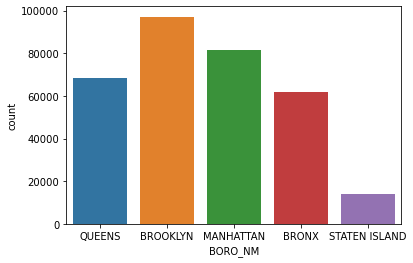

In [26]:
sns.countplot(data=crime_df,x='BORO_NM')

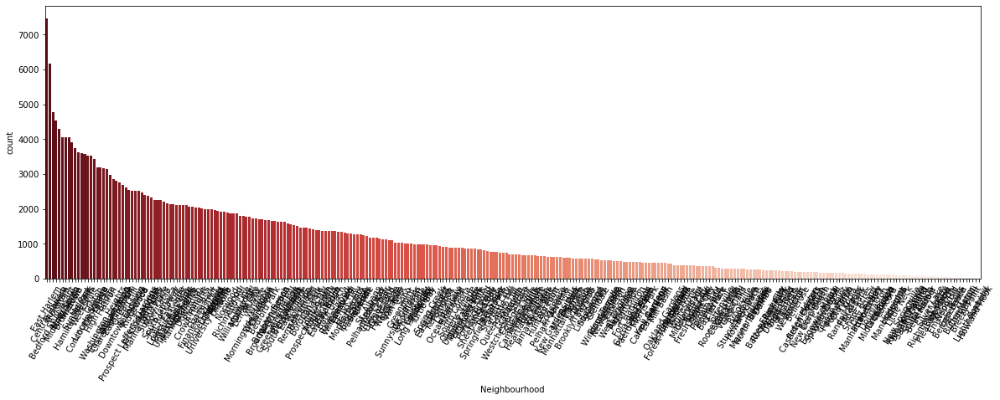

In [27]:
plt.figure(figsize=(20,6))
g=sns.countplot(data=crime_df,x='Neighbourhood', order = crime_df['Neighbourhood'].value_counts().index,
               palette=sns.color_palette('Reds_r', 299))
g.set_xticklabels(g.get_xticklabels(), rotation=60);

Quite a substantial variation, but we can't plot this graph with visible labels in a reasonable area, so instead let's see the 10 neighbourhoods with the most and least crime.

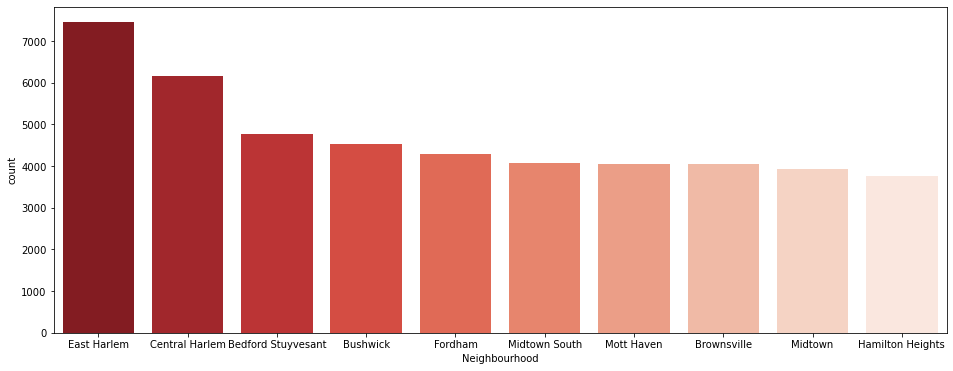

In [28]:
plt.figure(figsize=(16,6))
g=sns.countplot(data=crime_df[crime_df['Neighbourhood'].isin(crime_df['Neighbourhood'].value_counts()[0:10].index)],
                x='Neighbourhood', order = crime_df['Neighbourhood'].value_counts().index[0:10],
               palette=sns.color_palette('Reds_r', 10))
# g.set_xticklabels(g.get_xticklabels(), rotation=60);

# crime_df[crime_df['Neighbourhood'].isin(crime_df['Neighbourhood'].value_counts()[0:10].index)]

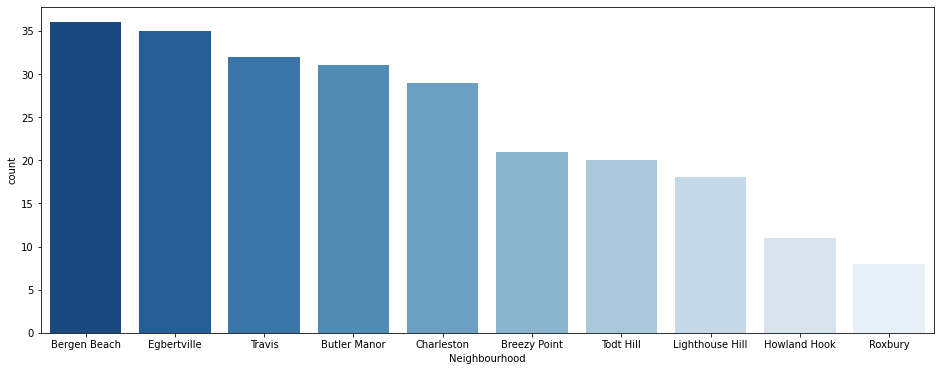

In [29]:
plt.figure(figsize=(16,6))
g=sns.countplot(data=crime_df[crime_df['Neighbourhood'].isin(crime_df['Neighbourhood'].value_counts()[-10:].index)],
                x='Neighbourhood', order = crime_df['Neighbourhood'].value_counts().index[-10:],
               palette=sns.color_palette('Blues_r', 10))
# g.set_xticklabels(g.get_xticklabels(), rotation=60);

<AxesSubplot:xlabel='LOC_OF_OCCUR_DESC', ylabel='count'>

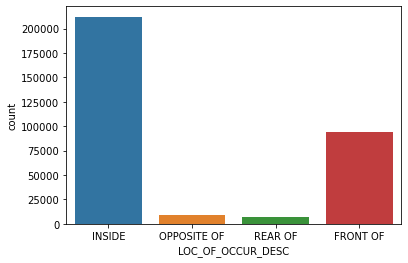

In [30]:
sns.countplot(data = crime_df, x ='LOC_OF_OCCUR_DESC')


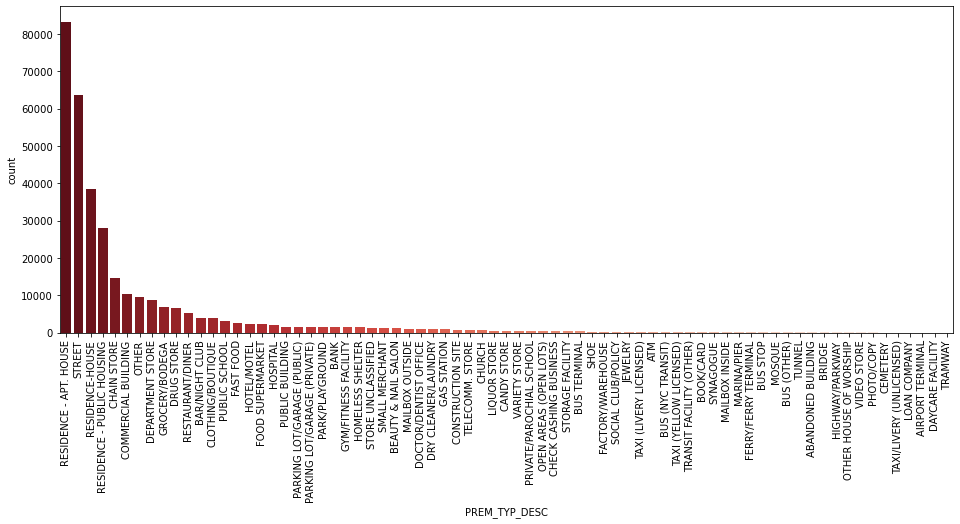

In [31]:
plt.figure(figsize=(16,6))
g=sns.countplot(data = crime_df, x = 'PREM_TYP_DESC', order = crime_df['PREM_TYP_DESC'].value_counts().index,
               palette=sns.color_palette('Reds_r', len(crime_df['PREM_TYP_DESC'].unique())))
g.set_xticklabels(g.get_xticklabels(), rotation = 90);
#g.set_xticklabels(list(premises_enc.inverse_transform(sorted(crime_df['PREM_TYP_DESC'].tolist()))))
# plt.xticks(rotation = -45)

How long are crimes typically active for? What types of crime take longest to solve? Are there areas where this duration increases? Decreases? Let's examine our durations to figure it out. 

Note that almost all incidents are resolved the same day they begin, so durations of 0 are by far the majority - we'll exclude the 0 duration incidents from many parts of our examination simply so that we can see what the distribution looks like for incidents that actually took time to resolve. Most 0 duration incidents are minor offences.

(0.0, 50.0)

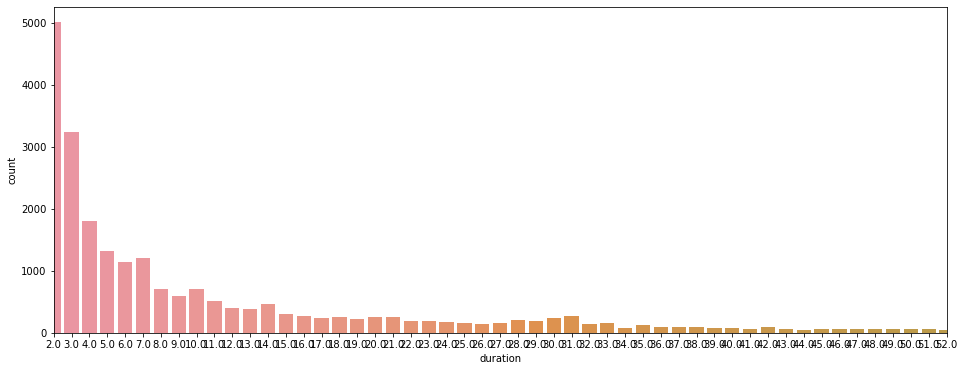

In [32]:
plt.figure(figsize = (16,6))
sns.countplot(data=crime_df[crime_df['duration']>1], x='duration')
plt.xlim([0,50]) #very few durations above this

<AxesSubplot:xlabel='VIC_AGE_GROUP', ylabel='count'>

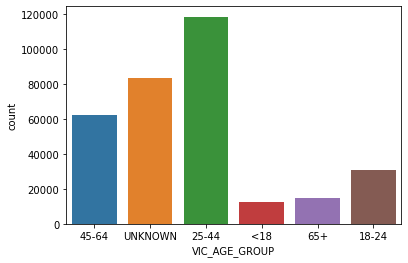

In [33]:
sns.countplot(data=crime_df, x='VIC_AGE_GROUP')

In [68]:
ages = {0:'UNKNOWN', 1:'<18', 2:'18-24', 3:'25-44', 4:'45-64', 5:'65+'}
crime_df['VIC_AGE_GROUP'] = crime_df['VIC_AGE_GROUP'].map(ages)

In [70]:
#convert age groups into numbers so we can sort them in ascending order
ages = {'UNKNOWN': 0, '<18':1, '18-24':2, '25-44':3, '45-64':4, '65+':5}
crime_df['VIC_AGE_GROUP'] = crime_df['VIC_AGE_GROUP'].map(ages)
crime_df.head()

,LOC_OF_OCCUR_DESC,OFNS_DESC,PD_DESC,CRM_ATPT_CPTD_CD,PREM_TYP_DESC,VIC_AGE_GROUP,VIC_RACE,VIC_SEX,Neighbourhood,duration,...,MISDEMEANOR,VIOLATION,Internal - Police,Internal - Housing,External,BRONX,BROOKLYN,MANHATTAN,QUEENS,STATEN ISLAND
CMPLNT_NUM,,,,,,,,,,,,,,,,,,,,,
921926672,1,23,140,1,18,4,BLACK HISPANIC,M,141,253.0,...,0,0,1,0,0,0,0,0,1,0
548795490,0,9,70,1,44,0,UNKNOWN,E,167,360.0,...,1,0,1,0,0,0,1,0,0,0
287029243,0,9,70,1,14,0,UNKNOWN,D,211,360.0,...,1,0,1,0,0,0,1,0,0,0
485024356,0,9,70,1,54,0,UNKNOWN,E,36,353.0,...,1,0,0,1,0,0,1,0,0,0
344711717,1,23,148,1,55,3,WHITE,M,40,304.0,...,0,0,1,0,0,0,0,1,0,0


C:\Users\Jack\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: FixedFormatter should only be used together with FixedLocator
  after removing the cwd from sys.path.


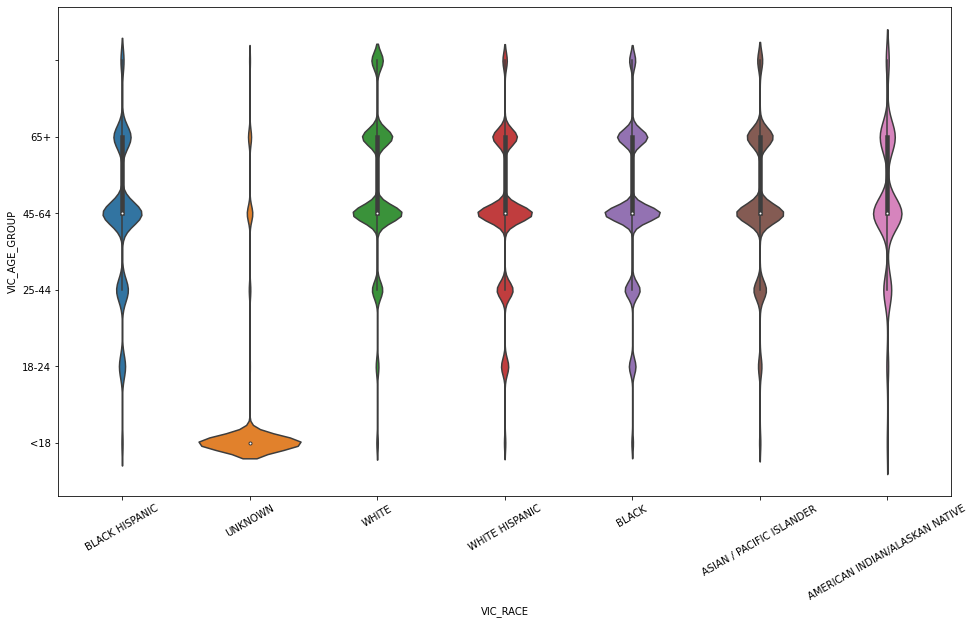

In [73]:
plt.figure(figsize=(16,9))
g=sns.violinplot(data=crime_df, x='VIC_RACE', y='VIC_AGE_GROUP')
g.set_xticklabels(g.get_xticklabels(), rotation=30);
g.set_yticklabels(ages.keys());

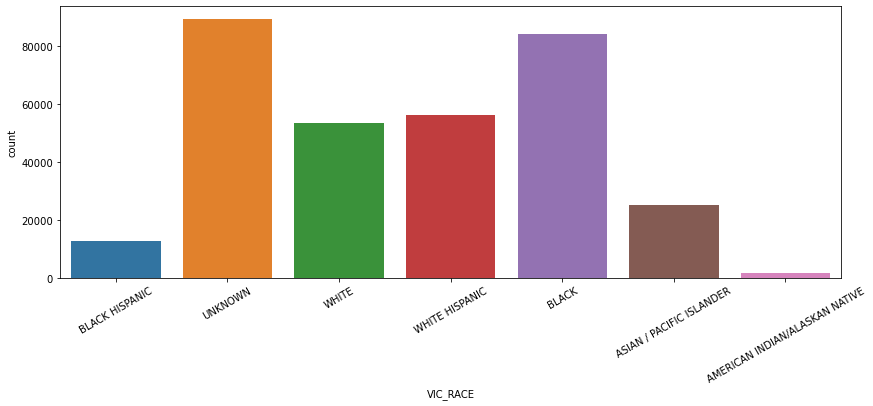

In [36]:
plt.figure(figsize=(14,5))
g=sns.countplot(data=crime_df, x='VIC_RACE')
g.set_xticklabels(g.get_xticklabels(), rotation=30);

(0.0, 50.0)

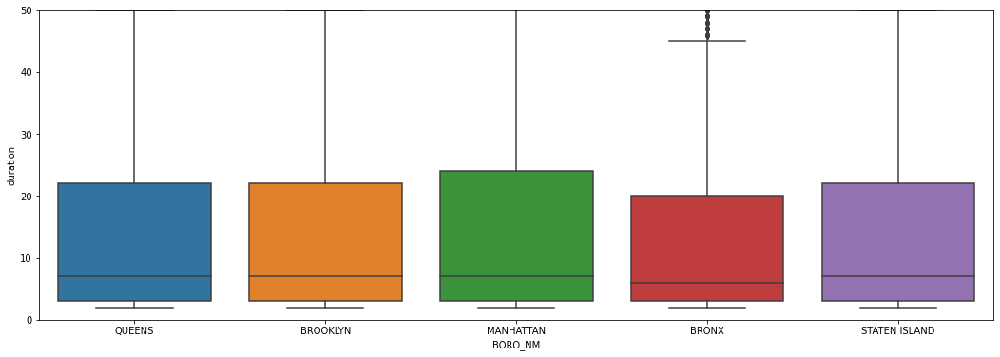

In [38]:
plt.figure(figsize=(18,6))
sns.boxplot(data=crime_df[crime_df['duration']>1],
                x='BORO_NM', y='duration')
plt.ylim((0,50))

Incidents which are take more than a day to resolve are most common in Manhattan, and incidents are most quickly resolved in the Bronx.

# Clustering

Having examined the data, we now want to find whatever structure exists in it and identify areas of concern, as well as areas with low incident counts. We will cluster the data on a neighbourhood level to do this, but first we need to prepare the data for our algorithm.

In [41]:
from sklearn.preprocessing import LabelEncoder

off_enc = LabelEncoder()
crime_df['OFNS_DESC'] = off_enc.fit_transform(crime_df['OFNS_DESC'])

outcome_enc = LabelEncoder()
crime_df['CRM_ATPT_CPTD_CD'] = outcome_enc.fit_transform(crime_df['CRM_ATPT_CPTD_CD'])

premises_enc = LabelEncoder()
crime_df['PREM_TYP_DESC'] = premises_enc.fit_transform(crime_df['PREM_TYP_DESC'])

pddesc_enc = LabelEncoder()
crime_df['PD_DESC'] = pddesc_enc.fit_transform(crime_df['PD_DESC'])

nbh_enc = LabelEncoder()
crime_df['Neighbourhood'] = nbh_enc.fit_transform(crime_df['Neighbourhood'])

#as far as location, we are only concerned with indoor and outdoor incidents
crime_df['LOC_OF_OCCUR_DESC'] = crime_df['LOC_OF_OCCUR_DESC'].apply(lambda x: 1 if x=='INSIDE' else 0)

crime_df.head()

,CMPLNT_NUM,LOC_OF_OCCUR_DESC,OFNS_DESC,PD_DESC,CRM_ATPT_CPTD_CD,LAW_CAT_CD,BORO_NM,JURISDICTION_CODE,PREM_TYP_DESC,Latitude,...,MISDEMEANOR,VIOLATION,Internal - Police,Internal - Housing,External,BRONX,BROOKLYN,MANHATTAN,QUEENS,STATEN ISLAND
1,921926672,1,23,140,1,FELONY,QUEENS,0.0,18,40.733927,...,0,0,1,0,0,0,0,0,1,0
2,548795490,0,9,70,1,MISDEMEANOR,BROOKLYN,0.0,44,40.628220,...,1,0,1,0,0,0,1,0,0,0
3,287029243,0,9,70,1,MISDEMEANOR,BROOKLYN,0.0,14,40.654215,...,1,0,1,0,0,0,1,0,0,0
5,485024356,0,9,70,1,MISDEMEANOR,BROOKLYN,2.0,54,40.693021,...,1,0,0,1,0,0,1,0,0,0
6,344711717,1,23,148,1,FELONY,MANHATTAN,0.0,55,40.784051,...,0,0,1,0,0,0,0,1,0,0


In [42]:
crime_df.drop(['BORO_NM', 'JURISDICTION_CODE', 'LAW_CAT_CD', 'Latitude', 'Longitude'], axis=1, inplace=True)
crime_df = crime_df.set_index('CMPLNT_NUM')
crime_df.head()

,LOC_OF_OCCUR_DESC,OFNS_DESC,PD_DESC,CRM_ATPT_CPTD_CD,PREM_TYP_DESC,VIC_AGE_GROUP,VIC_RACE,VIC_SEX,Neighbourhood,duration,...,MISDEMEANOR,VIOLATION,Internal - Police,Internal - Housing,External,BRONX,BROOKLYN,MANHATTAN,QUEENS,STATEN ISLAND
CMPLNT_NUM,,,,,,,,,,,,,,,,,,,,,
921926672,1,23,140,1,18,4,BLACK HISPANIC,M,141,253.0,...,0,0,1,0,0,0,0,0,1,0
548795490,0,9,70,1,44,0,UNKNOWN,E,167,360.0,...,1,0,1,0,0,0,1,0,0,0
287029243,0,9,70,1,14,0,UNKNOWN,D,211,360.0,...,1,0,1,0,0,0,1,0,0,0
485024356,0,9,70,1,54,0,UNKNOWN,E,36,353.0,...,1,0,0,1,0,0,1,0,0,0
344711717,1,23,148,1,55,3,WHITE,M,40,304.0,...,0,0,1,0,0,0,0,1,0,0


In [43]:
from sklearn.preprocessing import LabelEncoder
count_df 

,Incident_Count,Name,Latitude,Longitude,Ven_Cat_Pop_1,Ven_Cat_Pop_2,Ven_Cat_Pop_3,Ven_Cat_Pop_4,Ven_Cat_Pop_5,mean_duration,FELONY,MISDEMEANOR,VIOLATION,Internal - Police,Internal - Housing,External
0,72,Annadale,40.538114,-74.178549,American Restaurant,Pizza Place,Dance Studio,Deli / Bodega,Diner,4.083333,15,50,7,63,9,0
1,193,Arden Heights,40.549286,-74.185887,Bus Stop,Coffee Shop,Deli / Bodega,Pharmacy,Pizza Place,3.663212,53,105,35,178,13,2
2,583,Arlington,40.635325,-74.165104,Boat or Ferry,Bus Stop,Coffee Shop,Deli / Bodega,Grocery Store,1.090909,164,323,96,535,41,7
3,202,Arrochar,40.596313,-74.067124,Bus Stop,Deli / Bodega,Italian Restaurant,Athletics & Sports,Bagel Shop,2.059406,60,99,43,181,20,1
4,615,Arverne,40.589144,-73.791992,Surf Spot,Metro Station,Sandwich Place,Beach,Board Shop,1.310569,204,322,89,552,51,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
294,1016,Woodhaven,40.689887,-73.858110,Deli / Bodega,Bank,Park,Pharmacy,Arepa Restaurant,1.836614,309,546,161,930,78,8
295,658,Woodlawn,40.898273,-73.867315,Deli / Bodega,Pub,Bar,Pizza Place,Playground,1.577508,198,331,129,599,51,8
296,54,Woodrow,40.537453,-74.221351,Gym / Fitness Center,Historic Site,Home Service,Intersection,Racetrack,4.185185,26,19,9,47,7,0
297,1471,Woodside,40.746349,-73.901842,Grocery Store,Bakery,Filipino Restaurant,Latin American Restaurant,Thai Restaurant,2.110809,456,762,253,1330,128,13


In [44]:
cols = ['Ven_Cat_Pop_'+ str(x) for x in range(1,6)]
venue_types = np.unique(count_df[cols].to_numpy().flatten())

# ven_enc = LabelEncoder()
# ven_enc.fit(venue_types)
# for col in cols:
#     count_df[col] = ven_enc.transform(count_df[col])
    
count_df

,Incident_Count,Name,Latitude,Longitude,Ven_Cat_Pop_1,Ven_Cat_Pop_2,Ven_Cat_Pop_3,Ven_Cat_Pop_4,Ven_Cat_Pop_5,mean_duration,FELONY,MISDEMEANOR,VIOLATION,Internal - Police,Internal - Housing,External
0,72,Annadale,40.538114,-74.178549,American Restaurant,Pizza Place,Dance Studio,Deli / Bodega,Diner,4.083333,15,50,7,63,9,0
1,193,Arden Heights,40.549286,-74.185887,Bus Stop,Coffee Shop,Deli / Bodega,Pharmacy,Pizza Place,3.663212,53,105,35,178,13,2
2,583,Arlington,40.635325,-74.165104,Boat or Ferry,Bus Stop,Coffee Shop,Deli / Bodega,Grocery Store,1.090909,164,323,96,535,41,7
3,202,Arrochar,40.596313,-74.067124,Bus Stop,Deli / Bodega,Italian Restaurant,Athletics & Sports,Bagel Shop,2.059406,60,99,43,181,20,1
4,615,Arverne,40.589144,-73.791992,Surf Spot,Metro Station,Sandwich Place,Beach,Board Shop,1.310569,204,322,89,552,51,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
294,1016,Woodhaven,40.689887,-73.858110,Deli / Bodega,Bank,Park,Pharmacy,Arepa Restaurant,1.836614,309,546,161,930,78,8
295,658,Woodlawn,40.898273,-73.867315,Deli / Bodega,Pub,Bar,Pizza Place,Playground,1.577508,198,331,129,599,51,8
296,54,Woodrow,40.537453,-74.221351,Gym / Fitness Center,Historic Site,Home Service,Intersection,Racetrack,4.185185,26,19,9,47,7,0
297,1471,Woodside,40.746349,-73.901842,Grocery Store,Bakery,Filipino Restaurant,Latin American Restaurant,Thai Restaurant,2.110809,456,762,253,1330,128,13


In [45]:
count_df = count_df.set_index('Name')
count_df

,Incident_Count,Latitude,Longitude,Ven_Cat_Pop_1,Ven_Cat_Pop_2,Ven_Cat_Pop_3,Ven_Cat_Pop_4,Ven_Cat_Pop_5,mean_duration,FELONY,MISDEMEANOR,VIOLATION,Internal - Police,Internal - Housing,External
Name,,,,,,,,,,,,,,,
Annadale,72,40.538114,-74.178549,American Restaurant,Pizza Place,Dance Studio,Deli / Bodega,Diner,4.083333,15,50,7,63,9,0
Arden Heights,193,40.549286,-74.185887,Bus Stop,Coffee Shop,Deli / Bodega,Pharmacy,Pizza Place,3.663212,53,105,35,178,13,2
Arlington,583,40.635325,-74.165104,Boat or Ferry,Bus Stop,Coffee Shop,Deli / Bodega,Grocery Store,1.090909,164,323,96,535,41,7
Arrochar,202,40.596313,-74.067124,Bus Stop,Deli / Bodega,Italian Restaurant,Athletics & Sports,Bagel Shop,2.059406,60,99,43,181,20,1
Arverne,615,40.589144,-73.791992,Surf Spot,Metro Station,Sandwich Place,Beach,Board Shop,1.310569,204,322,89,552,51,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Woodhaven,1016,40.689887,-73.858110,Deli / Bodega,Bank,Park,Pharmacy,Arepa Restaurant,1.836614,309,546,161,930,78,8
Woodlawn,658,40.898273,-73.867315,Deli / Bodega,Pub,Bar,Pizza Place,Playground,1.577508,198,331,129,599,51,8
Woodrow,54,40.537453,-74.221351,Gym / Fitness Center,Historic Site,Home Service,Intersection,Racetrack,4.185185,26,19,9,47,7,0


We can see that there are several standout premeses where incidents are more frequent. Most occur in residencies, but stores, bars and restaurants are not infrequent 

We don't know how many clusters we have, so we can't use KMeans or similar - we'll use DBSCAN to cluster the incidents. In this case, we are particularly interested in outliers - neighbourhoods that don't fit their local pattern - and what causes them.

In [46]:
from sklearn.cluster import DBSCAN

dbsc = DBSCAN(eps=0.82, min_samples = 3)

#There are two conditions we want to minimise - the number of clusters, and the number of outliers
#we expect more outliers than clusters, so we need to normalise the counts
#norm_clusters = cluster_count / neighbourhood_count
#norm_outliers = sum of -ve values / total num values (-1 represents an outlier)
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
count_scaled = scaler.fit_transform(count_df[['Incident_Count', 'Latitude', 'Longitude', 'mean_duration', 'FELONY', 'MISDEMEANOR',
                                              'VIOLATION']])
clusters = dbsc.fit_predict(count_scaled)
clusters
    
    

array([ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0, -1,
        0,  0, -1, -1,  0,  0,  1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0, -1,  0, -1,  0,  0,  0,  0,  0,  0,  0, -1,  0,  0, -1,  0, -1,
        0,  0,  0,  0,  0,  2,  0,  0,  0,  0,  0, -1,  0,  0,  0,  0,  0,
        0,  0,  0,  0, -1,  0,  0,  0, -1, -1,  0,  0,  0, -1,  0,  0,  0,
       -1,  0,  0,  0,  0,  0, -1,  3,  0,  0,  2,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0, -1,  0,  0,  0, -1,  0,  0,  0, -1,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  2,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0, -1,  0,  0,  0, -1,  0,  0,  0,  0,  0,  2,  2,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0, -1,  0,  1,  0,  0,  0,  0,
        0,  0,  0, -1,  0,  0,  0,  0, -1,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0, -1,  0,  0,  0,  0,  0, -1,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0

In [47]:
count_df['Cluster'] = clusters
count_df

,Incident_Count,Latitude,Longitude,Ven_Cat_Pop_1,Ven_Cat_Pop_2,Ven_Cat_Pop_3,Ven_Cat_Pop_4,Ven_Cat_Pop_5,mean_duration,FELONY,MISDEMEANOR,VIOLATION,Internal - Police,Internal - Housing,External,Cluster
Name,,,,,,,,,,,,,,,,
Annadale,72,40.538114,-74.178549,American Restaurant,Pizza Place,Dance Studio,Deli / Bodega,Diner,4.083333,15,50,7,63,9,0,0
Arden Heights,193,40.549286,-74.185887,Bus Stop,Coffee Shop,Deli / Bodega,Pharmacy,Pizza Place,3.663212,53,105,35,178,13,2,0
Arlington,583,40.635325,-74.165104,Boat or Ferry,Bus Stop,Coffee Shop,Deli / Bodega,Grocery Store,1.090909,164,323,96,535,41,7,0
Arrochar,202,40.596313,-74.067124,Bus Stop,Deli / Bodega,Italian Restaurant,Athletics & Sports,Bagel Shop,2.059406,60,99,43,181,20,1,0
Arverne,615,40.589144,-73.791992,Surf Spot,Metro Station,Sandwich Place,Beach,Board Shop,1.310569,204,322,89,552,51,12,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Woodhaven,1016,40.689887,-73.858110,Deli / Bodega,Bank,Park,Pharmacy,Arepa Restaurant,1.836614,309,546,161,930,78,8,0
Woodlawn,658,40.898273,-73.867315,Deli / Bodega,Pub,Bar,Pizza Place,Playground,1.577508,198,331,129,599,51,8,0
Woodrow,54,40.537453,-74.221351,Gym / Fitness Center,Historic Site,Home Service,Intersection,Racetrack,4.185185,26,19,9,47,7,0,0


In [48]:
import matplotlib.cm as cm
import matplotlib.colors as colors

lon = loc_df['Longitude'].mean()
lat = loc_df['Latitude'].mean()
cluster_map = folium.Map(location = [lat, lon])

most_incidents = count_df['Incident_Count'].max()
mean_incidents = count_df['Incident_Count'].mean()
std_incidents = count_df['Incident_Count'].std()
colors_array = cm.rainbow(np.linspace(0, 1, len(count_df['Cluster'].unique())))
rainbow = [colors.rgb2hex(i) for i in colors_array]

for lat, lng, neighbourhood, count, cluster in zip(count_df['Latitude'], count_df['Longitude'], 
                                                   count_df.index, count_df['Incident_Count'], count_df['Cluster']):
    label = '{}, {} Incidents, Cluster {}'.format(neighbourhood, count, cluster)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker([lat, lng],
                        radius= 5*((int(count)-mean_incidents)/std_incidents), #highlight areas with more incidents using larger circles
                        popup=label,
                        color=rainbow[cluster+1],
                        fill=True,
                        fill_color=rainbow[cluster+1],
                        fill_opacity=0.4,
                        parse_html=False).add_to(cluster_map)

cluster_map

In [49]:
count_df[count_df['Cluster'] == -1].describe()

,Incident_Count,Latitude,Longitude,mean_duration,FELONY,MISDEMEANOR,VIOLATION,Internal - Police,Internal - Housing,External,Cluster
count,29.000000,29.000000,29.000000,29.000000,29.000000,29.000000,29.000000,29.000000,29.000000,29.000000,29.0
mean,2327.413793,40.726689,-73.898733,2.847360,713.862069,1231.862069,381.689655,2088.172414,208.000000,31.241379,-1.0
std,1894.036478,0.088424,0.091403,1.147487,573.686495,1011.223295,310.518702,1690.903500,180.864985,25.529612,0.0
min,72.000000,40.576156,-74.189560,1.283900,23.000000,38.000000,11.000000,68.000000,3.000000,1.000000,-1.0
25%,602.000000,40.658420,-73.941785,1.831376,177.000000,327.000000,98.000000,534.000000,57.000000,10.000000,-1.0
50%,2393.000000,40.723825,-73.915589,2.496868,753.000000,1277.000000,354.000000,2157.000000,211.000000,28.000000,-1.0
75%,3192.000000,40.797307,-73.829368,3.868771,1003.000000,1678.000000,522.000000,2881.000000,286.000000,47.000000,-1.0
max,7455.000000,40.908543,-73.720128,5.164234,2239.000000,3983.000000,1233.000000,6596.000000,752.000000,107.000000,-1.0


In [50]:
count_df[count_df['Cluster'] == 0].describe()

,Incident_Count,Latitude,Longitude,mean_duration,FELONY,MISDEMEANOR,VIOLATION,Internal - Police,Internal - Housing,External,Cluster
count,259.000000,259.000000,259.000000,259.000000,259.000000,259.000000,259.000000,259.000000,259.000000,259.000000,259.0
mean,933.200772,40.695518,-73.953187,1.895019,285.328185,491.100386,156.772201,840.706564,80.664093,11.830116,0.0
std,820.733482,0.095958,0.125731,0.722666,250.779027,431.763463,139.227570,737.609374,73.257160,11.333309,0.0
min,11.000000,40.505334,-74.246569,0.181818,1.000000,9.000000,1.000000,10.000000,0.000000,0.000000,0.0
25%,283.000000,40.615037,-74.014814,1.384275,85.000000,148.500000,48.000000,253.500000,23.500000,3.000000,0.0
50%,675.000000,40.694445,-73.943291,1.829032,206.000000,350.000000,112.000000,606.000000,55.000000,8.000000,0.0
75%,1395.000000,40.760992,-73.857672,2.257797,437.000000,736.500000,240.000000,1250.000000,126.000000,18.000000,0.0
max,4288.000000,40.898273,-73.708847,4.185185,1325.000000,2235.000000,728.000000,3867.000000,392.000000,60.000000,0.0


In [51]:
count_df[count_df['Cluster'] == 1].describe()

,Incident_Count,Latitude,Longitude,mean_duration,FELONY,MISDEMEANOR,VIOLATION,Internal - Police,Internal - Housing,External,Cluster
count,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.0
mean,30.666667,40.584854,-73.882747,0.150463,8.000000,19.333333,3.333333,28.666667,1.333333,0.666667,1.0
std,20.526406,0.026340,0.022059,0.032818,4.358899,13.576941,2.886751,19.604421,1.527525,1.154701,0.0
min,8.000000,40.567376,-73.898556,0.125000,3.000000,5.000000,0.000000,8.000000,0.000000,0.000000,1.0
25%,22.000000,40.569706,-73.895347,0.131944,6.500000,13.000000,2.500000,19.500000,0.500000,0.000000,1.0
50%,36.000000,40.572037,-73.892138,0.138889,10.000000,21.000000,5.000000,31.000000,1.000000,0.000000,1.0
75%,42.000000,40.593593,-73.874842,0.163194,10.500000,26.500000,5.000000,39.000000,2.000000,1.000000,1.0
max,48.000000,40.615150,-73.857547,0.187500,11.000000,32.000000,5.000000,47.000000,3.000000,2.000000,1.0


In [52]:
count_df[count_df['Cluster'] == 2].describe()

,Incident_Count,Latitude,Longitude,mean_duration,FELONY,MISDEMEANOR,VIOLATION,Internal - Police,Internal - Housing,External,Cluster
count,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.0
mean,3618.200000,40.754947,-73.988615,1.637848,1134.800000,1896.800000,586.600000,3273.000000,299.400000,45.800000,2.0
std,376.171105,0.012565,0.005594,0.272719,131.021754,198.332297,51.752295,358.242934,30.352924,10.425929,0.0
min,3134.000000,40.739673,-73.996408,1.271538,966.000000,1643.000000,525.000000,2828.000000,263.000000,36.000000,2.0
25%,3441.000000,40.748510,-73.990947,1.430152,1069.000000,1808.000000,563.000000,3078.000000,290.000000,40.000000,2.0
50%,3529.000000,40.754691,-73.988713,1.752107,1105.000000,1861.000000,564.000000,3199.000000,297.000000,43.000000,2.0
75%,3921.000000,40.758334,-73.985338,1.840857,1266.000000,2008.000000,636.000000,3538.000000,300.000000,47.000000,2.0
max,4066.000000,40.773529,-73.981669,1.894588,1268.000000,2164.000000,645.000000,3722.000000,347.000000,63.000000,2.0


In [53]:
count_df[count_df['Cluster'] == 3].describe()

,Incident_Count,Latitude,Longitude,mean_duration,FELONY,MISDEMEANOR,VIOLATION,Internal - Police,Internal - Housing,External,Cluster
count,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.0
mean,191.666667,40.889222,-73.911806,2.404653,66.000000,97.000000,28.666667,175.000000,13.000000,3.666667,3.0
std,17.785762,0.007159,0.005813,0.225538,7.549834,22.605309,3.511885,16.370706,2.645751,1.154701,0.0
min,179.000000,40.881395,-73.917190,2.169811,59.000000,78.000000,25.000000,161.000000,10.000000,3.000000,3.0
25%,181.500000,40.886115,-73.914888,2.297196,62.000000,84.500000,27.000000,166.000000,12.000000,3.000000,3.0
50%,184.000000,40.890834,-73.912585,2.424581,65.000000,91.000000,29.000000,171.000000,14.000000,3.000000,3.0
75%,198.000000,40.893136,-73.909114,2.522073,69.500000,106.500000,30.500000,182.000000,14.500000,4.000000,3.0
max,212.000000,40.895437,-73.905643,2.619565,74.000000,122.000000,32.000000,193.000000,15.000000,5.000000,3.0


In [54]:
rainbow

['#8000ff', '#00b5eb', '#80ffb4', '#ffb360', '#ff0000']

## Cluster Observations
Cluster -1, purple on the map, are the outliers. These are of interest to us, because we wish to know the reason they are outliers. Mostly, looking at the map, they appear to be neighbourhoods with higher crime rates than their neighbours.

Cluster 0, light blue on the map, appears to represent neighbourhoods which are typical of their local area. These are the ones we are least interested in.

Cluster 1, bright green, appears to represent a section of particularly low-duration, low-seriousness incidents. 

Cluster 2, in orange, represents a high crime area of Midtown, in Manhattan, but not quite so high as the extreme values seen north of that.

Cluster 3, which is red, bears many similarities to cluster 1, and may exist for the same reasons with only physical distance preventing it from being clustered together with cluster 1.

We should examine these clusters more closely, and look for common trends.

In [55]:
count_df.describe()

,Incident_Count,Latitude,Longitude,mean_duration,FELONY,MISDEMEANOR,VIOLATION,Internal - Police,Internal - Housing,External,Cluster
count,299.000000,299.000000,299.000000,299.000000,299.000000,299.000000,299.000000,299.000000,299.000000,299.000000,299.000000
mean,1096.829431,40.700368,-73.947376,1.970695,336.113712,577.765886,182.949833,987.545151,95.197324,14.086957,-0.023411
std,1104.154188,0.096669,0.121730,0.833121,338.012391,583.808330,183.346010,990.746539,100.052626,15.058693,0.514345
min,8.000000,40.505334,-74.246569,0.125000,1.000000,5.000000,0.000000,8.000000,0.000000,0.000000,-1.000000
25%,277.500000,40.619186,-74.000515,1.401872,85.000000,147.500000,47.000000,245.000000,23.000000,3.000000,0.000000
50%,690.000000,40.698791,-73.932442,1.853292,218.000000,369.000000,119.000000,630.000000,56.000000,9.000000,0.000000
75%,1644.000000,40.765083,-73.857532,2.378979,510.500000,856.000000,273.000000,1476.000000,136.000000,20.500000,0.000000
max,7455.000000,40.908543,-73.708847,5.164234,2239.000000,3983.000000,1233.000000,6596.000000,752.000000,107.000000,3.000000


In [56]:
count_df[count_df['Cluster'] == 1]

,Incident_Count,Latitude,Longitude,Ven_Cat_Pop_1,Ven_Cat_Pop_2,Ven_Cat_Pop_3,Ven_Cat_Pop_4,Ven_Cat_Pop_5,mean_duration,FELONY,MISDEMEANOR,VIOLATION,Internal - Police,Internal - Housing,External,Cluster
Name,,,,,,,,,,,,,,,,
Bergen Beach,36,40.615150,-73.898556,Harbor / Marina,Athletics & Sports,Baseball Field,Hockey Field,Park,0.138889,10,21,5,31,3,2,1
Neponsit,48,40.572037,-73.857547,Beach,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,0.187500,11,32,5,47,1,0,1
Roxbury,8,40.567376,-73.892138,Baseball Field,Beach,Deli / Bodega,Fast Food Restaurant,Irish Pub,0.125000,3,5,0,8,0,0,1


The standout feature of these neighbourhoods is that the mean_duration is very low. We also notice that most incidents are misdemeanours - less serious than felonies. Almost all of these incidents were resolved by the police, and the total count of incidents is low.

There are also plenty of public spaces represented in these areas, which is probably a factor in the low incident count.

In [57]:
count_df[count_df['Cluster'] == 3]

,Incident_Count,Latitude,Longitude,Ven_Cat_Pop_1,Ven_Cat_Pop_2,Ven_Cat_Pop_3,Ven_Cat_Pop_4,Ven_Cat_Pop_5,mean_duration,FELONY,MISDEMEANOR,VIOLATION,Internal - Police,Internal - Housing,External,Cluster
Name,,,,,,,,,,,,,,,,
Fieldston,184,40.895437,-73.905643,Medical Supply Store,Plaza,River,Accessories Store,Adult Boutique,2.619565,74,78,32,171,10,3,3
Riverdale,212,40.890834,-73.912585,Park,Bank,Bus Station,Food Truck,Gym,2.169811,65,122,25,193,14,5,3
Spuyten Duyvil,179,40.881395,-73.917190,Park,Asian Restaurant,Bank,Grocery Store,Intersection,2.424581,59,91,29,161,15,3,3


Like cluster 1, cluster 3 has plenty of public spaces. The durations in this cluster are higher though, so whatever incidents do happen take longer to resolve.

In [58]:
count_df[count_df['Cluster'] == 2]

,Incident_Count,Latitude,Longitude,Ven_Cat_Pop_1,Ven_Cat_Pop_2,Ven_Cat_Pop_3,Ven_Cat_Pop_4,Ven_Cat_Pop_5,mean_duration,FELONY,MISDEMEANOR,VIOLATION,Internal - Police,Internal - Housing,External,Cluster
Name,,,,,,,,,,,,,,,,
Clinton,3441,40.758334,-73.996408,Theater,American Restaurant,Gym / Fitness Center,Italian Restaurant,Coffee Shop,1.752107,1069,1808,564,3078,300,63,2
Flatiron,3134,40.739673,-73.990947,Italian Restaurant,Japanese Restaurant,New American Restaurant,American Restaurant,Cycle Studio,1.271538,966,1643,525,2828,263,43,2
Lincoln Square,3529,40.773529,-73.985338,Plaza,Café,Concert Hall,Italian Restaurant,Performing Arts Venue,1.894588,1105,1861,563,3199,290,40,2
Midtown,3921,40.754691,-73.981669,Hotel,Clothing Store,Bakery,Coffee Shop,Sporting Goods Shop,1.840857,1268,2008,645,3538,347,36,2
Midtown South,4066,40.748510,-73.988713,Korean Restaurant,Hotel,Cosmetics Shop,Japanese Restaurant,American Restaurant,1.430152,1266,2164,636,3722,297,47,2


We see high Incident_Count values, which is as we expected, and we notice similarities among the most common venues, indicating that these neighbourhoods are similar. The mean duration is lower than the overall duration for the dataset. This are has a lot of tourist attractions, which always attracts crime, and is likely to be what defines this cluster.

In [59]:
count_df[count_df['Cluster'] == 0].describe()

,Incident_Count,Latitude,Longitude,mean_duration,FELONY,MISDEMEANOR,VIOLATION,Internal - Police,Internal - Housing,External,Cluster
count,259.000000,259.000000,259.000000,259.000000,259.000000,259.000000,259.000000,259.000000,259.000000,259.000000,259.0
mean,933.200772,40.695518,-73.953187,1.895019,285.328185,491.100386,156.772201,840.706564,80.664093,11.830116,0.0
std,820.733482,0.095958,0.125731,0.722666,250.779027,431.763463,139.227570,737.609374,73.257160,11.333309,0.0
min,11.000000,40.505334,-74.246569,0.181818,1.000000,9.000000,1.000000,10.000000,0.000000,0.000000,0.0
25%,283.000000,40.615037,-74.014814,1.384275,85.000000,148.500000,48.000000,253.500000,23.500000,3.000000,0.0
50%,675.000000,40.694445,-73.943291,1.829032,206.000000,350.000000,112.000000,606.000000,55.000000,8.000000,0.0
75%,1395.000000,40.760992,-73.857672,2.257797,437.000000,736.500000,240.000000,1250.000000,126.000000,18.000000,0.0
max,4288.000000,40.898273,-73.708847,4.185185,1325.000000,2235.000000,728.000000,3867.000000,392.000000,60.000000,0.0


In [60]:
count_df[count_df['Cluster'] == 0]

,Incident_Count,Latitude,Longitude,Ven_Cat_Pop_1,Ven_Cat_Pop_2,Ven_Cat_Pop_3,Ven_Cat_Pop_4,Ven_Cat_Pop_5,mean_duration,FELONY,MISDEMEANOR,VIOLATION,Internal - Police,Internal - Housing,External,Cluster
Name,,,,,,,,,,,,,,,,
Annadale,72,40.538114,-74.178549,American Restaurant,Pizza Place,Dance Studio,Deli / Bodega,Diner,4.083333,15,50,7,63,9,0,0
Arden Heights,193,40.549286,-74.185887,Bus Stop,Coffee Shop,Deli / Bodega,Pharmacy,Pizza Place,3.663212,53,105,35,178,13,2,0
Arlington,583,40.635325,-74.165104,Boat or Ferry,Bus Stop,Coffee Shop,Deli / Bodega,Grocery Store,1.090909,164,323,96,535,41,7,0
Arrochar,202,40.596313,-74.067124,Bus Stop,Deli / Bodega,Italian Restaurant,Athletics & Sports,Bagel Shop,2.059406,60,99,43,181,20,1,0
Arverne,615,40.589144,-73.791992,Surf Spot,Metro Station,Sandwich Place,Beach,Board Shop,1.310569,204,322,89,552,51,12,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Woodhaven,1016,40.689887,-73.858110,Deli / Bodega,Bank,Park,Pharmacy,Arepa Restaurant,1.836614,309,546,161,930,78,8,0
Woodlawn,658,40.898273,-73.867315,Deli / Bodega,Pub,Bar,Pizza Place,Playground,1.577508,198,331,129,599,51,8,0
Woodrow,54,40.537453,-74.221351,Gym / Fitness Center,Historic Site,Home Service,Intersection,Racetrack,4.185185,26,19,9,47,7,0,0


These seem to represent neighbourhoods which are a typical example of their local area. There may still be areas of concern among them, but in general are not areas of concern.

In [61]:
#since we can't look at all of these together, let's see the top 10, and the bottom 10, by incident count

#top 10:
count_df[count_df['Cluster'] == 0].sort_values('Incident_Count', ascending = False).iloc[0:10]

,Incident_Count,Latitude,Longitude,Ven_Cat_Pop_1,Ven_Cat_Pop_2,Ven_Cat_Pop_3,Ven_Cat_Pop_4,Ven_Cat_Pop_5,mean_duration,FELONY,MISDEMEANOR,VIOLATION,Internal - Police,Internal - Housing,External,Cluster
Name,,,,,,,,,,,,,,,,
Fordham,4288,40.860997,-73.896427,Mobile Phone Shop,Clothing Store,Bank,Donut Shop,Fast Food Restaurant,1.609841,1325,2235,728,3867,364,57,0
Mott Haven,4062,40.806239,-73.916100,Chinese Restaurant,Donut Shop,Gym,Pizza Place,Bakery,1.732152,1265,2119,678,3610,392,60,0
Hamilton Heights,3752,40.823604,-73.949688,Pizza Place,Café,Coffee Shop,Mexican Restaurant,Bakery,2.009861,1124,1970,658,3393,320,39,0
Melrose,3605,40.819754,-73.909422,Pizza Place,Pharmacy,Discount Store,Grocery Store,Sandwich Place,1.012205,1096,1898,611,3243,327,35,0
Concourse Village,3537,40.824780,-73.915847,Deli / Bodega,Fast Food Restaurant,Convenience Store,Mexican Restaurant,Pharmacy,1.525869,1065,1880,592,3180,299,58,0
High Bridge,3183,40.836623,-73.926102,Bus Station,Pharmacy,Chinese Restaurant,Food,Latin American Restaurant,1.146403,952,1686,545,2843,292,48,0
Claremont Village,2844,40.831428,-73.901199,Bus Station,Grocery Store,Bakery,Pizza Place,Caribbean Restaurant,1.344233,868,1497,479,2549,256,39,0
Mount Hope,2801,40.848842,-73.908299,Grocery Store,Pizza Place,Chinese Restaurant,Deli / Bodega,Donut Shop,1.389504,876,1422,503,2516,251,34,0
East Tremont,2755,40.842696,-73.887356,Pizza Place,Bank,Breakfast Spot,Café,Discount Store,1.131034,833,1447,475,2503,216,36,0


In [62]:
#bottom 10
count_df[count_df['Cluster'] == 0].sort_values('Incident_Count', ascending = True).iloc[0:10]


,Incident_Count,Latitude,Longitude,Ven_Cat_Pop_1,Ven_Cat_Pop_2,Ven_Cat_Pop_3,Ven_Cat_Pop_4,Ven_Cat_Pop_5,mean_duration,FELONY,MISDEMEANOR,VIOLATION,Internal - Police,Internal - Housing,External,Cluster
Name,,,,,,,,,,,,,,,,
Howland Hook,11,40.638433,-74.186223,Boat or Ferry,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,0.181818,1,9,1,10,1,0,0
Lighthouse Hill,18,40.576506,-74.137927,Art Museum,Café,Italian Restaurant,Massage Studio,Spa,0.222222,7,10,1,18,0,0,0
Todt Hill,20,40.597069,-74.111329,Park,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,2.500000,4,13,3,19,1,0,0
Breezy Point,21,40.557401,-73.925512,Beach,Bus Stop,Monument / Landmark,Trail,Accessories Store,1.380952,9,9,3,18,3,0,0
Charleston,29,40.530531,-74.232158,Big Box Store,Coffee Shop,Cosmetics Shop,Arts & Crafts Store,Bakery,4.068966,5,21,3,26,1,2,0
Butler Manor,31,40.506082,-74.229504,Baseball Field,Pool,Accessories Store,Adult Boutique,Afghan Restaurant,1.290323,9,15,7,27,3,1,0
Travis,32,40.586314,-74.190737,Hotel,Gym,Baseball Field,Bowling Alley,Café,0.250000,10,18,4,27,5,0,0
Egbertville,35,40.579119,-74.127272,Bagel Shop,Clothing Store,Cosmetics Shop,Italian Restaurant,Accessories Store,0.542857,7,21,7,30,4,1,0
Emerson Hill,49,40.606794,-74.097762,Construction & Landscaping,Food,Moving Target,Accessories Store,Adult Boutique,0.387755,16,24,9,37,11,1,0


In [63]:
count_df[count_df['Cluster'] == -1]

,Incident_Count,Latitude,Longitude,Ven_Cat_Pop_1,Ven_Cat_Pop_2,Ven_Cat_Pop_3,Ven_Cat_Pop_4,Ven_Cat_Pop_5,mean_duration,FELONY,MISDEMEANOR,VIOLATION,Internal - Police,Internal - Housing,External,Cluster
Name,,,,,,,,,,,,,,,,
Bedford Stuyvesant,4768,40.687232,-73.941785,Coffee Shop,Bar,Café,Pizza Place,BBQ Joint,1.831376,1429,2577,762,4285,425,58,-1
Belle Harbor,72,40.576156,-73.854018,Beach,Deli / Bodega,Pub,Spa,Bagel Shop,2.791667,23,38,11,68,3,1,-1
Bellerose,199,40.728573,-73.720128,Deli / Bodega,Italian Restaurant,American Restaurant,Bank,Diner,4.020101,78,95,26,179,16,4,-1
Brownsville,4057,40.663950,-73.910235,Fried Chicken Joint,Moving Target,Burger Joint,Chinese Restaurant,Convenience Store,1.507518,1232,2135,690,3597,407,53,-1
Bushwick,4531,40.698116,-73.925258,Bar,Coffee Shop,Mexican Restaurant,Deli / Bodega,Bakery,2.108365,1319,2472,740,4106,362,63,-1
Central Harlem,6168,40.815976,-73.943211,African Restaurant,American Restaurant,Bar,Chinese Restaurant,Cosmetics Shop,1.593061,1909,3262,997,5515,581,72,-1
Chelsea,2508,40.594726,-74.189560,Coffee Shop,American Restaurant,Art Gallery,Bakery,Ice Cream Shop,1.702951,766,1326,416,2258,221,29,-1
City Island,133,40.847247,-73.786488,Boat or Ferry,Park,Seafood Restaurant,Thrift / Vintage Store,American Restaurant,3.406015,36,67,30,123,7,3,-1
Concourse,3192,40.834284,-73.915589,Grocery Store,Deli / Bodega,Fast Food Restaurant,Fried Chicken Joint,Pizza Place,2.127193,1003,1678,511,2881,279,32,-1


Our outliers now - as we see, these contain a mix of high and low Incident_Count, meaning that there are neighbourhoods which are doing well, and those that need some form of assistance. To separate the two, we will use the mean Incident_Count from cluster 0, our average neighbourhoods.

In [66]:
z_mean = count_df[count_df['Cluster']==0]['Incident_Count'].mean()
low = count_df[(count_df['Cluster'] == -1) & (count_df['Incident_Count'] <= z_mean)]
low


,Incident_Count,Latitude,Longitude,Ven_Cat_Pop_1,Ven_Cat_Pop_2,Ven_Cat_Pop_3,Ven_Cat_Pop_4,Ven_Cat_Pop_5,mean_duration,FELONY,MISDEMEANOR,VIOLATION,Internal - Police,Internal - Housing,External,Cluster
Name,,,,,,,,,,,,,,,,
Belle Harbor,72,40.576156,-73.854018,Beach,Deli / Bodega,Pub,Spa,Bagel Shop,2.791667,23,38,11,68,3,1,-1
Bellerose,199,40.728573,-73.720128,Deli / Bodega,Italian Restaurant,American Restaurant,Bank,Diner,4.020101,78,95,26,179,16,4,-1
City Island,133,40.847247,-73.786488,Boat or Ferry,Park,Seafood Restaurant,Thrift / Vintage Store,American Restaurant,3.406015,36,67,30,123,7,3,-1
Edgewater Park,179,40.821986,-73.813885,Italian Restaurant,Coffee Shop,Deli / Bodega,Pizza Place,American Restaurant,3.905028,52,94,33,157,19,3,-1
Hillcrest,260,40.723825,-73.797603,College Academic Building,Donut Shop,Coffee Shop,College Basketball Court,College Stadium,4.796154,97,132,31,235,21,4,-1
Howard Beach,277,40.654225,-73.838138,Italian Restaurant,Pharmacy,Fast Food Restaurant,Sandwich Place,American Restaurant,3.263538,89,150,38,244,29,4,-1
Hunts Point,841,40.809730,-73.883315,BBQ Joint,Bank,Café,Farmers Market,Food,4.862069,265,445,131,729,65,47,-1
Marine Park,602,40.609748,-73.931344,Athletics & Sports,Baseball Field,Basketball Court,Chinese Restaurant,Deli / Bodega,3.868771,177,327,98,534,57,11,-1
North Riverdale,261,40.908543,-73.904531,Pizza Place,Bank,Chinese Restaurant,Italian Restaurant,Bagel Shop,3.908046,75,151,35,234,26,1,-1


In [65]:
z_mean = count_df[count_df['Cluster']==0]['Incident_Count'].mean()
high = count_df[(count_df['Cluster'] == -1) & (count_df['Incident_Count'] > z_mean)]
high

,Incident_Count,Latitude,Longitude,Ven_Cat_Pop_1,Ven_Cat_Pop_2,Ven_Cat_Pop_3,Ven_Cat_Pop_4,Ven_Cat_Pop_5,mean_duration,FELONY,MISDEMEANOR,VIOLATION,Internal - Police,Internal - Housing,External,Cluster
Name,,,,,,,,,,,,,,,,
Bedford Stuyvesant,4768,40.687232,-73.941785,Coffee Shop,Bar,Café,Pizza Place,BBQ Joint,1.831376,1429,2577,762,4285,425,58,-1
Brownsville,4057,40.663950,-73.910235,Fried Chicken Joint,Moving Target,Burger Joint,Chinese Restaurant,Convenience Store,1.507518,1232,2135,690,3597,407,53,-1
Bushwick,4531,40.698116,-73.925258,Bar,Coffee Shop,Mexican Restaurant,Deli / Bodega,Bakery,2.108365,1319,2472,740,4106,362,63,-1
Central Harlem,6168,40.815976,-73.943211,African Restaurant,American Restaurant,Bar,Chinese Restaurant,Cosmetics Shop,1.593061,1909,3262,997,5515,581,72,-1
Chelsea,2508,40.594726,-74.189560,Coffee Shop,American Restaurant,Art Gallery,Bakery,Ice Cream Shop,1.702951,766,1326,416,2258,221,29,-1
Concourse,3192,40.834284,-73.915589,Grocery Store,Deli / Bodega,Fast Food Restaurant,Fried Chicken Joint,Pizza Place,2.127193,1003,1678,511,2881,279,32,-1
Downtown Flushing,2677,40.761164,-73.829368,Chinese Restaurant,Bubble Tea Shop,Hotpot Restaurant,Dumpling Restaurant,Bakery,1.283900,826,1373,478,2378,264,35,-1
East Flatbush,1370,40.641718,-73.936103,Caribbean Restaurant,Chinese Restaurant,Department Store,Fast Food Restaurant,Food & Drink Shop,5.164234,422,730,218,1243,109,18,-1
East Harlem,7455,40.792249,-73.944182,Mexican Restaurant,Bakery,Thai Restaurant,Deli / Bodega,Latin American Restaurant,1.975989,2239,3983,1233,6596,752,107,-1


# Conclusion
Our low, cluster 1 and cluster 3 dataframes represent the areas of least concern. These are areas which do not appear to require any immediate action, and where current policies appear to be working.

Cluster 0 represents typical neighbourhoods - these areas have no outstanding or immediate issues for the most part, but there are of course edge cases which we should pay attention to.

Cluster 2 is an area of concern. We see that there is a group of Manhattan neighbourhoods which have concerning levels of incidents, and a high number of felonies - around a third of all incidents. The neighbourhoods in this cluster are in need of closer evaluation and attention from local authorities.

Our high dataframe is the areas of most concern, as these are the neighbourhoods where not only is the incident_count high, it is also abnormally high for its area. These are the areas most in need of attention, including further analysis to determine the reasons for their problems, and should be priority areas for any initiative to reduce crime levels.

See the full written report for further details.